In [1]:
'''
MIT License

Copyright (c) 2018 Brian McKean

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.
'''

'\nMIT License\n\nCopyright (c) 2018 Brian McKean\n\nPermission is hereby granted, free of charge, to any person obtaining a copy\nof this software and associated documentation files (the "Software"), to deal\nin the Software without restriction, including without limitation the rights\nto use, copy, modify, merge, publish, distribute, sublicense, and/or sell\ncopies of the Software, and to permit persons to whom the Software is\nfurnished to do so, subject to the following conditions:\n\nThe above copyright notice and this permission notice shall be included in all\ncopies or substantial portions of the Software.\n\nTHE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR\nIMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,\nFITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE\nAUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER\nLIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM

In [2]:
import pymongo
import pandas as pd
import numpy as np

from pymongo import MongoClient
from bson.objectid import ObjectId

import datetime

import matplotlib.pyplot as plt

from collections import defaultdict


%matplotlib inline
import json
plt.style.use('ggplot')
import seaborn as sns
from math import log10, floor
from time import time
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer



from sklearn.cluster import KMeans, MiniBatchKMeans
from IPython.display import Image
from IPython.core.display import HTML

import matplotlib.pyplot as plt
import urllib.request

In [3]:
## Connect to local DB

client = MongoClient('localhost', 27017)
print ("Setup db access")
#
# Get collections from mongodb
#

db = client.test

Setup db access


In [4]:
# Find all qual_id's
qual_ids =  db.anon_student_task_responses.distinct('qual_id')




In [5]:
# print (len(qual_ids), qual_ids)

In [6]:
# Get count of qual_id with failures
qual_id_counts =  db.anon_student_task_responses.aggregate(
  [{           
    '$group': {
      '_id': {
        'qual_id': '$qual_id'
      },
      'count': {
        '$sum': 1
      }
    }
    
  }
   ]
)

In [7]:
 qual_id_counts = list(qual_id_counts)

In [8]:
qual_count_df = pd.DataFrame(qual_id_counts)

In [9]:
# print (qual_id_counts)

In [10]:
# print (qual_count_df)

In [11]:
qual_count_df = qual_count_df.sort_values(by='count', ascending=False)

In [12]:
qual_count_df.reset_index(drop=True,inplace=True)
# print (qual_count_df)

In [13]:
qual_id_fail_counts =  db.anon_student_task_responses.aggregate(
  [{           
    '$group': {
      '_id': {
        'qual_id': '$qual_id',
        'correct': 'False'             
      },
      'count': {
        '$sum': 1
      }
    }
    
  }
   ]
)

In [14]:
qual_id_fail_counts = list(qual_id_fail_counts)

In [15]:
qual_fail_count_df = pd.DataFrame(qual_id_fail_counts)

In [16]:
qual_fail_count_df.sort_values(by='count', inplace=True, ascending=False)

In [17]:
# qual_fail_count_df 

In [18]:
## Functions for turning dictionary into document

def make_string_from_list(key, elem_list):
    # Append key to each item in list
    ans = ''
    for elem in elem_list:
        ans += key + '_' + elem 
        
    
        
    

def make_string(elem, key=None, top=True):
    ans = ''
    if not elem:
        return ans
    if top:
        top = False
        top_keys = []
        for idx in range(len(elem.keys())):
            top_keys.append(True)
            
    for idx, key in enumerate(elem.keys()):
        if top_keys[idx]:
            top = True
            top_keys[idx] = False
            ans += ' '
        else:
            top = False
        #print ('ans = ', ans)
        #print (type(elem[key]))
        if type(elem[key]) is str or\
                type(elem[key]) is int:
            #print ('add value', elem[key])
            value = str(elem[key])
            #ans += key + '_' + value + ' ' + value + ' '
            ans += key + '_' + value + ' '
        elif type(elem[key]) is list:
            #print ('add list', elem[key])
            temp_elem = dict()
            for item in elem[key]:
                temp_elem[key] = item
                ans += make_string(temp_elem, top) 
        elif type(elem[key]) is dict:
            #print ('add dict', elem[key])
            for item_key in elem[key].keys():
                temp_elem = dict()
                temp_elem[item_key] = elem[key][item_key]
                ans += key + '_' + make_string(temp_elem, top)
        elif type(elem[key]) is float:
            #print ('add dict', elem[key])
            sig = 2
            value = elem[key]
            value = round(value, sig-int(
            floor(log10(abs(value))))-1)
            value = str(value)
            #ans += key + '_' + value + ' ' + value + ' '
            ans += key + '_' + value + ' '
        # ans += ' ' + key + ' '
        #print ('not handled', elem[key])
     
        
    return ans

In [19]:
def make_doc_data_set(prob_set):
    df3 = pd.DataFrame(list(prob_set))
    df3['response_doc'] = df3['response'].map(make_string)
    df3['response_doc'] = df3['response_doc'].map(lambda x: x + ' ')
    df3['response_doc'] = df3['response_doc'].map(lambda x: x.replace('/','_'))
    df3['response_doc'] = df3['response_doc'] + ' ' + df3['txt'] 
    df3['response_doc'] = df3['response_doc'].map(lambda x: x + ' ')
    df3['response_doc'] = df3['response_doc'].map(lambda x: x.replace("\n", ""))
    df3['response_doc'] = df3['response_doc'].map(lambda x: x.replace("?", " "))
    return df3
    


In [20]:


def make_k_means(data_samples, n_features=200, n_topic=30, n_top_words=10, clusters=10):
    n_samples = len(data_samples)
    print("Extracting tf-idf features ...")
    tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2,
                                       max_features=n_features,
                                       stop_words='english')
    t0 = time()
    tfidf = tfidf_vectorizer.fit_transform(data_samples)
    print("done in %0.3fs." % (time() - t0))
    
    # Number of clusters
    true_k = clusters
    km = MiniBatchKMeans(n_clusters=true_k, init='k-means++', n_init=1,
                             init_size=1000, batch_size=1000, random_state=62)
    print("Clustering with %s" % km)
    t0 = time()
    km_transform = km.fit_transform(tfidf)
    print("done in %0.3fs" % (time() - t0))
    return km, km_transform


In [21]:
top_qual_id = qual_count_df[:50]

In [22]:
this_qid = top_qual_id.iloc[0]['_id']['qual_id']

In [23]:
df_top = []

Analysis 0 for qual_id xSDXuo9OEH.bonus.OG_XxtbnEa with 22752 samples
Session 0 txt  Model a fraction that is equal to  1/4  of the black circle
by covering it with red  1/12  pieces.
Answer: [object Object]
Extracting tf-idf features ...
done in 1.770s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.346s
qual_id xSDXuo9OEH.bonus.OG_XxtbnEa has these clusters
1    3867
2    3646
3    1030
5     997
9     991
7     939
0     897
4     833
6     372
8     368
Name: cluster, dtype: int64
Distances (13940, 10) [[ 1.0785264   0.65347641  0.31048295 ...,  0.60054907  0.99770037
   0.73358218]
 [ 1.0659002   0.6935771   0.40102391 ...,  0.62903396  1.00514641
   0.72554528]
 [ 1.16267338  0.82031401  1.01248021 ...,  1.02725468  1.05599033
   1.1037258 ]
 ..., 
 [ 0.77774549  0.902

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                            _id behavioral_traits  bonus  correct  diff  \
13939  59d27105d0cd262c1b00ca9b               NaN   True    False   0.5   
10444  5a0114619100de1a398d2d86                []   True    False   0.5   
10452  5a0114669100de1a398d4249                []   True    False   0.5   
4673   5a00fe029100de1a3933da8b                []   True    False   0.5   
10453  5a0114669100de1a398d424a                []   True    False   0.5   
4663   5a00fe019100de1a3933d783                []   True    False   0.5   
4662   5a00fdff9100de1a3933cfee                []   True    False   0.5   
4661   5a00fdff9100de1a3933cfa1                []   True    False   0.5   
4660   5a00fdfd9100de1a3933c8fb                []   True    False   0.5   
10457  5a0114709100de1a398d6a22                []   True    False   0.5   

               id  incomplete          lesson  \
13939  OG_XxtbnEa       False  model_symbol_5   
10444  OG_XxtbnEa       False  model_symbol_5   
10452  OG_XxtbnEa       Fal

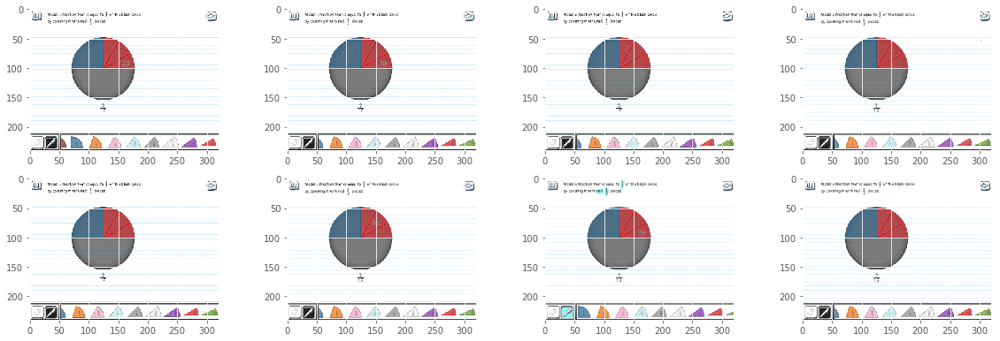

Cluster 2
                            _id behavioral_traits  bonus  correct  diff  \
4837   5a00fe819100de1a3935d5e4                []   True    False   0.5   
11834  5a0116519100de1a3994f5a3                []   True    False   0.5   
12850  5a01180f9100de1a399bebf8                []   True    False   0.5   
242    5a00f1eb9100de1a3901eda7                []   True    False   0.5   
6797   5a01042e9100de1a394cc3a3                []   True    False   0.5   
4612   5a00fdd29100de1a39331cdd                []   True    False   0.5   
6680   5a0103d19100de1a394b4b57                []   True    False   0.5   
13208  5a0118a29100de1a399e3e0f                []   True    False   0.5   
12961  5a01183d9100de1a399caa52                []   True    False   0.5   
6846   5a0104639100de1a394d95a8                []   True    False   0.5   

               id  incomplete          lesson  \
4837   OG_XxtbnEa       False  model_symbol_5   
11834  OG_XxtbnEa       False  model_symbol_5   
12850  OG_XxtbnEa

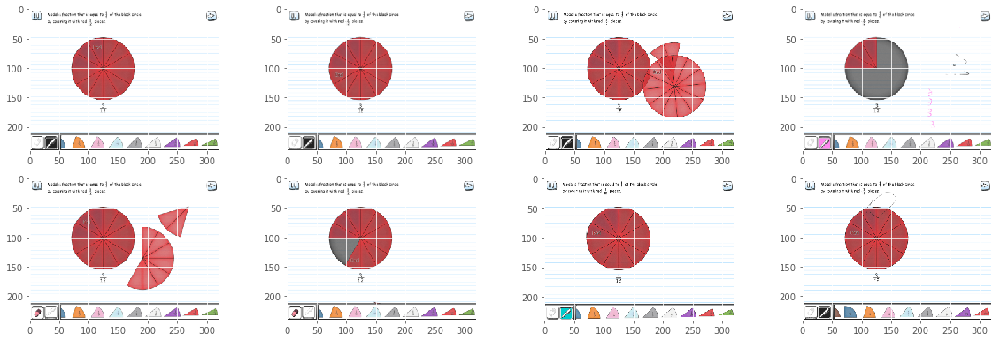

Cluster 3
                           _id behavioral_traits  bonus  correct  diff  \
7491  5a0106599100de1a39556e90                []   True    False   0.5   
7156  5a01054e9100de1a395146e0                []   True    False   0.5   
7110  5a0105249100de1a3950a1a7                []   True    False   0.5   
6918  5a0104909100de1a394e50c1                []   True    False   0.5   
6908  5a0104839100de1a394e195e                []   True    False   0.5   
6824  5a01044a9100de1a394d2fde                []   True    False   0.5   
6779  5a01041a9100de1a394c7463                []   True    False   0.5   
6778  5a0104199100de1a394c6fbf                []   True    False   0.5   
6745  5a0104009100de1a394c0b80                []   True    False   0.5   
6736  5a0103f59100de1a394bde38                []   True    False   0.5   

              id  incomplete          lesson  \
7491  OG_XxtbnEa       False  model_symbol_5   
7156  OG_XxtbnEa       False  model_symbol_5   
7110  OG_XxtbnEa       False  m

Cluster 5
                           _id behavioral_traits  bonus  correct  diff  \
2     5a00f17c9100de1a39002942                []   True    False   0.5   
4932  5a00febd9100de1a3936cb7f                []   True    False   0.5   
9720  5a010fae9100de1a397a757a                []   True    False   0.5   
4880  5a00fe939100de1a39361f15                []   True    False   0.5   
4872  5a00fe939100de1a39361cfa                []   True    False   0.5   
9764  5a0110129100de1a397c0992                []   True    False   0.5   
4859  5a00fe8e9100de1a39360a17                []   True    False   0.5   
9787  5a01102a9100de1a397c6903                []   True    False   0.5   
4827  5a00fe7d9100de1a3935c49f                []   True    False   0.5   
9804  5a0110489100de1a397ce234                []   True    False   0.5   

              id  incomplete          lesson  \
2     OG_XxtbnEa       False  model_symbol_5   
4932  OG_XxtbnEa       False  model_symbol_5   
9720  OG_XxtbnEa       False  m

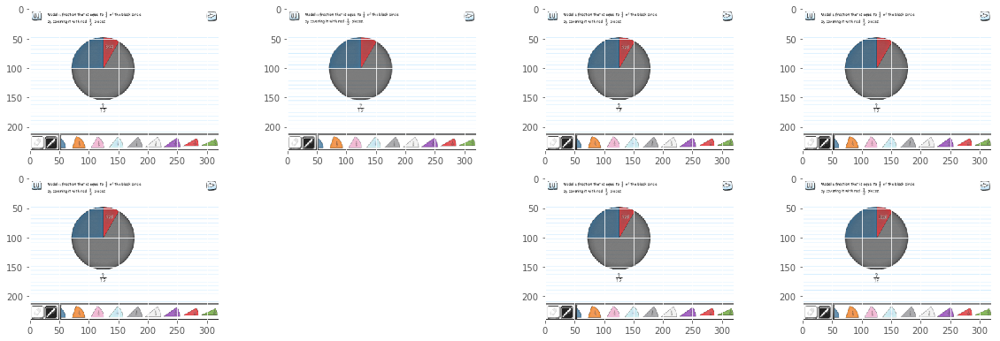

Analysis 1 for qual_id YN4n4X5GRF.bonus.Q5XY-9tBFu with 19100 samples
Session 0 txt  Model a fraction that is equal to 1/2 using the one twelfth red pieces.
Answer: [object Object]
Extracting tf-idf features ...
done in 0.877s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.050s
qual_id YN4n4X5GRF.bonus.Q5XY-9tBFu has these clusters
2    762
5    757
0    638
8    616
6    605
1    549
7    482
3    294
9    243
4    121
Name: cluster, dtype: int64
Distances (5067, 10) [[ 1.13646618  0.25040561  1.25591618 ...,  1.27657788  1.27898391
   1.21743526]
 [ 1.17044961  0.43928794  1.30251645 ...,  1.28748653  1.32208009
   1.28535183]
 [ 0.75175613  1.24041659  0.1784854  ...,  0.90929442  0.49501807
   0.89325655]
 ..., 
 [ 0.74489302  1.21575778  0.49624709 ...,  0.93638886  0.

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
2     5a00f17c9100de1a39002c40                []   True    False     1   
1801  5a00fd909100de1a3932152f                []   True    False     1   
1800  5a00fd8e9100de1a39320c41                []   True    False     1   
1787  5a00fd7e9100de1a3931cf40                []   True    False     1   
1784  5a00fd7e9100de1a3931ce69                []   True    False     1   
1771  5a00fd559100de1a393123c7                []   True    False     1   
1761  5a00fd3b9100de1a3930bb55                []   True    False     1   
1760  5a00fd379100de1a3930aa3d                []   True    False     1   
1759  5a00fd349100de1a39309e66                []   True    False     1   
1755  5a00fd2e9100de1a39308708                []   True    False     1   

              id  incomplete             lesson  \
2     Q5XY-9tBFu       False  model_symbol_3_v3   
1801  Q5XY-9tBFu       False  model_symbol_3_v3   
1800  Q5XY-9tBFu       False  mo

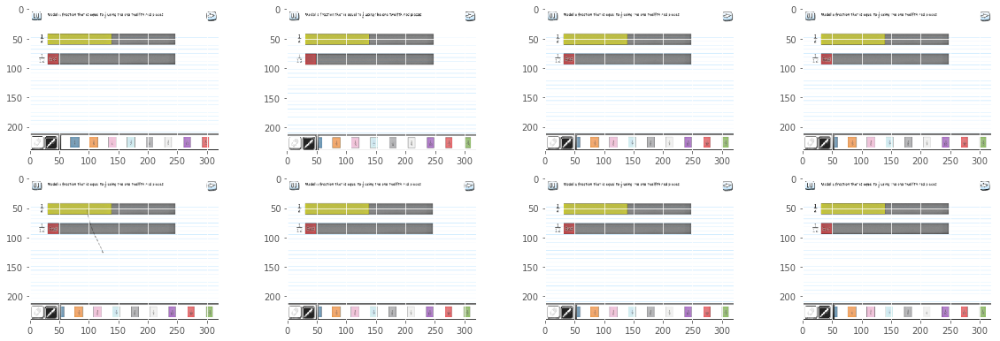

Cluster 5
                           _id behavioral_traits  bonus  correct  diff  \
769   5a00f6119100de1a39130560                []   True    False     1   
2336  5a0101bd9100de1a3942dd4a                []   True    False     1   
703   5a00f5a39100de1a391116e8                []   True    False     1   
2337  5a0101c39100de1a3942f7df                []   True    False     1   
2409  5a0102489100de1a3945173d                []   True    False     1   
3609  5a0110609100de1a397d4431                []   True    False     1   
729   5a00f5d89100de1a391208b9                []   True    False     1   
3599  5a0110399100de1a397ca75e                []   True    False     1   
3592  5a01101b9100de1a397c30d6                []   True    False     1   
1663  5a00fc849100de1a392dce40                []   True    False     1   

              id  incomplete             lesson  \
769   Q5XY-9tBFu       False  model_symbol_3_v3   
2336  Q5XY-9tBFu       False  model_symbol_3_v3   
703   Q5XY-9tBFu      

Cluster 0
                           _id behavioral_traits  bonus  correct  diff  \
4942  5a0119639100de1a39a14e54                []   True    False     1   
69    5a00f1de9100de1a3901b6fd                []   True    False     1   
2647  5a01040b9100de1a394c3749                []   True    False     1   
797   5a00f62f9100de1a3913883d                []   True    False     1   
3842  5a0113909100de1a3989efd2                []   True    False     1   
3059  5a0108fe9100de1a395fe7fe                []   True    False     1   
4804  5a0118909100de1a399df5b8                []   True    False     1   
2654  5a01041a9100de1a394c73f4                []   True    False     1   
3311  5a010bf39100de1a396ba383                []   True    False     1   
989   5a00f7639100de1a3918e6a6                []   True    False     1   

              id  incomplete             lesson  \
4942  Q5XY-9tBFu       False  model_symbol_3_v3   
69    Q5XY-9tBFu       False  model_symbol_3_v3   
2647  Q5XY-9tBFu      

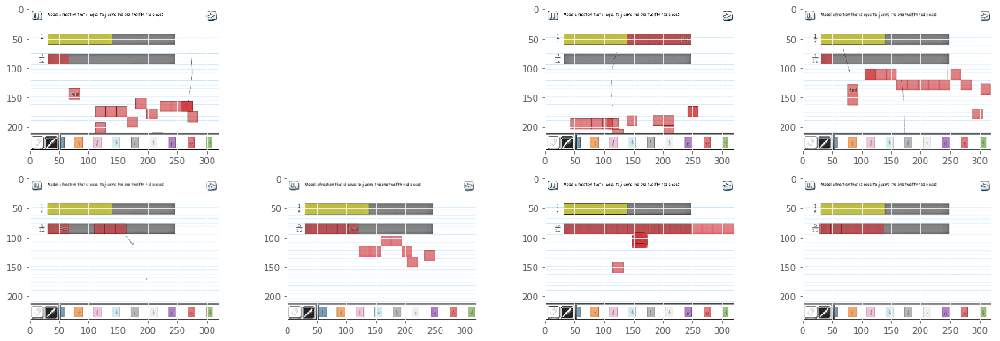

Cluster 8
                           _id behavioral_traits  bonus  correct  diff  \
2355  5a0101e59100de1a39437f67                []   True    False     1   
4149  5a0115769100de1a3991885f                []   True    False     1   
4144  5a0115779100de1a39918e56                []   True    False     1   
4141  5a01156b9100de1a39915e6f                []   True    False     1   
4110  5a01154f9100de1a3990ebd1                []   True    False     1   
4109  5a01154f9100de1a3990ebb5                []   True    False     1   
4101  5a0115449100de1a3990c098                []   True    False     1   
4094  5a0115449100de1a3990be51                []   True    False     1   
4090  5a01153f9100de1a3990ab35                []   True    False     1   
4089  5a01153e9100de1a3990a735                []   True    False     1   

              id  incomplete             lesson  \
2355  Q5XY-9tBFu       False  model_symbol_3_v3   
4149  Q5XY-9tBFu       False  model_symbol_3_v3   
4144  Q5XY-9tBFu      

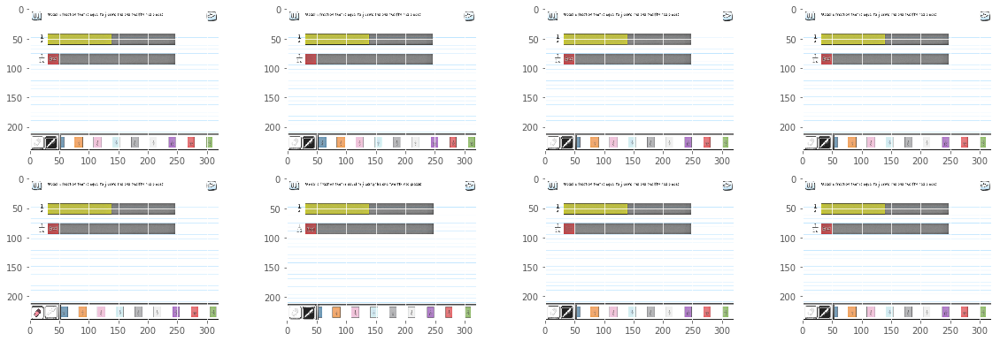

Analysis 2 for qual_id 9wRCzK1G7F.partb.12d_Yq8M01 with 18911 samples
Session 0 txt  The brown is the whole unit. Which of these pieces is one third of the brown piece?
Drag the piece to the answer box.
Answer: 1/9
Extracting tf-idf features ...
done in 0.404s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.060s
qual_id 9wRCzK1G7F.partb.12d_Yq8M01 has these clusters
4    1181
3     803
5     666
2     499
1     466
6     274
0     246
9     209
8     206
7     114
Name: cluster, dtype: int64
Distances (4664, 10) [[ 1.30723488  0.77823021  1.35767572 ...,  1.30392646  0.69118066
   1.17940628]
 [ 1.23474716  1.31291546  1.30172633 ...,  1.24068315  1.12096494
   1.15307852]
 [ 0.8660074   0.88823501  0.93744904 ...,  0.85982016  0.6081635
   0.68680117]
 ..., 
 [ 1.26811627  

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


http://woot_math_cub.s3.amazonaws.com/ss/104537/12d_Yq8M01.1490796398920.png
http://woot_math_cub.s3.amazonaws.com/ss/104546/12d_Yq8M01.1490798556305.png
http://woot_math_cub.s3.amazonaws.com/ss/115381/12d_Yq8M01.1490799967891.png
http://woot_math_cub.s3.amazonaws.com/ss/30304/12d_Yq8M01.1490799153539.png
http://woot_math_cub.s3.amazonaws.com/ss/115986/12d_Yq8M01.1490806407809.png
http://woot_math_cub.s3.amazonaws.com/ss/94904/12d_Yq8M01.1490804804275.png
http://woot_math_cub.s3.amazonaws.com/ss/99289/12d_Yq8M01.1490817321733.png


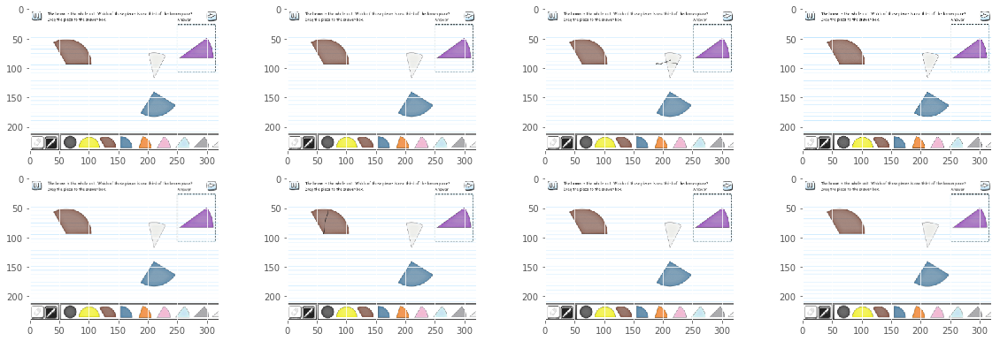

Cluster 3
                           _id behavioral_traits  bonus  correct      diff  \
6     5a00f17a9100de1a39002260                []  False    False  0.533908   
2655  5a0108a89100de1a395e9323                []  False    False  0.533908   
2628  5a01083c9100de1a395ce512                []  False    False  0.533908   
2626  5a01083a9100de1a395cdc12                []  False    False  0.533908   
2607  5a0107dc9100de1a395b65fd                []  False    False  0.533908   
2596  5a0107cc9100de1a395b26fe                []  False    False  0.533908   
2582  5a01079c9100de1a395a68e1                []  False    False  0.533908   
2580  5a01079b9100de1a395a6412                []  False    False  0.533908   
2573  5a0107829100de1a395a0515                []  False    False  0.533908   
2567  5a0107799100de1a3959e16e                []  False    False  0.533908   

              id  incomplete           lesson  \
6     12d_Yq8M01       False  review_lesson_1   
2655  12d_Yq8M01       False  nam

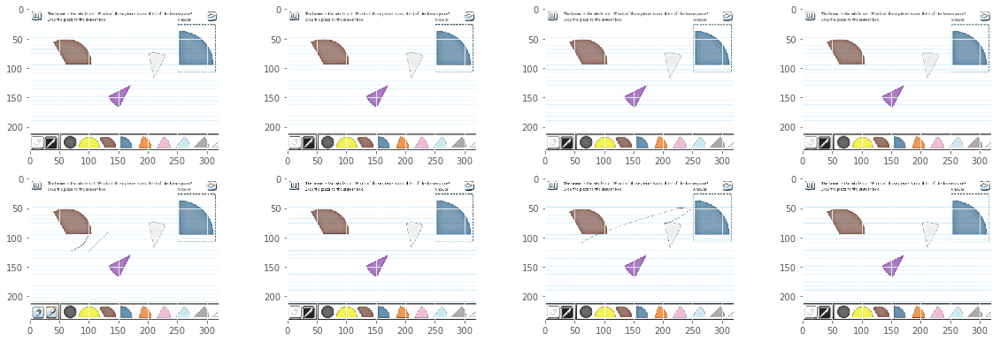

Cluster 5
                           _id behavioral_traits  bonus  correct      diff  \
4660  59d27006d0cd262c1b00c2b0               NaN  False    False  0.533908   
1691  5a00ff4e9100de1a3939144c                []  False    False  0.533908   
1703  5a00ff709100de1a3939a002                []  False    False  0.533908   
1833  5a0100869100de1a393df1cf                []  False    False  0.533908   
1861  5a0100c79100de1a393ef389                []  False    False  0.533908   
1875  5a0100e09100de1a393f578f                []  False    False  0.533908   
1914  5a01013b9100de1a3940ce5c                []  False    False  0.533908   
1920  5a0101519100de1a394127d2                []  False    False  0.533908   
1939  5a0101899100de1a39420b3b                []  False    False  0.533908   
1948  5a0101949100de1a39423718                []  False    False  0.533908   

              id  incomplete           lesson  \
4660  12d_Yq8M01       False  name_fract_1_v2   
1691  12d_Yq8M01       False  rev

Cluster 2
                           _id behavioral_traits  bonus  correct      diff  \
4639  59d26ff9d0cd262c1b0088d2               NaN  False    False  0.533908   
3281  5a010fe19100de1a397b4279                []  False    False  0.533908   
1721  5a00ffa39100de1a393a6cb8                []  False    False  0.533908   
1718  5a00ff9e9100de1a393a5646                []  False    False  0.533908   
3285  5a010ff89100de1a397ba28b                []  False    False  0.533908   
1687  5a00ff479100de1a3938f795                []  False    False  0.533908   
3292  5a01100c9100de1a397bf2a0                []  False    False  0.533908   
3296  5a0110239100de1a397c4e04                []  False    False  0.533908   
1653  5a00feec9100de1a39378b3d                []  False    False  0.533908   
3304  5a0110919100de1a397e07a8                []  False    False  0.533908   

              id  incomplete           lesson  \
4639  12d_Yq8M01       False  name_fract_1_v2   
3281  12d_Yq8M01       False  nam

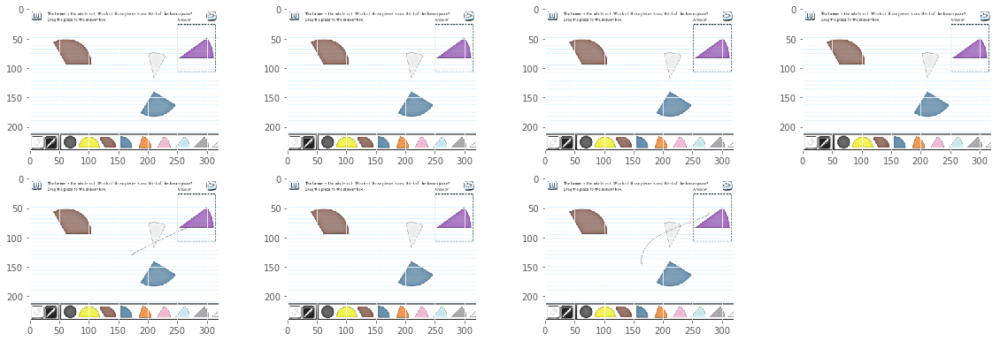

Analysis 3 for qual_id TJxldqZMXd.partb.gqJqOrIhu_ with 18390 samples
Session 0 txt  Drag one sixth pieces to cover all of the  2/3  shown.
Answer: 4
Extracting tf-idf features ...
done in 0.289s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.077s
qual_id TJxldqZMXd.partb.gqJqOrIhu_ has these clusters
3    525
9    363
1    349
7    307
8    255
2    243
4    224
6    196
5    122
0     92
Name: cluster, dtype: int64
Distances (2676, 10) [[ 0.92192859  0.91268775  0.95788151 ...,  0.75531589  0.81683753
   0.78670656]
 [ 0.92764071  0.95683228  0.95079065 ...,  0.95352634  0.99241893
   0.89599241]
 [ 0.89853453  0.88002845  0.95167276 ...,  0.74352556  0.79979602
   0.7722794 ]
 ..., 
 [ 0.8638884   0.32373556  0.95080286 ...,  0.70170333  0.45630193
   0.55432795]
 [ 0.84

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct      diff  \
2     5a00f1769100de1a39000f52                []  False    False  0.272173   
1519  5a0105309100de1a3950cffe                []  False    False  0.272173   
1514  5a0105109100de1a39505191                []  False    False  0.272173   
1510  5a0104ea9100de1a394fba8c                []  False    False  0.272173   
1509  5a0104ea9100de1a394fba8b                []  False    False  0.272173   
1500  5a0104d89100de1a394f70b9                []  False    False  0.272173   
1484  5a01049c9100de1a394e80b4                []  False    False  0.272173   
1483  5a01049c9100de1a394e80b3                []  False    False  0.272173   
1479  5a0104979100de1a394e6a5a                []  False    False  0.272173   
1474  5a0104899100de1a394e3322                []  False    False  0.272173   

              id  incomplete          lesson  \
2     gqJqOrIhu_       False  model_symbol_6   
1519  gqJqOrIhu_       False  model_symbol_6 

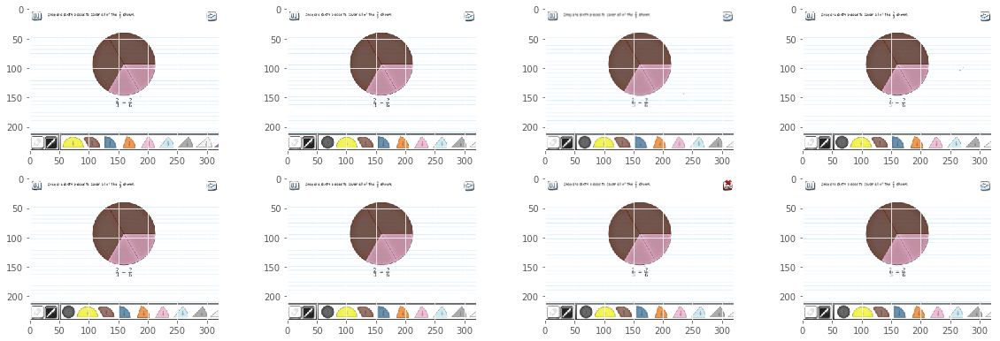

Cluster 9
                           _id behavioral_traits  bonus  correct      diff  \
2080  5a010e139100de1a397414fd                []  False    False  0.272173   
2079  5a010e139100de1a397414fc                []  False    False  0.272173   
521   5a00f7b49100de1a391a5f34                []  False    False  0.272173   
87    5a00f2879100de1a390461ae                []  False    False  0.272173   
668   5a00f9dc9100de1a39232b9e                []  False    False  0.272173   
2230  5a0111b59100de1a39829997                []  False    False  0.272173   
2661  5a0119cc9100de1a39a2ebc9                []  False    False  0.272173   
2296  5a0114319100de1a398c7392                []  False    False  0.272173   
2404  5a0115819100de1a3991b3a7                []  False    False  0.272173   
393   5a00f6469100de1a3913e9e8                []  False    False  0.272173   

              id  incomplete           lesson  \
2080  gqJqOrIhu_       False   model_symbol_6   
2079  gqJqOrIhu_       False   mo

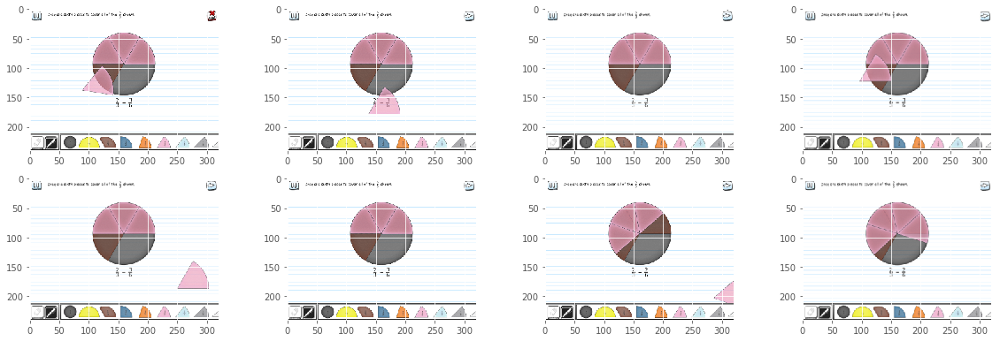

Cluster 1
                           _id behavioral_traits  bonus  correct      diff  \
10    5a00f17d9100de1a39002e91                []  False    False  0.272173   
1259  5a0102439100de1a39450099                []  False    False  0.272173   
1314  5a0102d39100de1a39474b80                []  False    False  0.272173   
1317  5a0102ec9100de1a3947b2f5                []  False    False  0.272173   
1334  5a0103079100de1a39481f35                []  False    False  0.272173   
1354  5a0103479100de1a39491cec                []  False    False  0.272173   
1355  5a0103479100de1a39491ced                []  False    False  0.272173   
1364  5a0103529100de1a39494640                []  False    False  0.272173   
1379  5a0103669100de1a39499528                []  False    False  0.272173   
1451  5a0104499100de1a394d2e16                []  False    False  0.272173   

              id  incomplete          lesson  \
10    gqJqOrIhu_       False  model_symbol_6   
1259  gqJqOrIhu_       False  model

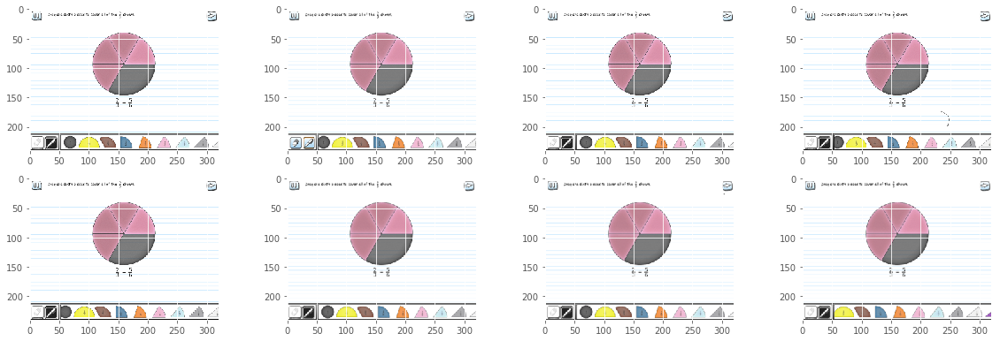

Cluster 7
                           _id behavioral_traits  bonus  correct      diff  \
1287  5a01027f9100de1a3945f4da                []  False    False  0.272173   
892   5a00fd6f9100de1a39318eee                []  False    False  0.272173   
926   5a00fdf29100de1a39339a71                []  False    False  0.272173   
2102  5a010e809100de1a3975c88e                []  False    False  0.272173   
974   5a00fe909100de1a3936129b                []  False    False  0.272173   
980   5a00fe929100de1a393618fb                []  False    False  0.272173   
2087  5a010e3c9100de1a3974be6a                []  False    False  0.272173   
997   5a00febd9100de1a3936c8bd                []  False    False  0.272173   
1002  5a00fecf9100de1a3937138c                []  False    False  0.272173   
1013  5a00fefa9100de1a3937c4ad                []  False    False  0.272173   

              id  incomplete           lesson  \
1287  gqJqOrIhu_       False   model_symbol_6   
892   gqJqOrIhu_       False   mo

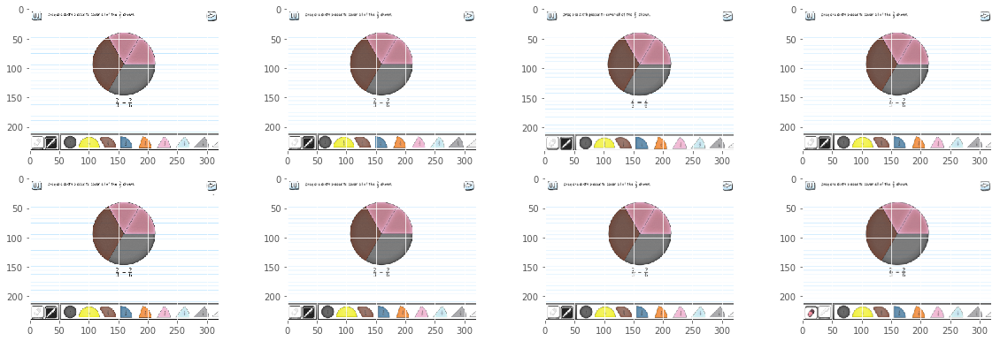

Analysis 4 for qual_id TJxldqZMXd.partb.9L_iTwGd5z with 18197 samples
Session 0 txt  Drag one eighth pieces to cover all of the  3/4  shown.
Answer: 6
Extracting tf-idf features ...
done in 0.282s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.095s
qual_id TJxldqZMXd.partb.9L_iTwGd5z has these clusters
1    1014
6     297
4     216
2     193
5     174
0     155
3     139
8     114
7      73
9      48
Name: cluster, dtype: int64
Distances (2423, 10) [[ 0.80776733  0.92224432  0.55528124 ...,  0.95533084  0.78080682
   1.084683  ]
 [ 0.95869921  1.13532524  0.34399241 ...,  0.94903698  0.83691381
   1.05370349]
 [ 0.77533308  0.93643951  0.52225189 ...,  0.91599643  0.76227366
   1.04481933]
 ..., 
 [ 0.8069466   0.92130254  0.7660125  ...,  0.92877336  0.77977295
   1.046245

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct      diff  \
658   5a00fad89100de1a39272a12                []  False    False  0.886537   
2394  5a01197b9100de1a39a1aa95                []  False    False  0.886537   
1048  5a0100219100de1a393c608d                []  False    False  0.886537   
2388  5a0119639100de1a39a14f88                []  False    False  0.886537   
1328  5a01044e9100de1a394d3e37                []  False    False  0.886537   
42    5a00f1e79100de1a3901dec9                []  False    False  0.886537   
355   5a00f61a9100de1a39132e03                []  False    False  0.886537   
361   5a00f62a9100de1a39137455                []  False    False  0.886537   
362   5a00f6489100de1a3913f26d                []  False    False  0.886537   
369   5a00f65e9100de1a39144a72                []  False    False  0.886537   

              id  incomplete           lesson  \
658   9L_iTwGd5z       False  review_lesson_2   
2394  9L_iTwGd5z       False   model_symbol

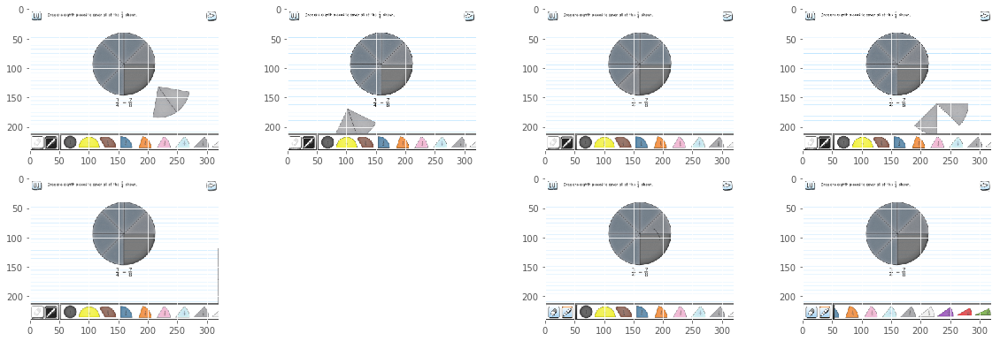

Cluster 6
                           _id behavioral_traits  bonus  correct      diff  \
1637  5a0109c49100de1a3962f0da                []  False    False  0.886537   
1463  5a0106a59100de1a39569f93                []  False    False  0.886537   
1733  5a010b5b9100de1a39694833                []  False    False  0.886537   
429   5a00f7409100de1a391856b5                []  False    False  0.886537   
2224  5a0116169100de1a39940754                []  False    False  0.886537   
1443  5a0106449100de1a39551884                []  False    False  0.886537   
1241  5a01034e9100de1a3949365d                []  False    False  0.886537   
720   5a00fbca9100de1a392af639                []  False    False  0.886537   
2194  5a01155b9100de1a39911ca1                []  False    False  0.886537   
1545  5a0108239100de1a395c7d17                []  False    False  0.886537   

              id  incomplete           lesson  \
1637  9L_iTwGd5z       False   model_symbol_6   
1463  9L_iTwGd5z       False   mo

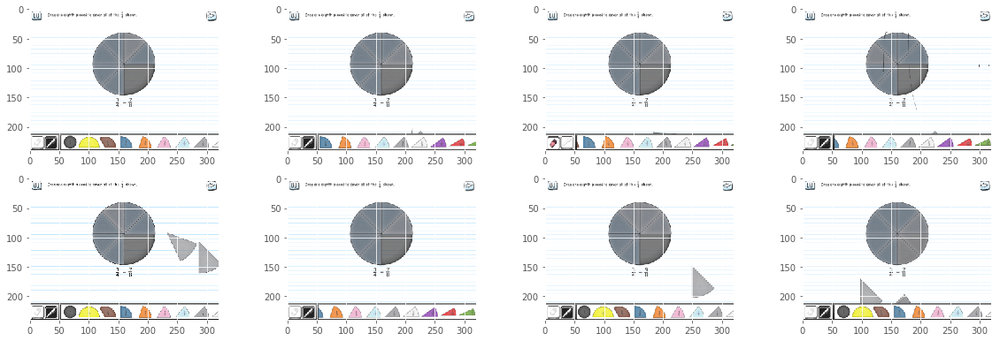

Cluster 4
                           _id behavioral_traits  bonus  correct      diff  \
25    5a00f1c59100de1a390156c0                []  False    False  0.886537   
1521  5a0107b49100de1a395ac80c                []  False    False  0.886537   
1539  5a0108129100de1a395c3851                []  False    False  0.886537   
1541  5a01081c9100de1a395c6146                []  False    False  0.886537   
1550  5a0108399100de1a395cd79f                []  False    False  0.886537   
1557  5a0108609100de1a395d743d                []  False    False  0.886537   
1564  5a0108729100de1a395dba13                []  False    False  0.886537   
1585  5a0108bb9100de1a395edb57                []  False    False  0.886537   
1603  5a0108ee9100de1a395fa71b                []  False    False  0.886537   
1611  5a01093a9100de1a3960d2b8                []  False    False  0.886537   

              id  incomplete          lesson  \
25    9L_iTwGd5z       False  model_symbol_6   
1521  9L_iTwGd5z       False  model

Cluster 2
                           _id behavioral_traits  bonus  correct      diff  \
1321  5a01041b9100de1a394c75b8                []  False    False  0.886537   
473   5a00f8029100de1a391bb1e4                []  False    False  0.886537   
1504  5a01076d9100de1a3959b40f                []  False    False  0.886537   
1150  5a0101fc9100de1a3943df19                []  False    False  0.886537   
1149  5a0101fc9100de1a3943df18                []  False    False  0.886537   
1072  5a01009b9100de1a393e44b7                []  False    False  0.886537   
1038  5a01000e9100de1a393c1576                []  False    False  0.886537   
934   5a00feb49100de1a3936a289                []  False    False  0.886537   
875   5a00fe0b9100de1a3933fee0                []  False    False  0.886537   
1     5a00f17b9100de1a39002562                []  False    False  0.886537   

              id  incomplete           lesson  \
1321  9L_iTwGd5z       False   model_symbol_6   
473   9L_iTwGd5z       False  rev

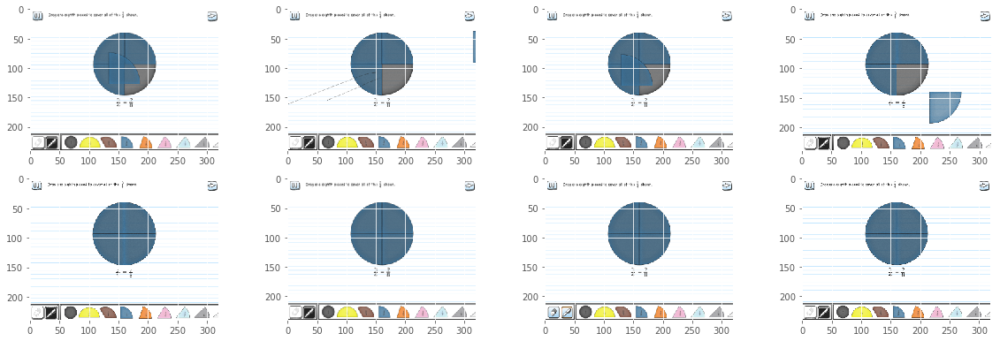

Analysis 5 for qual_id TJxldqZMXd.partb.W2tLvQTbkI with 17800 samples
Session 0 txt  Drag one half pieces to cover all of the  2/4  shown.
Answer: 1
Extracting tf-idf features ...
done in 0.240s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.064s
qual_id TJxldqZMXd.partb.W2tLvQTbkI has these clusters
4    715
3    309
1    272
6    240
2    206
8    168
0    141
5    138
9     56
7     47
Name: cluster, dtype: int64
Distances (2292, 10) [[ 0.91803803  0.93902528  0.78164773 ...,  0.9084771   0.75488925
   0.53330682]
 [ 0.87806605  0.88196565  1.09588997 ...,  1.020032    0.63109736
   0.96321812]
 [ 0.88199993  0.93619108  1.06884288 ...,  1.04471044  0.48576356
   0.84288138]
 ..., 
 [ 0.91141167  0.92899776  0.25484199 ...,  0.89806207  0.98136802
   0.8066961 ]
 [ 1.241

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
8     5a00f17f9100de1a39003552                []  False    False     0   
1428  5a01077e9100de1a3959f4e3                []  False    False     0   
1429  5a01077e9100de1a3959f4e4                []  False    False     0   
1432  5a01079d9100de1a395a6e2d                []  False    False     0   
1433  5a01079f9100de1a395a758c                []  False    False     0   
1434  5a01079e9100de1a395a71dc                []  False    False     0   
1441  5a0107bb9100de1a395ae442                []  False    False     0   
1445  5a0107c89100de1a395b15a5                []  False    False     0   
1460  5a0108249100de1a395c8091                []  False    False     0   
1461  5a0108239100de1a395c7d15                []  False    False     0   

              id  incomplete          lesson  \
8     W2tLvQTbkI       False  model_symbol_6   
1428  W2tLvQTbkI       False  model_symbol_6   
1429  W2tLvQTbkI       False  model_symbo

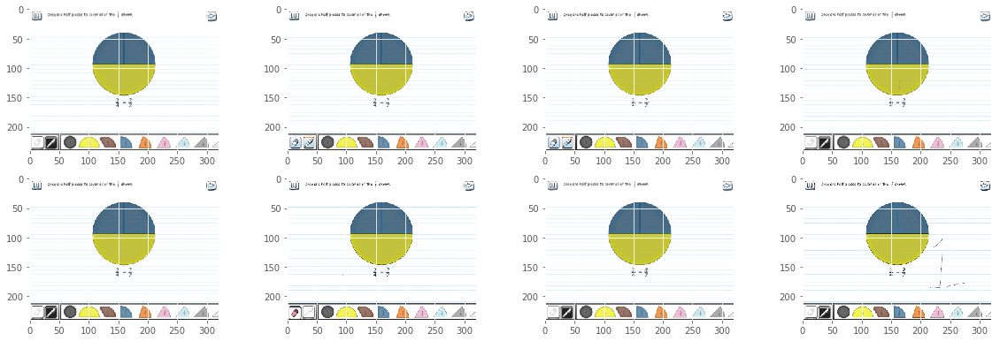

Cluster 3
                           _id behavioral_traits  bonus  correct  diff  \
0     5a00f1769100de1a39000f4f                []  False    False     0   
1177  5a0103219100de1a394887b0                []  False    False     0   
1191  5a0103499100de1a3949232b                []  False    False     0   
1205  5a01036a9100de1a3949a5ff                []  False    False     0   
1210  5a0103709100de1a3949bc7e                []  False    False     0   
1212  5a0103709100de1a3949bfea                []  False    False     0   
1218  5a0103789100de1a3949dfdd                []  False    False     0   
1227  5a01039c9100de1a394a72a4                []  False    False     0   
1247  5a0103de9100de1a394b7dc3                []  False    False     0   
1254  5a0103f09100de1a394bc838                []  False    False     0   

              id  incomplete          lesson  \
0     W2tLvQTbkI       False  model_symbol_6   
1177  W2tLvQTbkI       False  model_symbol_6   
1191  W2tLvQTbkI       False  m

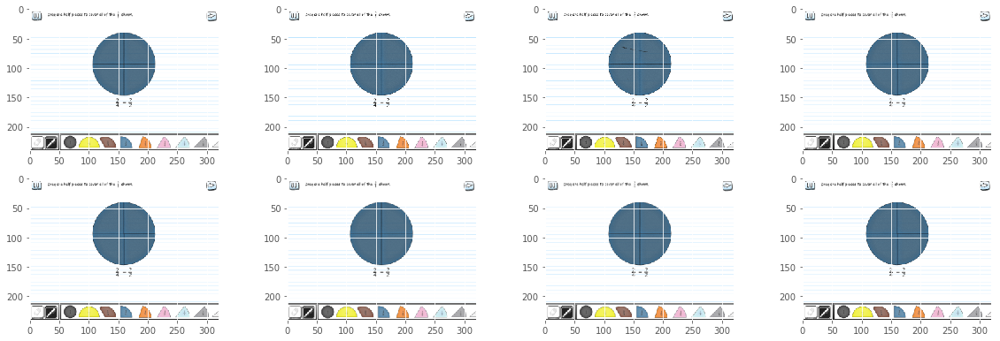

Cluster 1
                           _id behavioral_traits  bonus  correct  diff  \
1253  5a0103ec9100de1a394bb951                []  False    False     0   
1114  5a0102259100de1a394486fd                []  False    False     0   
1122  5a0102539100de1a39454279                []  False    False     0   
1123  5a0102559100de1a39454a7f                []  False    False     0   
1145  5a01029c9100de1a39466d3e                []  False    False     0   
1178  5a0103229100de1a39488940                []  False    False     0   
1864  5a0110e69100de1a397f5bf8                []  False    False     0   
1201  5a01035e9100de1a394975a1                []  False    False     0   
1203  5a0103649100de1a39498de3                []  False    False     0   
1219  5a01037c9100de1a3949f271                []  False    False     0   

              id  incomplete           lesson  \
1253  W2tLvQTbkI       False   model_symbol_6   
1114  W2tLvQTbkI       False   model_symbol_6   
1122  W2tLvQTbkI       False

Cluster 6
                           _id behavioral_traits  bonus  correct  diff  \
1640  5a010bba9100de1a396ac2f3                []  False    False     0   
1363  5a0105ba9100de1a3952f34d                []  False    False     0   
1561  5a010a0f9100de1a396421a9                []  False    False     0   
1575  5a010a729100de1a3965b51b                []  False    False     0   
494   5a00f8849100de1a391dbf3a                []  False    False     0   
1637  5a010bac9100de1a396a87cd                []  False    False     0   
1003  5a0100099100de1a393c031b                []  False    False     0   
246   5a00f4729100de1a390c1ff1                []  False    False     0   
379   5a00f6bc9100de1a3915f242                []  False    False     0   
1701  5a010c829100de1a396ddb6c                []  False    False     0   

              id  incomplete           lesson  \
1640  W2tLvQTbkI       False   model_symbol_6   
1363  W2tLvQTbkI       False   model_symbol_6   
1561  W2tLvQTbkI       False

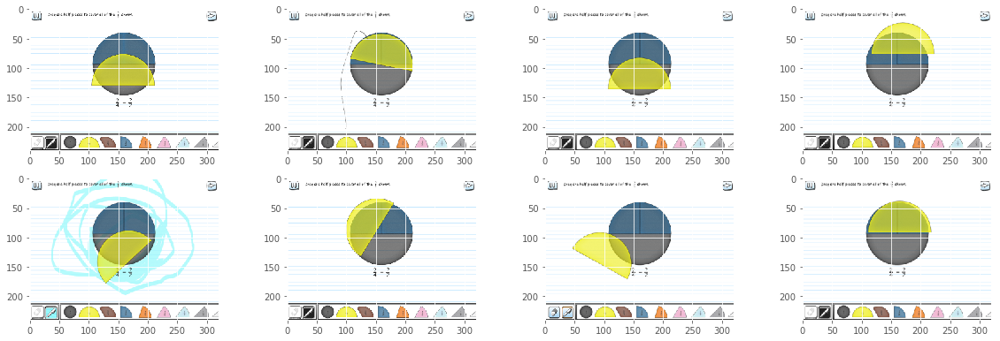

Analysis 6 for qual_id 9wRCzK1G7F.partb.SHkv5F_Yzi with 17466 samples
Session 0 txt  The orange is the whole unit. Which of these pieces is one half of the orange piece?
Drag the piece to the answer box.
Answer: 1/10
Extracting tf-idf features ...
done in 0.592s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.052s
qual_id 9wRCzK1G7F.partb.SHkv5F_Yzi has these clusters
0    1860
2    1041
6     558
3     553
7     472
1     420
5     227
9     195
4     174
8     102
Name: cluster, dtype: int64
Distances (5602, 10) [[ 1.1816681   1.20086275  0.94226662 ...,  1.13062715  1.20376853
   1.20210314]
 [ 1.35971648  1.33696511  0.96493551 ...,  1.34158149  0.78418357
   1.32077131]
 [ 0.7228359   0.76124895  0.83117138 ...,  0.70722006  1.18568966
   0.82709437]
 ..., 
 [ 0.0233202

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct      diff  \
6     5a00f1799100de1a39001ad0                []  False    False  0.620549   
3943  5a0110ef9100de1a397f7da2                []  False    False  0.620549   
3934  5a0110e49100de1a397f50a0                []  False    False  0.620549   
3927  5a0110d49100de1a397f12e4                []  False    False  0.620549   
3923  5a0110cb9100de1a397eedc1                []  False    False  0.620549   
3922  5a0110ca9100de1a397ee974                []  False    False  0.620549   
3920  5a0110c29100de1a397ec829                []  False    False  0.620549   
3916  5a0110c19100de1a397ec509                []  False    False  0.620549   
3915  5a0110c19100de1a397ec4b8                []  False    False  0.620549   
3912  5a0110b89100de1a397ea093                []  False    False  0.620549   

              id  incomplete           lesson  \
6     SHkv5F_Yzi       False  name_fract_1_v2   
3943  SHkv5F_Yzi       False  name_fract_1_

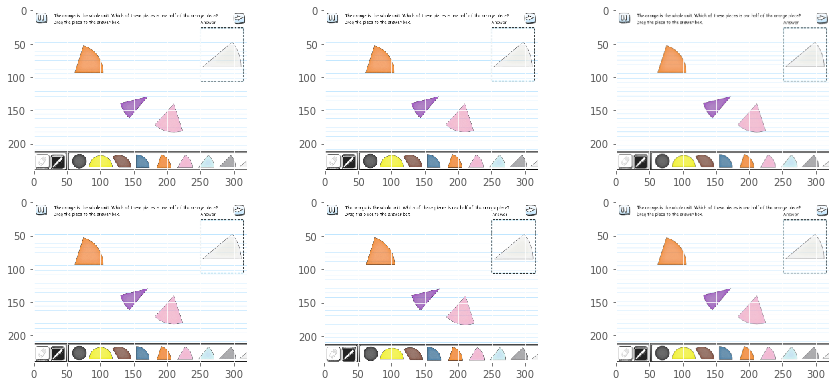

Cluster 2
                           _id behavioral_traits  bonus  correct      diff  \
2905  5a0106139100de1a395450c1                []  False    False  0.620549   
4984  5a0117429100de1a3998b911                []  False    False  0.620549   
1844  5a00fe1c9100de1a39344182                []  False    False  0.620549   
825   5a00f6859100de1a3914e958                []  False    False  0.620549   
3517  5a010bfb9100de1a396bc33e                []  False    False  0.620549   
3521  5a010c069100de1a396bf15d                []  False    False  0.620549   
3582  5a010c6b9100de1a396d805c                []  False    False  0.620549   
4980  5a0117439100de1a3998ba93                []  False    False  0.620549   
3619  5a010cc59100de1a396ee1a1                []  False    False  0.620549   
4988  5a0117479100de1a3998cb02                []  False    False  0.620549   

              id  incomplete           lesson  \
2905  SHkv5F_Yzi       False  review_lesson_1   
4984  SHkv5F_Yzi       False  nam

Cluster 6
                           _id behavioral_traits  bonus  correct      diff  \
3     5a00f1759100de1a39000a53                []  False    False  0.620549   
3346  5a010a609100de1a39656bab                []  False    False  0.620549   
3336  5a010a559100de1a39653f46                []  False    False  0.620549   
3329  5a010a349100de1a3964b891                []  False    False  0.620549   
3285  5a01099a9100de1a39624c78                []  False    False  0.620549   
3249  5a01096b9100de1a39619248                []  False    False  0.620549   
3246  5a0109629100de1a39617141                []  False    False  0.620549   
3238  5a0109529100de1a39612fef                []  False    False  0.620549   
3224  5a0109329100de1a3960b1bb                []  False    False  0.620549   
3221  5a01092d9100de1a39609d75                []  False    False  0.620549   

              id  incomplete           lesson  \
3     SHkv5F_Yzi       False  name_fract_1_v2   
3346  SHkv5F_Yzi       False  nam

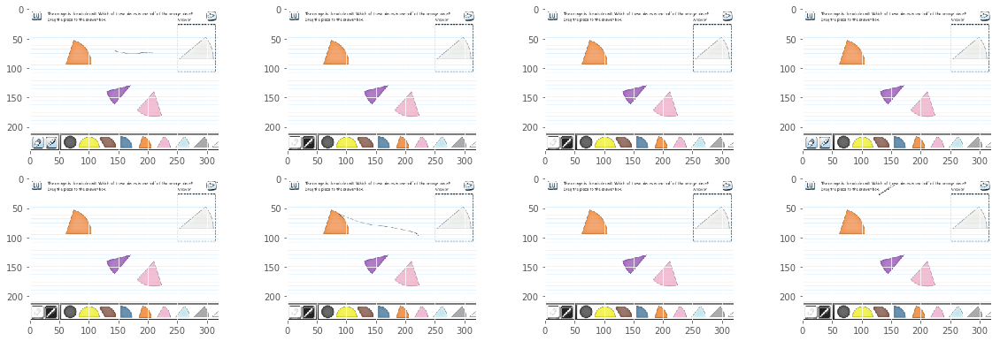

Cluster 3
                           _id behavioral_traits  bonus  correct      diff  \
1785  5a00fd929100de1a39321d89                []  False    False  0.620549   
958   5a00f7829100de1a39196fab                []  False    False  0.620549   
5     5a00f1789100de1a39001a84                []  False    False  0.620549   
3777  5a010e559100de1a39751e82                []  False    False  0.620549   
4318  5a01150d9100de1a398fe29b                []  False    False  0.620549   
3776  5a010e559100de1a39751e81                []  False    False  0.620549   
2263  5a0101309100de1a3940a393                []  False    False  0.620549   
2558  5a0103479100de1a39491d43                []  False    False  0.620549   
4972  5a01172f9100de1a39986a5d                []  False    False  0.620549   
4394  5a01152c9100de1a39905d9d                []  False    False  0.620549   

              id  incomplete           lesson  \
1785  SHkv5F_Yzi       False  name_fract_1_v2   
958   SHkv5F_Yzi       False  nam

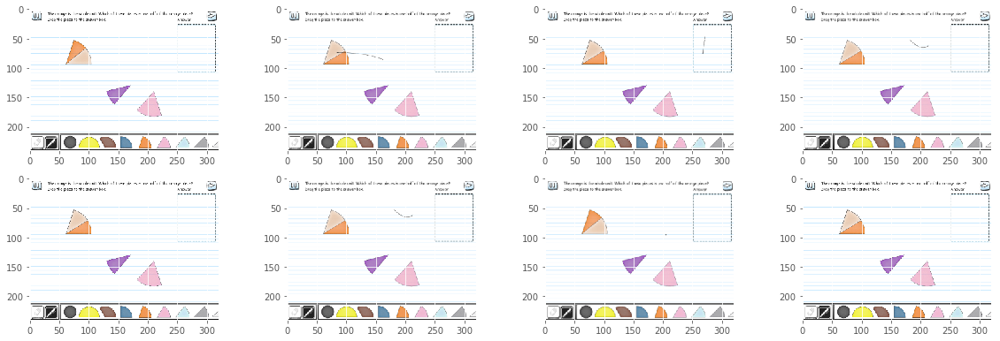

Analysis 7 for qual_id TJxldqZMXd.partb.hxS1eqLik1 with 17191 samples
Session 0 txt  Drag one half pieces to cover all of the  4/8  shown.
Answer: 1
Extracting tf-idf features ...
done in 0.148s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.060s
qual_id TJxldqZMXd.partb.hxS1eqLik1 has these clusters
3    265
4    244
5    152
2    135
1     86
6     72
7     42
8     30
0     19
9     13
Name: cluster, dtype: int64
Distances (1058, 10) [[ 1.08707247  0.49840186  0.65302107 ...,  0.8983707   0.87054592
   0.77348319]
 [ 1.08406509  0.50732095  0.69201439 ...,  0.89543241  0.8824415
   0.7566718 ]
 [ 1.13167274  0.59032761  0.62501684 ...,  0.94001342  0.87822044
   0.9134809 ]
 ..., 
 [ 1.14554288  0.7292056   0.74453252 ...,  0.81594538  0.83841108
   0.97001936]
 [ 0.9183

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                          _id behavioral_traits  bonus  correct  diff  \
527  5a0102a49100de1a39468ee1                []  False    False     1   
588  5a01043b9100de1a394cf566                []  False    False     1   
592  5a0104529100de1a394d5186                []  False    False     1   
595  5a0104759100de1a394de1cb                []  False    False     1   
597  5a0104869100de1a394e273d                []  False    False     1   
604  5a0104a09100de1a394e91bc                []  False    False     1   
607  5a0104b89100de1a394ef1fe                []  False    False     1   
609  5a0104b89100de1a394ef086                []  False    False     1   
610  5a0104ba9100de1a394efc2c                []  False    False     1   
612  5a0104e79100de1a394fac5c                []  False    False     1   

             id  incomplete           lesson  \
527  hxS1eqLik1       False   model_symbol_6   
588  hxS1eqLik1       False   model_symbol_6   
592  hxS1eqLik1       False  review_lesson_2   
595 

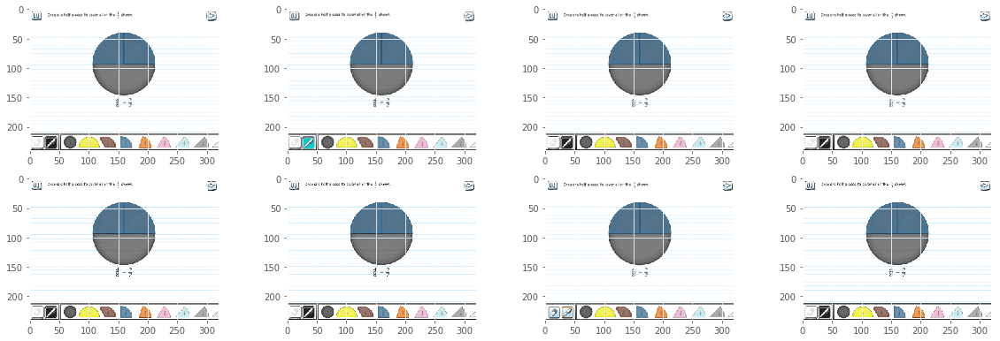

Cluster 4
                          _id behavioral_traits  bonus  correct  diff  \
12   5a00f1c59100de1a390156c1                []  False    False     1   
680  5a0107ff9100de1a395bef30                []  False    False     1   
681  5a0108129100de1a395c3852                []  False    False     1   
682  5a0108129100de1a395c387d                []  False    False     1   
686  5a0108279100de1a395c8da1                []  False    False     1   
687  5a0108399100de1a395cd7a0                []  False    False     1   
694  5a0108719100de1a395db998                []  False    False     1   
695  5a0108729100de1a395dba14                []  False    False     1   
698  5a0108bb9100de1a395edb58                []  False    False     1   
713  5a01093a9100de1a3960d2b9                []  False    False     1   

             id  incomplete          lesson  \
12   hxS1eqLik1       False  model_symbol_6   
680  hxS1eqLik1       False  model_symbol_6   
681  hxS1eqLik1       False  model_symbol_6  

Cluster 5
                          _id behavioral_traits  bonus  correct  diff  \
29   5a00f2499100de1a39036b37                []  False    False     1   
734  5a010abe9100de1a3966dff2                []  False    False     1   
729  5a010a4b9100de1a396515c6                []  False    False     1   
727  5a010a409100de1a3964e6a0                []  False    False     1   
725  5a010a379100de1a3964c53c                []  False    False     1   
719  5a0109de9100de1a39635cba                []  False    False     1   
715  5a01095f9100de1a39616372                []  False    False     1   
711  5a0109389100de1a3960c7cc                []  False    False     1   
710  5a0109219100de1a39606dab                []  False    False     1   
709  5a0109219100de1a39606daa                []  False    False     1   

             id  incomplete           lesson  \
29   hxS1eqLik1       False   model_symbol_6   
734  hxS1eqLik1       False   model_symbol_6   
729  hxS1eqLik1       False  review_lesson

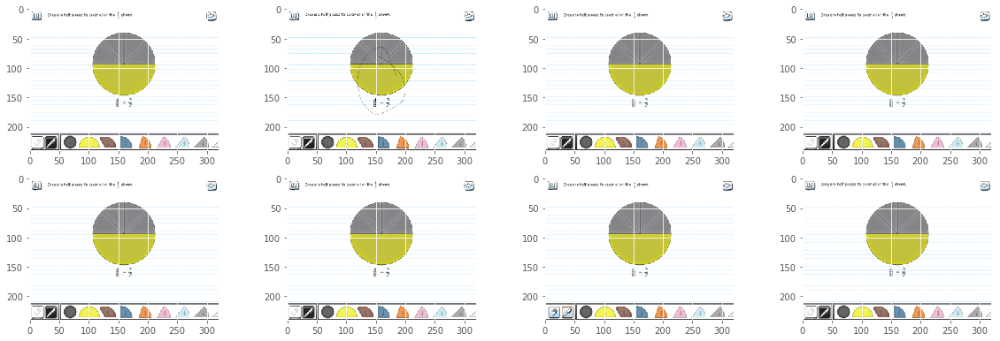

Cluster 2
                          _id behavioral_traits  bonus  correct  diff  \
633  5a0105b59100de1a3952df81                []  False    False     1   
544  5a0103249100de1a3948925e                []  False    False     1   
831  5a010f2a9100de1a3978697c                []  False    False     1   
210  5a00f7f19100de1a391b68b8                []  False    False     1   
584  5a0104149100de1a394c5a45                []  False    False     1   
714  5a0109619100de1a39616bc5                []  False    False     1   
379  5a00fdab9100de1a39328249                []  False    False     1   
644  5a0106809100de1a39560d32                []  False    False     1   
76   5a00f37a9100de1a39083796                []  False    False     1   
479  5a0100a69100de1a393e6f7d                []  False    False     1   

             id  incomplete           lesson  \
633  hxS1eqLik1       False   model_symbol_6   
544  hxS1eqLik1       False  review_lesson_2   
831  hxS1eqLik1       False   model_symbol

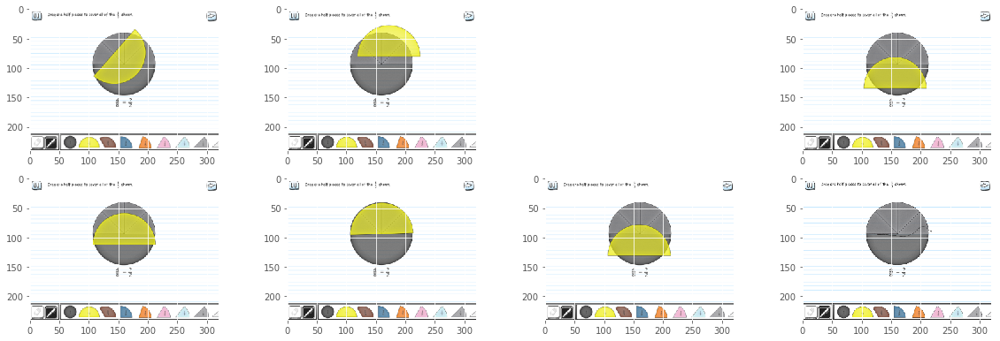

Analysis 8 for qual_id 9wRCzK1G7F.partb.qGGEQyiE_j with 17007 samples
Session 0 txt  The yellow is the whole unit. Which of these pieces is one half of the yellow piece?
Drag the piece to the answer box.
Answer: 1/4
Extracting tf-idf features ...
done in 0.486s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.092s
qual_id 9wRCzK1G7F.partb.qGGEQyiE_j has these clusters
3    1144
0     724
7     426
4     361
2     226
5     177
1     158
6     149
9     113
8      27
Name: cluster, dtype: int64
Distances (3505, 10) [[ 0.94588822  0.84845354  0.9790695  ...,  0.94522838  1.0252336
   0.98382505]
 [ 0.17702748  0.52223939  0.98575635 ...,  0.50213172  0.73219791
   0.75892092]
 [ 0.95704006  0.86060762  0.03339928 ...,  0.93184831  0.89704871
   0.8703041 ]
 ..., 
 [ 0.78332221 

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
2144  5a0109379100de1a3960c6f9                []  False    False     0   
2148  5a0109479100de1a39610340                []  False    False     0   
879   5a00fae89100de1a3927687b                []  False    False     0   
1783  5a0103dd9100de1a394b7b18                []  False    False     0   
862   5a00faaf9100de1a39268960                []  False    False     0   
1989  5a01066e9100de1a3955c50e                []  False    False     0   
1787  5a0103ea9100de1a394bb17f                []  False    False     0   
844   5a00fa4b9100de1a3924f41e                []  False    False     0   
2798  5a0114d79100de1a398f031f                []  False    False     0   
2799  5a0114dd9100de1a398f1cee                []  False    False     0   

              id  incomplete           lesson  \
2144  qGGEQyiE_j       False  review_lesson_1   
2148  qGGEQyiE_j       False  review_lesson_1   
879   qGGEQyiE_j       False  name_fra

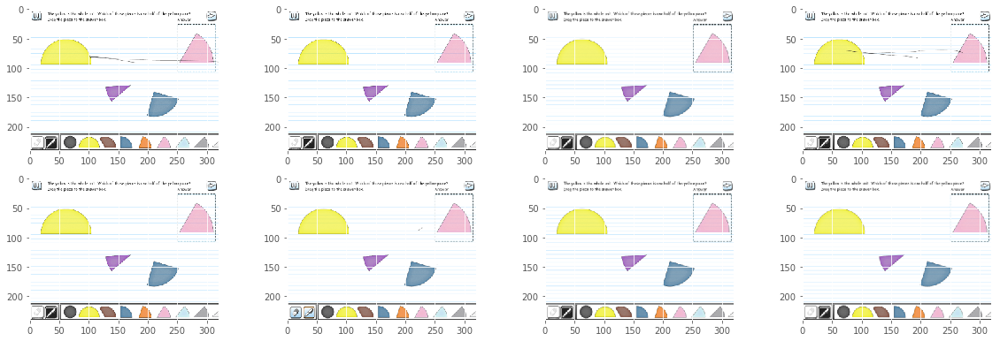

Cluster 0
                           _id behavioral_traits  bonus  correct  diff  \
1089  5a00fd269100de1a39306274                []  False    False     0   
2312  5a010b609100de1a39695a87                []  False    False     0   
930   5a00fb829100de1a3929cde5                []  False    False     0   
475   5a00f5d79100de1a39120679                []  False    False     0   
2309  5a010b5e9100de1a396953f9                []  False    False     0   
2293  5a010b1d9100de1a39685441                []  False    False     0   
2277  5a010af29100de1a3967a90c                []  False    False     0   
1294  5a00ff029100de1a3937e528                []  False    False     0   
921   5a00fb5f9100de1a39293f3c                []  False    False     0   
1329  5a00ff629100de1a3939660c                []  False    False     0   

              id  incomplete           lesson  \
1089  qGGEQyiE_j       False  name_fract_1_v2   
2312  qGGEQyiE_j       False  name_fract_1_v2   
930   qGGEQyiE_j       False

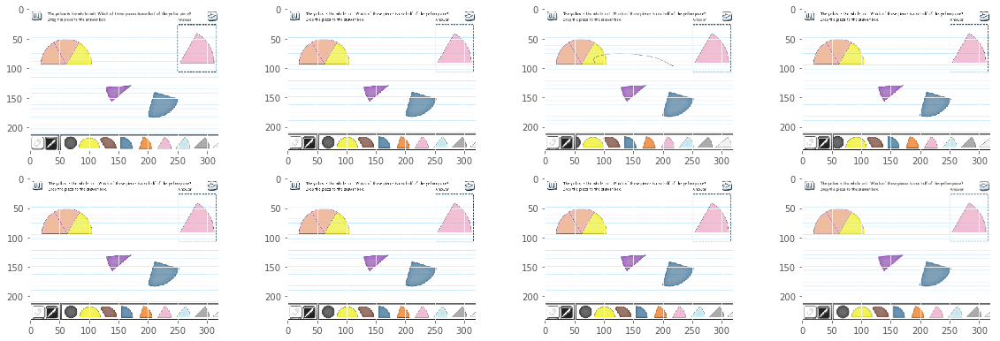

Cluster 7
                           _id behavioral_traits  bonus  correct  diff  \
2132  5a01090b9100de1a39601b69                []  False    False     0   
938   5a00fbae9100de1a392a84c1                []  False    False     0   
2151  5a01095d9100de1a39615b67                []  False    False     0   
955   5a00fbf49100de1a392b9833                []  False    False     0   
960   5a00fc179100de1a392c2007                []  False    False     0   
2114  5a0108c09100de1a395eef17                []  False    False     0   
2101  5a01087c9100de1a395de26a                []  False    False     0   
935   5a00fb989100de1a392a2c03                []  False    False     0   
992   5a00fc579100de1a392d1cd4                []  False    False     0   
1896  5a0104c09100de1a394f13b8                []  False    False     0   

              id  incomplete           lesson  \
2132  qGGEQyiE_j       False  name_fract_1_v2   
938   qGGEQyiE_j       False  name_fract_1_v2   
2151  qGGEQyiE_j       False

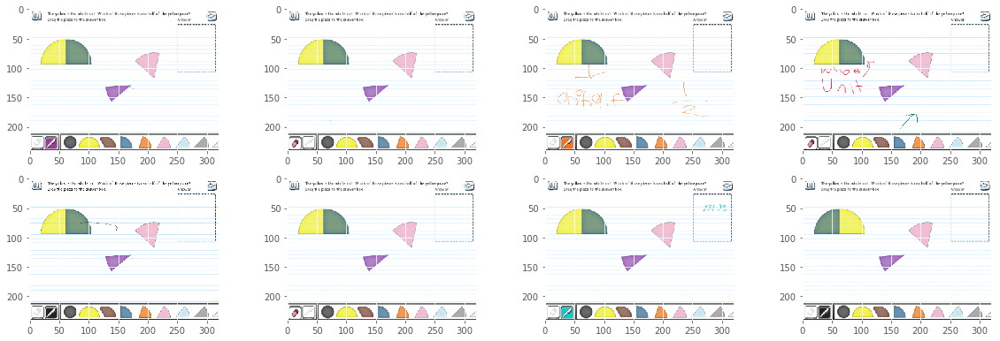

Cluster 4
                           _id behavioral_traits  bonus  correct  diff  \
2658  5a0112199100de1a39841e28                []  False    False     0   
1868  5a0104819100de1a394e11a2                []  False    False     0   
1791  5a0103ef9100de1a394bc5a3                []  False    False     0   
323   5a00f45e9100de1a390bcd78                []  False    False     0   
1597  5a0102259100de1a39448686                []  False    False     0   
1562  5a0101d99100de1a3943519c                []  False    False     0   
1493  5a0100d09100de1a393f1845                []  False    False     0   
1422  5a0100479100de1a393cf7ab                []  False    False     0   
1310  5a00ff359100de1a3938b0ee                []  False    False     0   
3080  5a0116909100de1a3995f102                []  False    False     0   

              id  incomplete           lesson  \
2658  qGGEQyiE_j       False  name_fract_1_v2   
1868  qGGEQyiE_j       False  name_fract_1_v2   
1791  qGGEQyiE_j       False

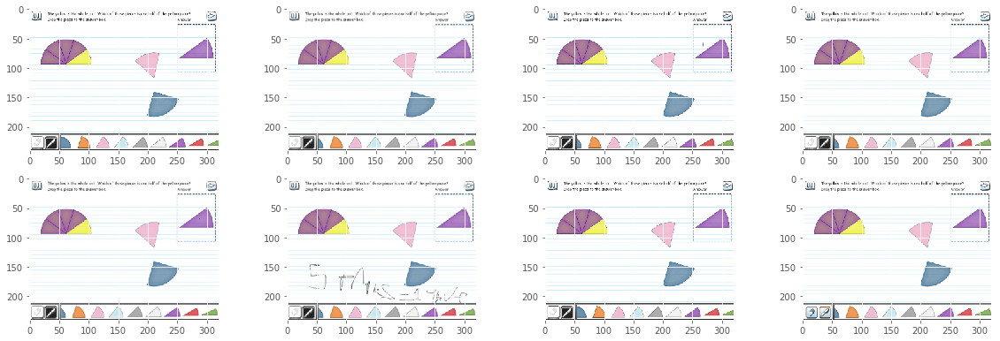

Analysis 9 for qual_id kvig7fcCVc.partb.3y7UMHuR_i with 16876 samples
Session 0 txt  Arrange these fractions from least to greatest.
Drag each fraction into one of the boxes below.
Answer: 2/8,2/6,2/4
Extracting tf-idf features ...
done in 0.599s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.066s
qual_id kvig7fcCVc.partb.3y7UMHuR_i has these clusters
2    1507
9    1080
1     171
5       7
6       6
7       5
8       4
3       2
4       2
Name: cluster, dtype: int64
Distances (2784, 10) [[  1.55092142e-01   1.00000000e+00   1.49011612e-08 ...,   1.00261468e+00
    9.85038214e-01   1.55092142e-01]
 [  1.00000000e+00   0.00000000e+00   1.00000000e+00 ...,   9.90015328e-01
    9.87006631e-01   1.00000000e+00]
 [  1.00000000e+00   0.00000000e+00   1.00000000e+00 ...,   9.90015

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct      diff  \
0     5a00f1879100de1a39005a67                []  False    False  0.093672   
1090  5a00ff509100de1a39391d9d                []  False    False  0.093672   
1089  5a00ff469100de1a3938f54e                []  False    False  0.093672   
1088  5a00ff3d9100de1a3938cf9e                []  False    False  0.093672   
1087  5a00ff389100de1a3938beaa                []  False    False  0.093672   
1086  5a00ff369100de1a3938b4dd                []  False    False  0.093672   
1085  5a00ff2f9100de1a39389aaf                []  False    False  0.093672   
1084  5a00ff2d9100de1a39389267                []  False    False  0.093672   
1083  5a00ff1b9100de1a39384b7b                []  False    False  0.093672   
1082  5a00ff1b9100de1a39384b7a                []  False    False  0.093672   

              id  incomplete            lesson  \
0     3y7UMHuR_i       False  basic_ordering_1   
1090  3y7UMHuR_i       False    adv_order

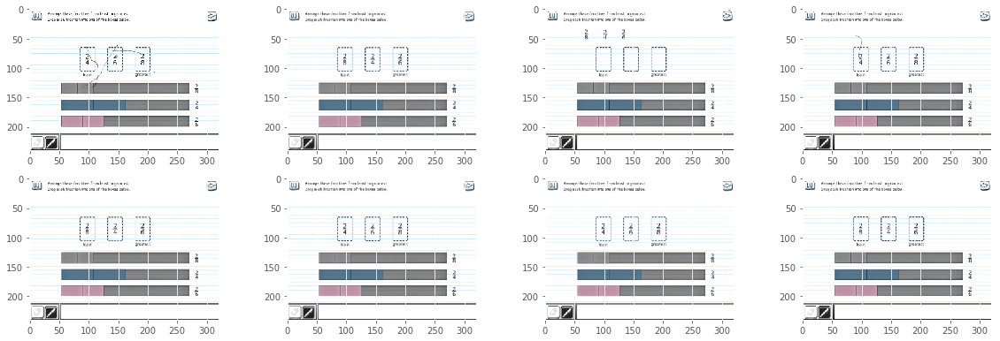

Cluster 9
                           _id behavioral_traits  bonus  correct      diff  \
1307  5a0101e89100de1a39438c1c                []  False    False  0.093672   
2384  5a0114159100de1a398c0446                []  False    False  0.093672   
2386  5a0114279100de1a398c4dc8                []  False    False  0.093672   
2388  5a0114429100de1a398cb55a                []  False    False  0.093672   
2389  5a0114499100de1a398cd129                []  False    False  0.093672   
2390  5a01144c9100de1a398cda22                []  False    False  0.093672   
2391  5a01144f9100de1a398ce5d9                []  False    False  0.093672   
2392  5a0114569100de1a398d0476                []  False    False  0.093672   
2393  5a0114569100de1a398d0477                []  False    False  0.093672   
2394  5a0114599100de1a398d0d29                []  False    False  0.093672   

              id  incomplete            lesson  \
1307  3y7UMHuR_i       False  basic_ordering_1   
2384  3y7UMHuR_i       False   

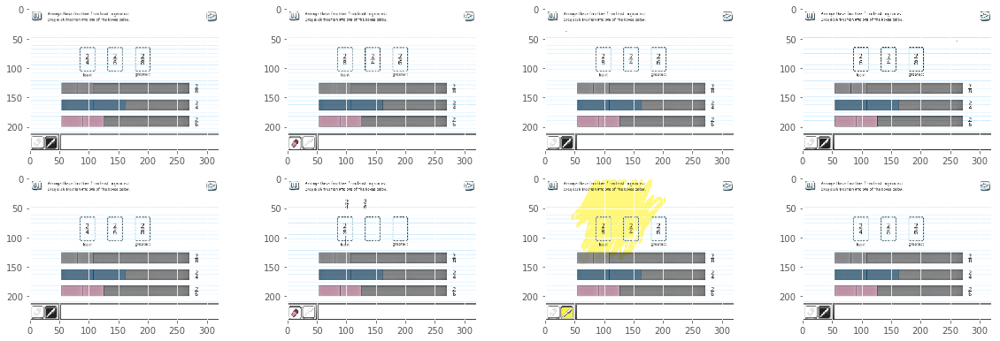

Cluster 1
                           _id behavioral_traits  bonus  correct      diff  \
1     5a00f18d9100de1a390072b8                []  False    False  0.093672   
1684  5a0108219100de1a395c7438                []  False    False  0.093672   
1710  5a0108879100de1a395e10a5                []  False    False  0.093672   
1734  5a0108dd9100de1a395f6264                []  False    False  0.093672   
1751  5a0109489100de1a3961080f                []  False    False  0.093672   
1754  5a01094a9100de1a39611241                []  False    False  0.093672   
1776  5a0109819100de1a3961e964                []  False    False  0.093672   
1789  5a01099b9100de1a39624f6a                []  False    False  0.093672   
1822  5a010a009100de1a3963e6e7                []  False    False  0.093672   
1823  5a010a019100de1a3963ea57                []  False    False  0.093672   

              id  incomplete            lesson  \
1     3y7UMHuR_i       False   review_lesson_1   
1684  3y7UMHuR_i       False  b

Cluster 5
                           _id behavioral_traits  bonus  correct      diff  \
57    5a00f2049100de1a3902514a                []  False    False  0.093672   
58    5a00f2049100de1a3902514b                []  False    False  0.093672   
254   5a00f4899100de1a390c7faf                []  False    False  0.093672   
864   5a00fc5c9100de1a392d324a                []  False    False  0.093672   
1000  5a00fdbc9100de1a3932c4bd                []  False    False  0.093672   
1001  5a00fdbc9100de1a3932c4be                []  False    False  0.093672   
498   5a00f6fc9100de1a39172f44                []  False    False  0.093672   

              id  incomplete            lesson  \
57    3y7UMHuR_i       False   review_lesson_1   
58    3y7UMHuR_i       False   review_lesson_1   
254   3y7UMHuR_i       False  basic_ordering_1   
864   3y7UMHuR_i       False  basic_ordering_1   
1000  3y7UMHuR_i       False  basic_ordering_1   
1001  3y7UMHuR_i       False  basic_ordering_1   
498   3y7UMHuR_

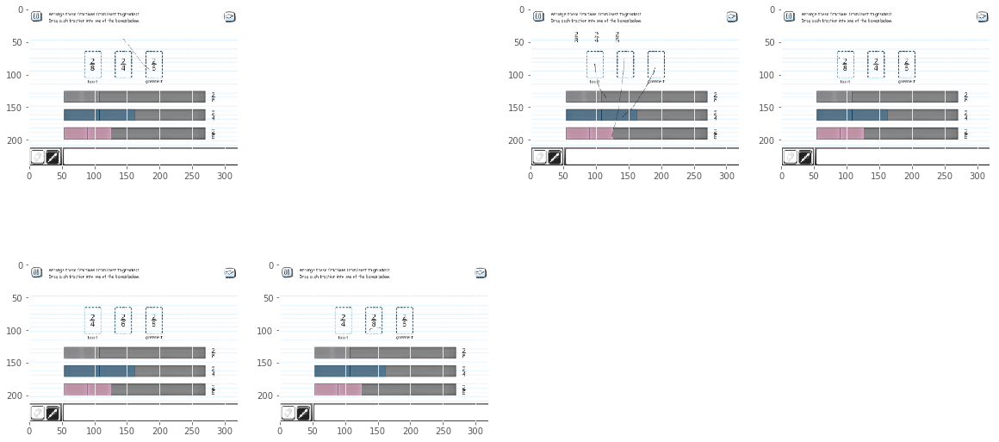

Analysis 10 for qual_id kvig7fcCVc.partb.1jPc7UeCZc with 16552 samples
Session 0 txt  Arrange these fractions from least to greatest.
Drag each fraction into one of the boxes below.
Answer: 2/12,2/6,2/4
Extracting tf-idf features ...
done in 0.444s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.062s
qual_id kvig7fcCVc.partb.1jPc7UeCZc has these clusters
3    879
0    603
1    139
2      8
8      5
5      5
6      3
4      3
9      2
7      1
Name: cluster, dtype: int64
Distances (1648, 10) [[ 0.15504344  1.          0.94563209 ...,  0.89986703  0.94107375
   0.96272401]
 [ 0.15504344  1.          0.94563209 ...,  0.89986703  0.94107375
   0.96272401]
 [ 0.15504344  1.          0.94563209 ...,  0.89986703  0.94107375
   0.96272401]
 ..., 
 [ 0.          1.          0.9424516

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                          _id behavioral_traits  bonus  correct      diff  \
0    5a00f1789100de1a39001699                []  False    False  0.446766   
636  5a00ff6f9100de1a39399c70                []  False    False  0.446766   
637  5a00ff739100de1a3939ab1c                []  False    False  0.446766   
638  5a00ff7c9100de1a3939ce26                []  False    False  0.446766   
639  5a00ff809100de1a3939df05                []  False    False  0.446766   
640  5a00ff809100de1a3939df06                []  False    False  0.446766   
641  5a00ff8a9100de1a393a08de                []  False    False  0.446766   
642  5a00ff8a9100de1a393a08df                []  False    False  0.446766   
643  5a00ff899100de1a393a0395                []  False    False  0.446766   
644  5a00ff899100de1a393a0396                []  False    False  0.446766   

             id  incomplete            lesson  \
0    1jPc7UeCZc       False  basic_ordering_1   
636  1jPc7UeCZc       False  basic_ordering_1   
637  

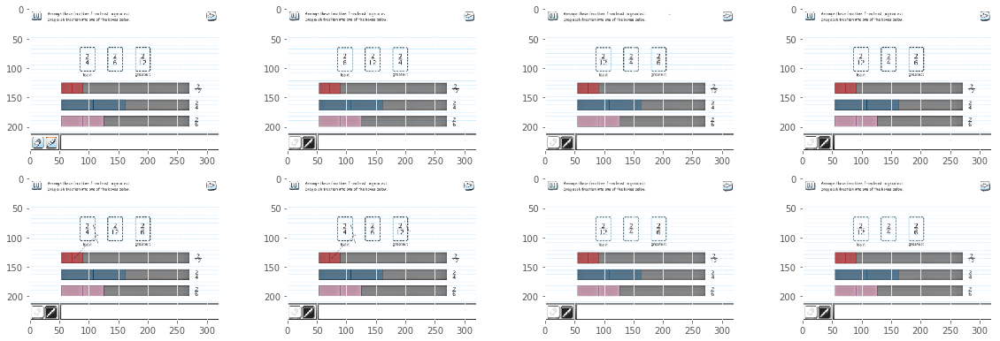

Cluster 0
                           _id behavioral_traits  bonus  correct      diff  \
743   5a0102229100de1a39447abc                []  False    False  0.446766   
1419  5a0114a09100de1a398e269e                []  False    False  0.446766   
1420  5a0114b09100de1a398e66c8                []  False    False  0.446766   
1421  5a0114b49100de1a398e7822                []  False    False  0.446766   
1423  5a0114ba9100de1a398e9091                []  False    False  0.446766   
1424  5a0114bb9100de1a398e92d6                []  False    False  0.446766   
1425  5a0114c49100de1a398eb72b                []  False    False  0.446766   
1417  5a0114999100de1a398e0af6                []  False    False  0.446766   
1426  5a0114d99100de1a398f0b16                []  False    False  0.446766   
1429  5a0114db9100de1a398f1309                []  False    False  0.446766   

              id  incomplete            lesson  \
743   1jPc7UeCZc       False  basic_ordering_1   
1419  1jPc7UeCZc       False  b

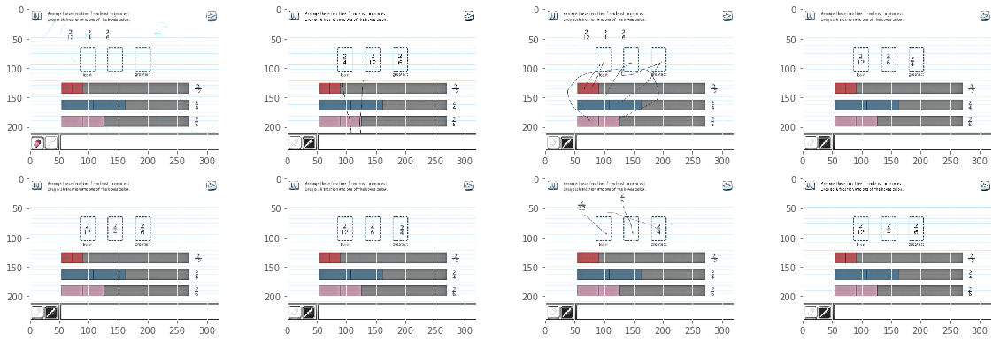

Cluster 1
                           _id behavioral_traits  bonus  correct      diff  \
8     5a00f1929100de1a3900885a                []  False    False  0.446766   
1256  5a0110159100de1a397c178e                []  False    False  0.446766   
1255  5a0110159100de1a397c178f                []  False    False  0.446766   
1203  5a010edb9100de1a397734b9                []  False    False  0.446766   
1199  5a010eb99100de1a3976acc2                []  False    False  0.446766   
1190  5a010e769100de1a39759dc9                []  False    False  0.446766   
1178  5a010e009100de1a3973c47f                []  False    False  0.446766   
1169  5a010db49100de1a39728faa                []  False    False  0.446766   
1165  5a010d7c9100de1a3971b4f0                []  False    False  0.446766   
1158  5a010d2b9100de1a39707654                []  False    False  0.446766   

              id  incomplete            lesson  \
8     1jPc7UeCZc       False   review_lesson_1   
1256  1jPc7UeCZc       False   

Cluster 2
                           _id behavioral_traits  bonus  correct      diff  \
477   5a00fbf29100de1a392b90ce                []  False    False  0.446766   
478   5a00fbf29100de1a392b90cf                []  False    False  0.446766   
479   5a00fbf79100de1a392ba4d1                []  False    False  0.446766   
1032  5a0109ab9100de1a39628ea9                []  False    False  0.446766   
1034  5a0109ab9100de1a39628ea8                []  False    False  0.446766   
1216  5a010f169100de1a39781969                []  False    False  0.446766   
50    5a00f2139100de1a39028f25                []  False    False  0.446766   
390   5a00f8d99100de1a391f14b3                []  False    False  0.446766   

              id  incomplete           lesson  \
477   1jPc7UeCZc       False   adv_ordering_2   
478   1jPc7UeCZc       False   adv_ordering_2   
479   1jPc7UeCZc       False   adv_ordering_2   
1032  1jPc7UeCZc       False   adv_ordering_2   
1034  1jPc7UeCZc       False   adv_orderin

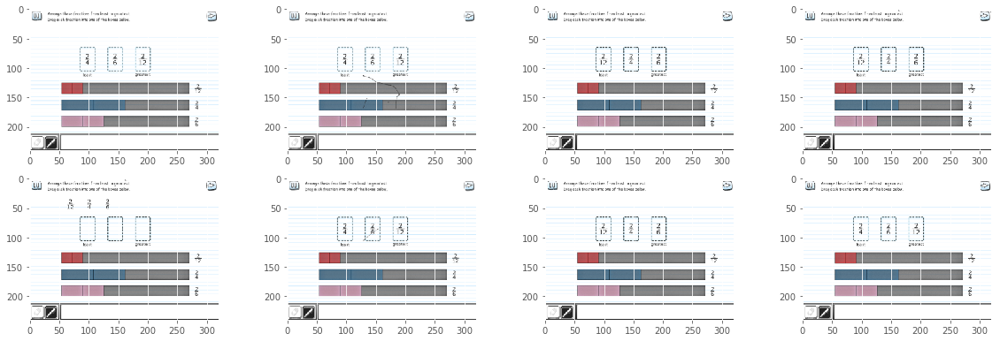

Analysis 11 for qual_id 9wRCzK1G7F.partb.dHZqaGepfV with 16444 samples
Session 0 txt  The dark blue is the whole unit. Which of these pieces is one half of the dark blue piece?
Drag the piece to the answer box.
Answer: 1/8
Extracting tf-idf features ...
done in 0.303s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.220s
qual_id 9wRCzK1G7F.partb.dHZqaGepfV has these clusters
0    1009
6     409
2     161
1     144
8     133
4     132
3      99
5      69
9      43
7       2
Name: cluster, dtype: int64
Distances (2201, 10) [[ 0.62051176  0.95188305  0.99224861 ...,  0.540053    0.37112226
   0.86909117]
 [ 0.39456996  0.87942378  0.99232317 ...,  0.72284989  0.56057142
   0.91277827]
 [ 0.70242287  0.98092035  0.99238312 ...,  0.6449786   0.36671374
   0.85742259]
 ..., 
 [ 0.4

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct      diff  \
8     5a00f1b49100de1a390111d8                []  False    False  0.442304   
875   5a0101ed9100de1a3943a2e3                []  False    False  0.442304   
878   5a0101f09100de1a3943ad55                []  False    False  0.442304   
880   5a0101f49100de1a3943bd9a                []  False    False  0.442304   
1591  5a01112f9100de1a3980857f                []  False    False  0.442304   
882   5a0101f59100de1a3943c397                []  False    False  0.442304   
1588  5a01111e9100de1a39803c1d                []  False    False  0.442304   
868   5a0101dd9100de1a39435ec3                []  False    False  0.442304   
887   5a0102139100de1a39444035                []  False    False  0.442304   
890   5a01021b9100de1a394460f2                []  False    False  0.442304   

              id  incomplete           lesson  \
8     dHZqaGepfV       False  name_fract_1_v2   
875   dHZqaGepfV       False  name_fract_1_

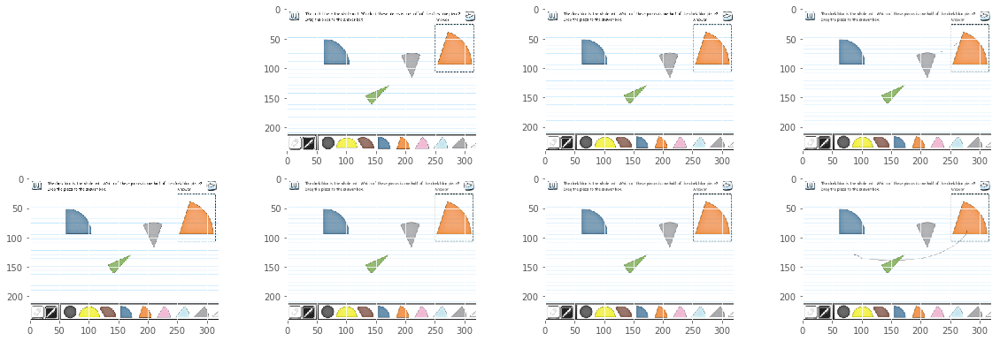

Cluster 6
                           _id behavioral_traits  bonus  correct      diff  \
991   5a0103659100de1a39499426                []  False    False  0.442304   
559   5a00fc089100de1a392be80e                []  False    False  0.442304   
1627  5a0112529100de1a3984fa80                []  False    False  0.442304   
567   5a00fc599100de1a392d22fb                []  False    False  0.442304   
568   5a00fc5b9100de1a392d2cb0                []  False    False  0.442304   
1619  5a0111f89100de1a3983a22c                []  False    False  0.442304   
571   5a00fc6f9100de1a392d7a73                []  False    False  0.442304   
1614  5a0111b99100de1a3982a970                []  False    False  0.442304   
575   5a00fc7a9100de1a392da719                []  False    False  0.442304   
577   5a00fc799100de1a392da2c8                []  False    False  0.442304   

              id  incomplete           lesson  \
991   dHZqaGepfV       False  name_fract_1_v2   
559   dHZqaGepfV       False  nam

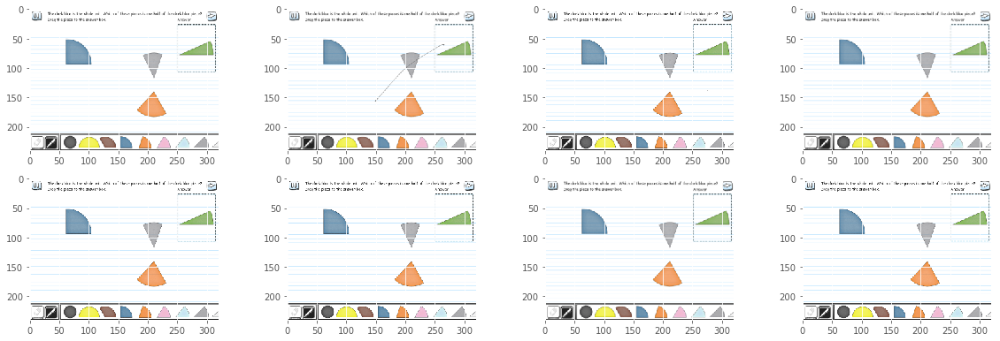

Cluster 2
                           _id behavioral_traits  bonus  correct      diff  \
4     5a00f1759100de1a39000b91                []  False    False  0.442304   
1336  5a010ac79100de1a3967045b                []  False    False  0.442304   
1348  5a010ae99100de1a396783ff                []  False    False  0.442304   
1366  5a010b529100de1a3969245c                []  False    False  0.442304   
1384  5a010baa9100de1a396a7f29                []  False    False  0.442304   
1388  5a010bc89100de1a396af794                []  False    False  0.442304   
1402  5a010bfb9100de1a396bc33c                []  False    False  0.442304   
1407  5a010c069100de1a396bf15a                []  False    False  0.442304   
1422  5a010c469100de1a396ceab3                []  False    False  0.442304   
1443  5a010cc59100de1a396ee19f                []  False    False  0.442304   

              id  incomplete           lesson  \
4     dHZqaGepfV       False  name_fract_1_v2   
1336  dHZqaGepfV       False  nam

Cluster 1
                           _id behavioral_traits  bonus  correct      diff  \
5     5a00f1789100de1a39001a83                []  False    False  0.442304   
1822  5a01161a9100de1a3994183f                []  False    False  0.442304   
556   5a00fbcc9100de1a392afa55                []  False    False  0.442304   
1122  5a0105d69100de1a39535fe3                []  False    False  0.442304   
1794  5a0115b79100de1a39928fdc                []  False    False  0.442304   
1750  5a0115399100de1a3990921c                []  False    False  0.442304   
634   5a00fd889100de1a3931f5bc                []  False    False  0.442304   
1691  5a0114bb9100de1a398e94db                []  False    False  0.442304   
1686  5a0114a79100de1a398e43de                []  False    False  0.442304   
674   5a00fe429100de1a3934da0e                []  False    False  0.442304   

              id  incomplete           lesson  \
5     dHZqaGepfV       False  name_fract_1_v2   
1822  dHZqaGepfV       False  nam

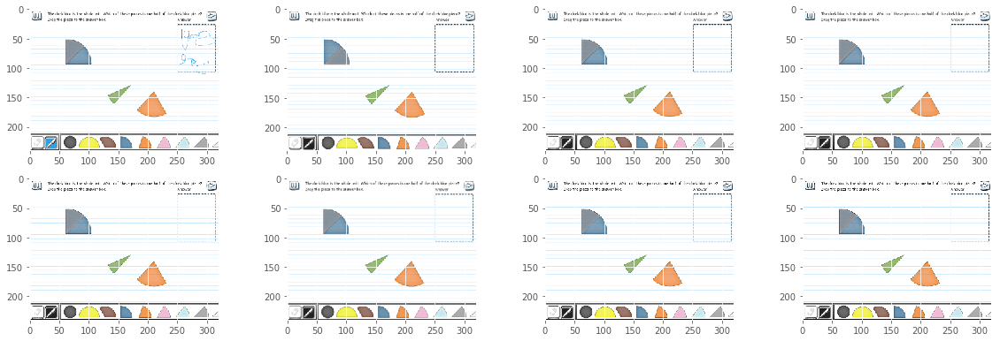

Analysis 12 for qual_id _trDQgmx9g.bonus.S2xjdLDOgA with 15948 samples
Session 0 txt  Model a fraction bigger than  1/8 .
Answer: 0.125
Extracting tf-idf features ...
done in 0.300s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.183s
qual_id _trDQgmx9g.bonus.S2xjdLDOgA has these clusters
0    1698
9     397
6     327
3     263
1     251
4     236
7      94
2      77
5      59
8      28
Name: cluster, dtype: int64
Distances (3430, 10) [[ 1.36072167  0.08164846  1.28426529 ...,  1.15169442  1.41421356
   0.97962676]
 [ 1.00186612  1.38949504  0.84072945 ...,  1.11676862  1.41421356
   0.94973154]
 [ 0.00686515  1.33435436  1.15148689 ...,  1.08677828  1.39532615
   0.90439567]
 ..., 
 [ 0.00686515  1.33435436  1.15148689 ...,  1.08677828  1.39532615
   0.90439567]
 [ 0.006865

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
2     5a00f1799100de1a39001ce2                []   True    False     1   
2368  5a010e879100de1a3975e20d                []   True    False     1   
2364  5a010e599100de1a39752f03                []   True    False     1   
2363  5a010e539100de1a3975199f                []   True    False     1   
2361  5a010e4e9100de1a397503fa                []   True    False     1   
2360  5a010e459100de1a3974dee5                []   True    False     1   
2354  5a010e229100de1a397451bb                []   True    False     1   
2353  5a010e0e9100de1a397400fb                []   True    False     1   
2352  5a010e0b9100de1a3973f2bc                []   True    False     1   
2350  5a010ded9100de1a3973756e                []   True    False     1   

              id  incomplete            lesson  \
2     S2xjdLDOgA       False  basic_ordering_1   
2368  S2xjdLDOgA       False  basic_ordering_1   
2364  S2xjdLDOgA       False  basic

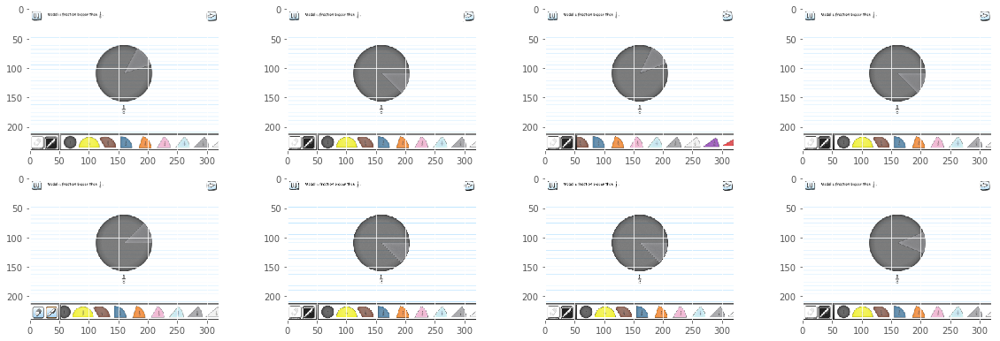

Cluster 9
                           _id behavioral_traits  bonus  correct  diff  \
3381  5a0119a49100de1a39a24b7f                []   True    False     1   
265   5a00f3e59100de1a3909e976                []   True    False     1   
1902  5a01063f9100de1a3955024f                []   True    False     1   
624   5a00f6949100de1a391530c2                []   True    False     1   
310   5a00f4459100de1a390b6f19                []   True    False     1   
1901  5a01063b9100de1a3954f261                []   True    False     1   
337   5a00f4919100de1a390c9ede                []   True    False     1   
356   5a00f4a69100de1a390cf029                []   True    False     1   
1828  5a0104e99100de1a394fb7b2                []   True    False     1   
376   5a00f4b79100de1a390d33a0                []   True    False     1   

              id  incomplete            lesson  \
3381  S2xjdLDOgA       False  basic_ordering_1   
265   S2xjdLDOgA       False  basic_ordering_1   
1902  S2xjdLDOgA       Fa

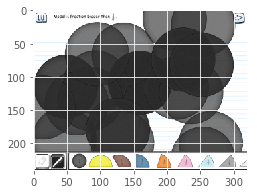

Cluster 6
                           _id behavioral_traits  bonus  correct  diff  \
2502  5a0110ee9100de1a397f7a53                []   True    False     1   
1495  5a0100ba9100de1a393ebcdd                []   True    False     1   
2795  5a0115379100de1a39908bf0                []   True    False     1   
3079  5a0117379100de1a39988c5a                []   True    False     1   
1507  5a0100d99100de1a393f3cd9                []   True    False     1   
2745  5a0114e39100de1a398f35ae                []   True    False     1   
2744  5a0114e39100de1a398f3391                []   True    False     1   
1535  5a0101349100de1a3940b1b9                []   True    False     1   
667   5a00f6e29100de1a3916ad7f                []   True    False     1   
744   5a00f7649100de1a3918eabe                []   True    False     1   

              id  incomplete            lesson  \
2502  S2xjdLDOgA       False  basic_ordering_1   
1495  S2xjdLDOgA       False  basic_ordering_1   
2795  S2xjdLDOgA       Fa

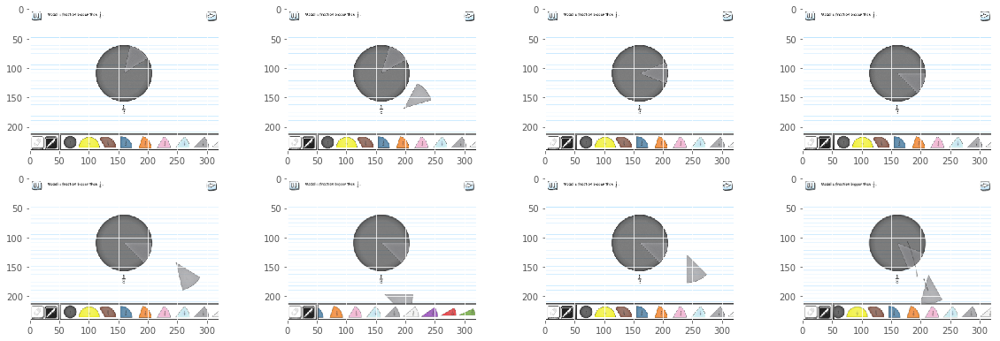

Cluster 3
                           _id behavioral_traits  bonus  correct  diff  \
3148  5a0117bc9100de1a399aa068                []   True    False     1   
1484  5a01009f9100de1a393e5137                []   True    False     1   
2740  5a0114e19100de1a398f29c2                []   True    False     1   
1513  5a0100e89100de1a393f7892                []   True    False     1   
1546  5a01013c9100de1a3940d256                []   True    False     1   
1556  5a0101569100de1a39413a23                []   True    False     1   
3227  5a0118619100de1a399d377b                []   True    False     1   
3136  5a01179e9100de1a399a2c7d                []   True    False     1   
3314  5a0119019100de1a399fb66a                []   True    False     1   
2700  5a0114249100de1a398c41d4                []   True    False     1   

              id  incomplete            lesson  \
3148  S2xjdLDOgA       False  basic_ordering_1   
1484  S2xjdLDOgA       False  basic_ordering_1   
2740  S2xjdLDOgA       Fa

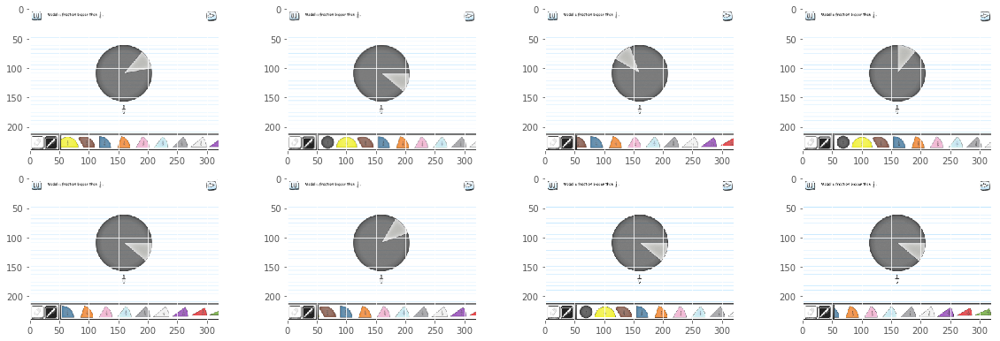

Analysis 13 for qual_id UlJYoQjOUR.parta.byIwJMROwV with 15944 samples
Session 0 txt  Model 1/2 of the black bar by dragging the one half piece onto the black bar.
Answer: [object Object]
Extracting tf-idf features ...
done in 0.501s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.068s
qual_id UlJYoQjOUR.parta.byIwJMROwV has these clusters
2    1184
0     834
9     524
4     479
1     361
5     259
6     189
7     113
8      99
3      64
Name: cluster, dtype: int64
Distances (4106, 10) [[ 0.64700368  0.97124206  0.64300864 ...,  0.73615566  0.92296523
   0.59555457]
 [ 0.96555268  0.04939211  0.98477677 ...,  0.88679858  0.92814474
   0.85146833]
 [ 0.96555268  0.04939211  0.98477677 ...,  0.88679858  0.92814474
   0.85146833]
 ..., 
 [ 0.22178697  0.96798973  0.45186288 ...

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
1545  5a00fea19100de1a3936576d                []  False    False     0   
1392  5a00fcba9100de1a392ea855                []  False    False     0   
1388  5a00fcae9100de1a392e7603                []  False    False     0   
1387  5a00fcad9100de1a392e7385                []  False    False     0   
1382  5a00fc859100de1a392dd18f                []  False    False     0   
1375  5a00fc849100de1a392dcfca                []  False    False     0   
1374  5a00fc849100de1a392dcfc9                []  False    False     0   
1369  5a00fc829100de1a392dc6c3                []  False    False     0   
1368  5a00fc789100de1a392da030                []  False    False     0   
1359  5a00fc769100de1a392d94d9                []  False    False     0   

              id  incomplete             lesson  \
1545  byIwJMROwV       False  model_symbol_3_v3   
1392  byIwJMROwV       False  model_symbol_3_v3   
1388  byIwJMROwV       False  mo

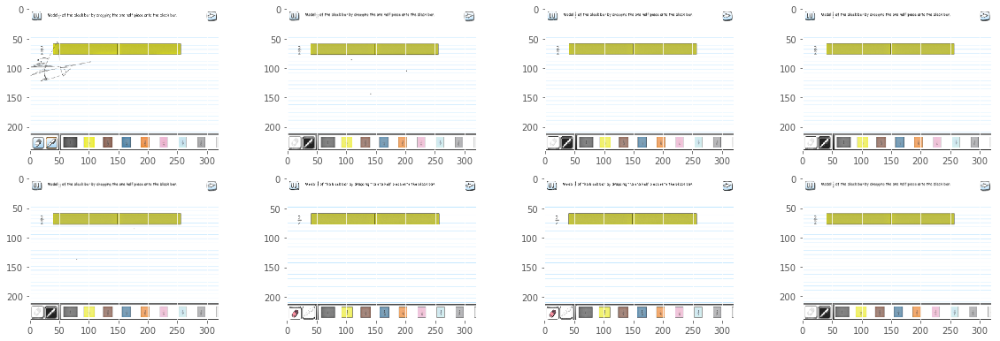

Cluster 0
                           _id behavioral_traits  bonus  correct  diff  \
3114  5a0114889100de1a398dc5a9                []  False    False     0   
3181  5a0114f09100de1a398f699d                []  False    False     0   
3798  5a0117fc9100de1a399ba223                []  False    False     0   
936   5a00f74e9100de1a39188d47                []  False    False     0   
1396  5a00fcbf9100de1a392ebbbe                []  False    False     0   
1485  5a00fdd69100de1a39332b62                []  False    False     0   
1622  5a00ff569100de1a39393582                []  False    False     0   
1621  5a00ff569100de1a39393581                []  False    False     0   
1259  5a00fb669100de1a39295ccb                []  False    False     0   
2053  5a0103519100de1a394944a4                []  False    False     0   

              id  incomplete             lesson  \
3114  byIwJMROwV       False  model_symbol_3_v3   
3181  byIwJMROwV       False  model_symbol_3_v3   
3798  byIwJMROwV      

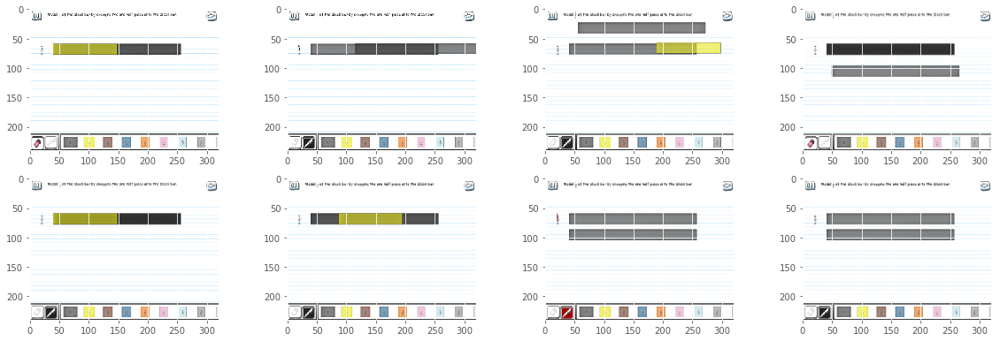

Cluster 9
                           _id behavioral_traits  bonus  correct  diff  \
2398  5a01088b9100de1a395e2097                []  False    False     0   
4077  5a0119d89100de1a39a317b5                []  False    False     0   
379   5a00f3c69100de1a39096c7a                []  False    False     0   
3632  5a0117219100de1a39983281                []  False    False     0   
2161  5a0104a09100de1a394e90da                []  False    False     0   
1643  5a00ffa09100de1a393a5ee8                []  False    False     0   
3681  5a0117829100de1a3999b868                []  False    False     0   
1159  5a00fa239100de1a39244ee9                []  False    False     0   
2200  5a0105589100de1a39516d94                []  False    False     0   
2247  5a01061c9100de1a395477c6                []  False    False     0   

              id  incomplete             lesson  \
2398  byIwJMROwV       False  model_symbol_3_v3   
4077  byIwJMROwV       False  model_symbol_3_v3   
379   byIwJMROwV      

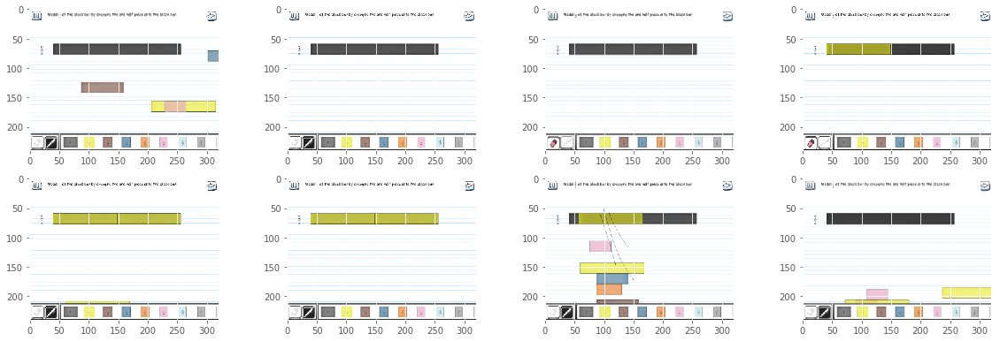

Cluster 4
                           _id behavioral_traits  bonus  correct  diff  \
2830  5a010fcc9100de1a397af2a3                []  False    False     0   
2795  5a010f249100de1a39784f3a                []  False    False     0   
2806  5a010f4d9100de1a3978f60e                []  False    False     0   
2810  5a010f689100de1a3979626e                []  False    False     0   
2827  5a010fbf9100de1a397ab90e                []  False    False     0   
2095  5a0103d79100de1a394b6321                []  False    False     0   
2846  5a0110379100de1a397c9caf                []  False    False     0   
2887  5a0110f59100de1a397f9698                []  False    False     0   
2920  5a0111549100de1a398116f2                []  False    False     0   
2921  5a0111549100de1a39811700                []  False    False     0   

              id  incomplete             lesson  \
2830  byIwJMROwV       False  model_symbol_3_v3   
2795  byIwJMROwV       False  model_symbol_3_v3   
2806  byIwJMROwV      

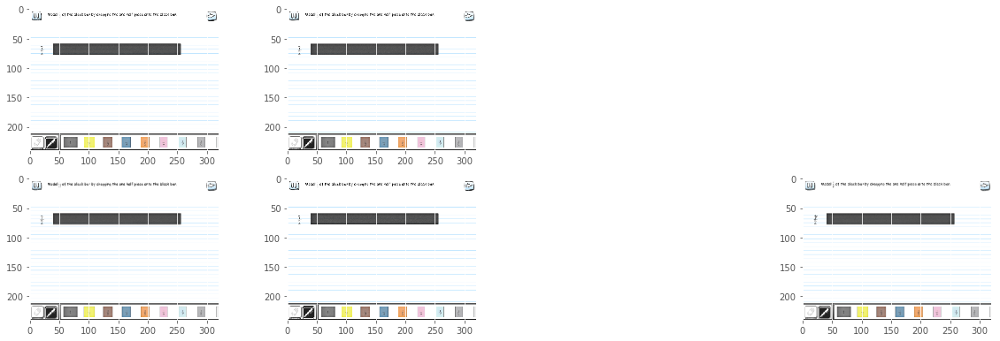

Analysis 14 for qual_id HaXmMUnltl.bonus.WB6U9OhvZi with 14952 samples
Session 0 txt  Enter two fractions that are greater than 1/4 and less than 1.
Answer: 1/4
Extracting tf-idf features ...
done in 0.279s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.029s
qual_id HaXmMUnltl.bonus.WB6U9OhvZi has these clusters
5    1576
3    1175
2     482
1     466
6     333
4     229
7     173
0     158
8      96
9      60
Name: cluster, dtype: int64
Distances (4748, 10) [[ 1.36769216  0.41409321  1.40741984 ...,  1.38999541  1.38864397
   1.40270927]
 [ 1.3203812   1.31351573  0.00674412 ...,  1.30384054  1.32168158
   1.33878638]
 [ 1.35368371  1.32139513  1.34463234 ...,  1.33838307  1.34841157
   1.36428166]
 ..., 
 [ 1.32603878  0.66469447  1.41218594 ...,  1.3939293   1.38735711
 

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
59    5a00f1ca9100de1a390168f0                []   True    False     1   
326   5a00f3629100de1a3907d9b6                []   True    False     1   
21    5a00f1a19100de1a3900c35e                []   True    False     1   
179   5a00f24f9100de1a390383ea                []   True    False     1   
2820  5a0105d29100de1a39534f68                []   True    False     1   
587   5a00f4b59100de1a390d2ba8                []   True    False     1   
4592  5a0118b49100de1a399e861e                []   True    False     1   
2850  5a0106369100de1a3954de19                []   True    False     1   
2821  5a0105d29100de1a39534f69                []   True    False     1   
2625  5a0103c39100de1a394b1216                []   True    False     1   

              id  incomplete      lesson  \
59    WB6U9OhvZi       False  ordering_5   
326   WB6U9OhvZi       False  ordering_5   
21    WB6U9OhvZi       False  ordering_5   
179   WB6

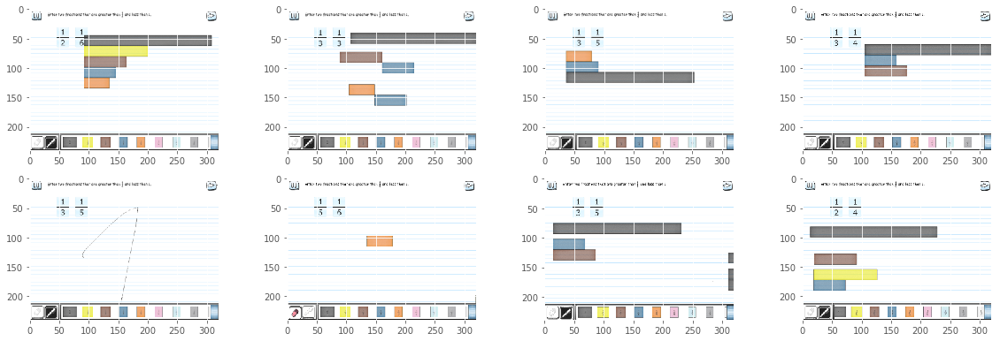

Cluster 3
                           _id behavioral_traits  bonus  correct  diff  \
699   5a00f57a9100de1a39105408                []   True    False     1   
3150  5a0109589100de1a396146d5                []   True    False     1   
556   5a00f4a09100de1a390cd811                []   True    False     1   
3143  5a0109469100de1a3960fe6a                []   True    False     1   
3142  5a0109429100de1a3960efe5                []   True    False     1   
3115  5a0108f19100de1a395fb650                []   True    False     1   
2260  5a01004a9100de1a393d01bb                []   True    False     1   
1034  5a00f72f9100de1a39180fde                []   True    False     1   
3053  5a0108319100de1a395cb75e                []   True    False     1   
2271  5a01006d9100de1a393d8c4d                []   True    False     1   

              id  incomplete      lesson  \
699   WB6U9OhvZi       False  ordering_5   
3150  WB6U9OhvZi       False  ordering_5   
556   WB6U9OhvZi       False  ordering_5   

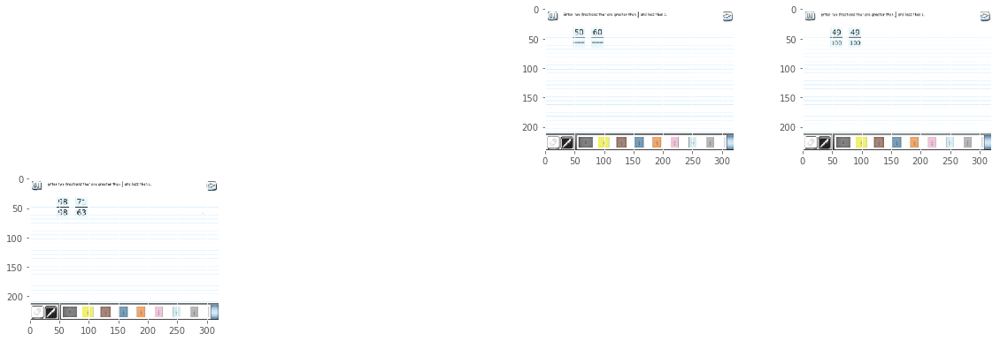

Cluster 2
                           _id behavioral_traits  bonus  correct  diff  \
1     5a00f1769100de1a39001190                []   True    False     1   
3364  5a010b979100de1a396a322a                []   True    False     1   
3358  5a010b979100de1a396a322b                []   True    False     1   
3351  5a010b809100de1a3969d968                []   True    False     1   
3348  5a010b689100de1a3969789c                []   True    False     1   
3346  5a010b629100de1a3969636f                []   True    False     1   
3344  5a010b629100de1a39696323                []   True    False     1   
3332  5a010b469100de1a3968f565                []   True    False     1   
3331  5a010b469100de1a3968f564                []   True    False     1   
3325  5a010b349100de1a3968b130                []   True    False     1   

              id  incomplete      lesson  \
1     WB6U9OhvZi       False  ordering_5   
3364  WB6U9OhvZi       False  ordering_5   
3358  WB6U9OhvZi       False  ordering_5   

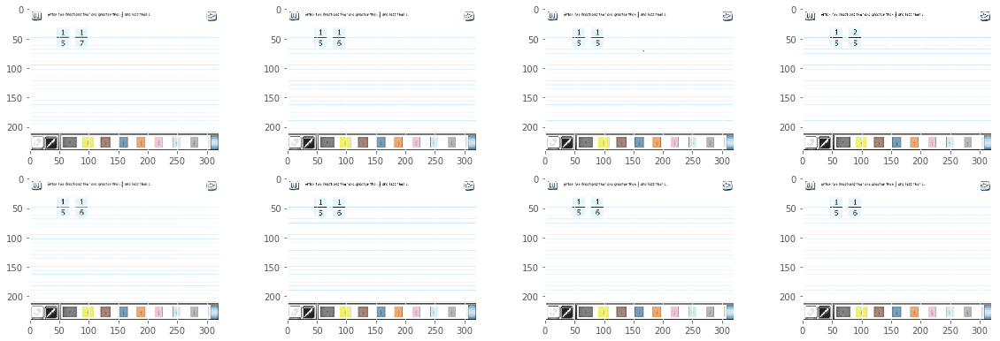

Cluster 1
                           _id behavioral_traits  bonus  correct  diff  \
2331  5a01010d9100de1a3940105a                []   True    False     1   
2474  5a01023c9100de1a3944e492                []   True    False     1   
588   5a00f4b59100de1a390d2c50                []   True    False     1   
502   5a00f4409100de1a390b58ee                []   True    False     1   
3523  5a010d5a9100de1a39712c60                []   True    False     1   
3704  5a010f929100de1a397a04e7                []   True    False     1   
4454  5a01177f9100de1a3999ac57                []   True    False     1   
1825  5a00fd1c9100de1a39303a9f                []   True    False     1   
1826  5a00fd1c9100de1a39303aa0                []   True    False     1   
4037  5a0113fc9100de1a398ba20a                []   True    False     1   

              id  incomplete      lesson  \
2331  WB6U9OhvZi       False  ordering_5   
2474  WB6U9OhvZi       False  ordering_5   
588   WB6U9OhvZi       False  ordering_5   

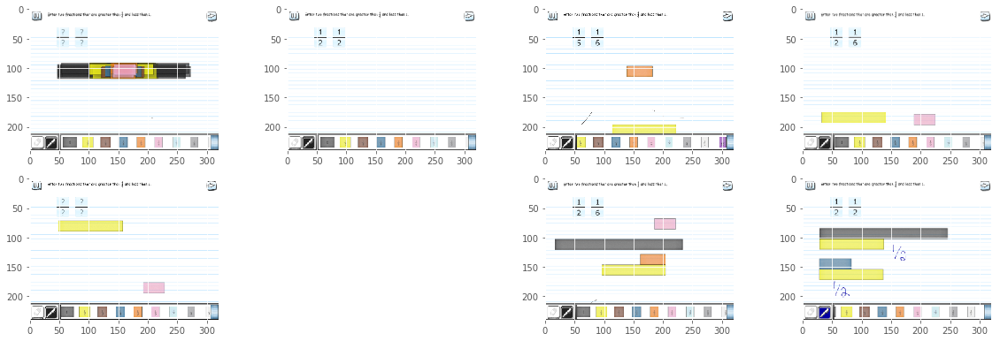

Analysis 15 for qual_id 9wRCzK1G7F.partb.75ayW9Wz4k with 14780 samples
Session 0 txt  The dark blue is the whole unit. Which of these pieces is one third of the dark blue piece?
Drag the piece to the answer box.
Answer: 1/12
Extracting tf-idf features ...
done in 0.199s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.041s
qual_id 9wRCzK1G7F.partb.75ayW9Wz4k has these clusters
1    848
8    565
3    352
4    335
2    292
9    160
6    151
0    108
5     77
7     13
Name: cluster, dtype: int64
Distances (2901, 10) [[ 0.64150741  0.95219546  0.93660679 ...,  0.70969179  0.29647245
   0.92401204]
 [ 0.64150741  0.95219546  0.93660679 ...,  0.70969179  0.29647245
   0.92401204]
 [ 0.71768858  1.28449954  1.25216664 ...,  1.16018186  0.99520636
   1.28593544]
 ..., 
 [ 1.15279831 

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct      diff  \
4     5a00f1799100de1a39001c40                []  False    False  0.781695   
1738  5a010abe9100de1a3966e107                []  False    False  0.781695   
1747  5a010ad09100de1a39672672                []  False    False  0.781695   
1758  5a010aee9100de1a39679891                []  False    False  0.781695   
1765  5a010b029100de1a3967ea73                []  False    False  0.781695   
1771  5a010b1c9100de1a3968504e                []  False    False  0.781695   
1780  5a010b319100de1a3968a3fc                []  False    False  0.781695   
1781  5a010b499100de1a39690125                []  False    False  0.781695   
1728  5a010a7f9100de1a3965e975                []  False    False  0.781695   
1784  5a010b4d9100de1a39691232                []  False    False  0.781695   

              id  incomplete           lesson  \
4     75ayW9Wz4k       False  name_fract_1_v2   
1738  75ayW9Wz4k       False  name_fract_1_

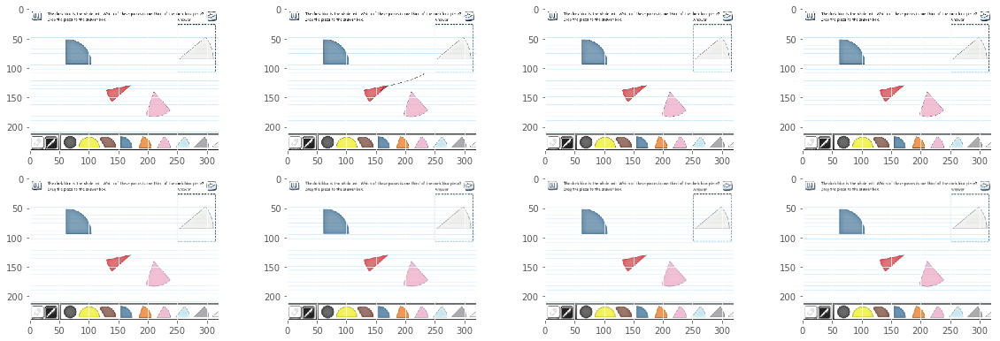

Cluster 8
                           _id behavioral_traits  bonus  correct      diff  \
0     5a00f1759100de1a39000b90                []  False    False  0.781695   
1198  5a0102199100de1a394456f5                []  False    False  0.781695   
1243  5a0102a29100de1a3946851b                []  False    False  0.781695   
1255  5a0102d19100de1a394745ac                []  False    False  0.781695   
1308  5a01036a9100de1a3949a4f8                []  False    False  0.781695   
1344  5a0104169100de1a394c6111                []  False    False  0.781695   
1355  5a01042c9100de1a394cb98c                []  False    False  0.781695   
1356  5a01042f9100de1a394cc5cf                []  False    False  0.781695   
1368  5a0104649100de1a394d9964                []  False    False  0.781695   
1369  5a0104649100de1a394d9a41                []  False    False  0.781695   

              id  incomplete           lesson  \
0     75ayW9Wz4k       False  name_fract_1_v2   
1198  75ayW9Wz4k       False  nam

Cluster 3
                           _id behavioral_traits  bonus  correct      diff  \
6     5a00f17a9100de1a390020e5                []  False    False  0.781695   
1502  5a0106c29100de1a39571012                []  False    False  0.781695   
1518  5a01074a9100de1a39592c6b                []  False    False  0.781695   
1519  5a01074c9100de1a39593188                []  False    False  0.781695   
1523  5a01074f9100de1a39593fab                []  False    False  0.781695   
1535  5a0107829100de1a395a06c7                []  False    False  0.781695   
1537  5a0107919100de1a395a3d05                []  False    False  0.781695   
1557  5a0107a99100de1a395a9ca6                []  False    False  0.781695   
1566  5a0107cd9100de1a395b2b18                []  False    False  0.781695   
1584  5a0107f79100de1a395bcfbc                []  False    False  0.781695   

              id  incomplete           lesson  \
6     75ayW9Wz4k       False  review_lesson_1   
1502  75ayW9Wz4k       False  nam

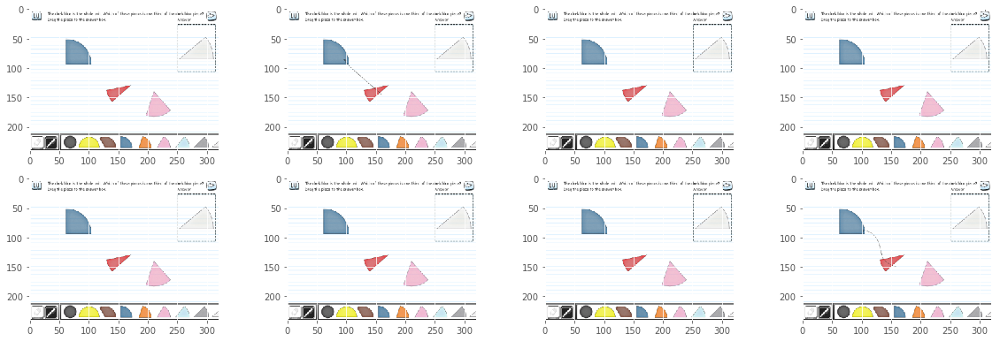

Cluster 4
                           _id behavioral_traits  bonus  correct      diff  \
5     5a00f1799100de1a39001c41                []  False    False  0.781695   
2741  5a0118b99100de1a399e986d                []  False    False  0.781695   
2172  5a01131b9100de1a39882196                []  False    False  0.781695   
27    5a00f1c39100de1a39014ce0                []  False    False  0.781695   
503   5a00f7cf9100de1a391ad1d4                []  False    False  0.781695   
2498  5a0116979100de1a39960dfa                []  False    False  0.781695   
2116  5a0111399100de1a3980aa6b                []  False    False  0.781695   
888   5a00fe4a9100de1a3934f798                []  False    False  0.781695   
203   5a00f3e69100de1a3909ef04                []  False    False  0.781695   
1488  5a0106449100de1a395517da                []  False    False  0.781695   

              id  incomplete           lesson  \
5     75ayW9Wz4k       False  name_fract_1_v2   
2741  75ayW9Wz4k       False  nam

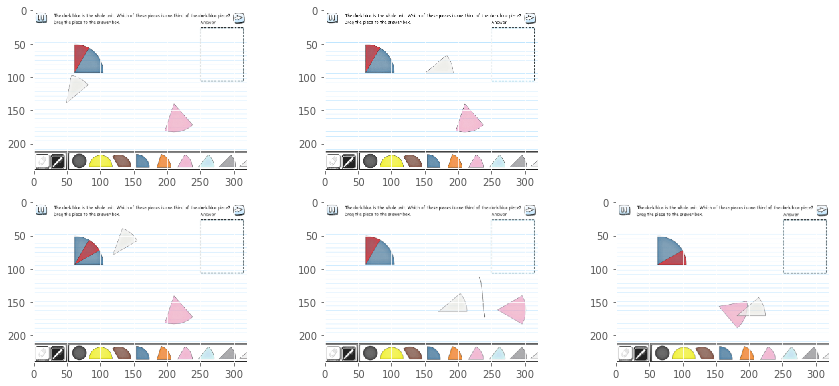

Analysis 16 for qual_id kvig7fcCVc.partb.ZKOrrM1K8G with 14700 samples
Session 0 txt  Arrange these fractions from least to greatest.
Drag each fraction into one of the boxes below.
Answer: 1/12,1/6,1/4
Extracting tf-idf features ...
done in 0.309s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.047s
qual_id kvig7fcCVc.partb.ZKOrrM1K8G has these clusters
8    920
9    576
1    154
4     23
Name: cluster, dtype: int64
Distances (1673, 10) [[  2.58095683e-08   1.00000000e+00   2.78775199e-08 ...,   1.43354236e-01
    0.00000000e+00   1.36157443e-01]
 [  1.00000000e+00   0.00000000e+00   1.00000000e+00 ...,   9.77684223e-01
    1.00000000e+00   1.00000000e+00]
 [  2.58095683e-08   1.00000000e+00   2.78775199e-08 ...,   1.43354236e-01
    0.00000000e+00   1.36157443e-01]
 ..., 


/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                          _id behavioral_traits  bonus  correct     diff  \
0    5a00f1799100de1a39001ed0                []  False    False  0.36144   
676  5a00ff469100de1a3938f54c                []  False    False  0.36144   
677  5a00ff509100de1a39391ec7                []  False    False  0.36144   
678  5a00ff509100de1a39391f52                []  False    False  0.36144   
680  5a00ff579100de1a39393831                []  False    False  0.36144   
681  5a00ff589100de1a39393ced                []  False    False  0.36144   
682  5a00ff589100de1a39393cee                []  False    False  0.36144   
683  5a00ff6c9100de1a39398dae                []  False    False  0.36144   
684  5a00ff6c9100de1a39398f8c                []  False    False  0.36144   
685  5a00ff6d9100de1a39399093                []  False    False  0.36144   

             id  incomplete            lesson  \
0    ZKOrrM1K8G       False   review_lesson_1   
676  ZKOrrM1K8G       False    adv_ordering_2   
677  ZKOrrM1K8G 

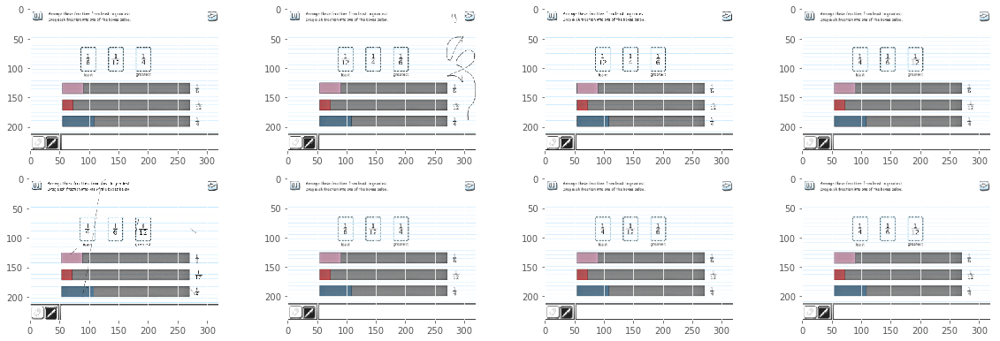

Cluster 9
                           _id behavioral_traits  bonus  correct     diff  \
815   5a0102269100de1a39448e9c                []  False    False  0.36144   
1432  5a0113239100de1a3988408f                []  False    False  0.36144   
1434  5a0113489100de1a3988d489                []  False    False  0.36144   
1435  5a0113489100de1a3988d48a                []  False    False  0.36144   
1437  5a01135c9100de1a39892225                []  False    False  0.36144   
1438  5a01135c9100de1a39892226                []  False    False  0.36144   
1439  5a0113659100de1a3989454d                []  False    False  0.36144   
1431  5a0113239100de1a3988408e                []  False    False  0.36144   
1441  5a0113829100de1a3989b7a8                []  False    False  0.36144   
1449  5a0113b19100de1a398a748a                []  False    False  0.36144   

              id  incomplete            lesson  \
815   ZKOrrM1K8G       False    adv_ordering_2   
1432  ZKOrrM1K8G       False  basic_orderi

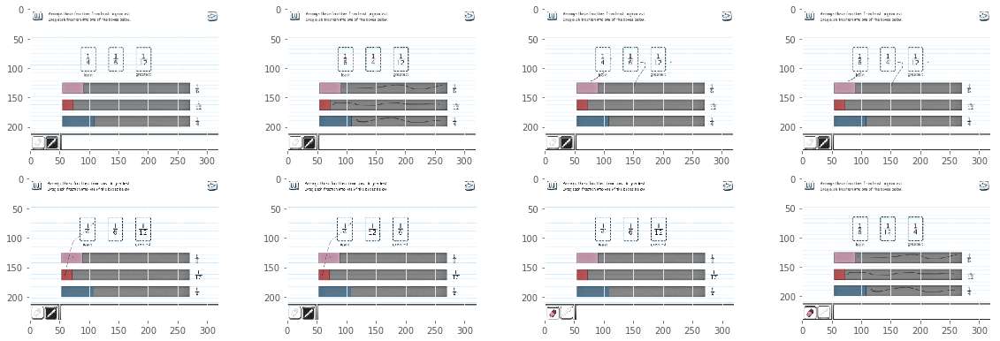

Cluster 1
                           _id behavioral_traits  bonus  correct     diff  \
1     5a00f19a9100de1a3900a8ec                []  False    False  0.36144   
1127  5a010a6e9100de1a3965a4dc                []  False    False  0.36144   
1151  5a010b629100de1a39696506                []  False    False  0.36144   
1162  5a010bb09100de1a396a96dd                []  False    False  0.36144   
1166  5a010bd79100de1a396b3530                []  False    False  0.36144   
1178  5a010c329100de1a396c9c24                []  False    False  0.36144   
1200  5a010ccf9100de1a396f0e2c                []  False    False  0.36144   
1217  5a010d7e9100de1a3971bc10                []  False    False  0.36144   
1223  5a010db49100de1a39728fab                []  False    False  0.36144   
1231  5a010e009100de1a3973c480                []  False    False  0.36144   

              id  incomplete            lesson  \
1     ZKOrrM1K8G       False  basic_ordering_1   
1127  ZKOrrM1K8G       False   review_less

Cluster 4
                           _id behavioral_traits  bonus  correct     diff  \
36    5a00f2049100de1a3902514c                []  False    False  0.36144   
1240  5a010e4e9100de1a397502d1                []  False    False  0.36144   
972   5a0106389100de1a3954e661                []  False    False  0.36144   
522   5a00fc5c9100de1a392d324e                []  False    False  0.36144   
521   5a00fc5c9100de1a392d324d                []  False    False  0.36144   
896   5a0104129100de1a394c51c0                []  False    False  0.36144   
101   5a00f3279100de1a3906e740                []  False    False  0.36144   
100   5a00f3279100de1a3906e73f                []  False    False  0.36144   
376   5a00f8839100de1a391dba9f                []  False    False  0.36144   
1032  5a0107fa9100de1a395bdb52                []  False    False  0.36144   

              id  incomplete            lesson  \
36    ZKOrrM1K8G       False   review_lesson_1   
1240  ZKOrrM1K8G       False  basic_orderi

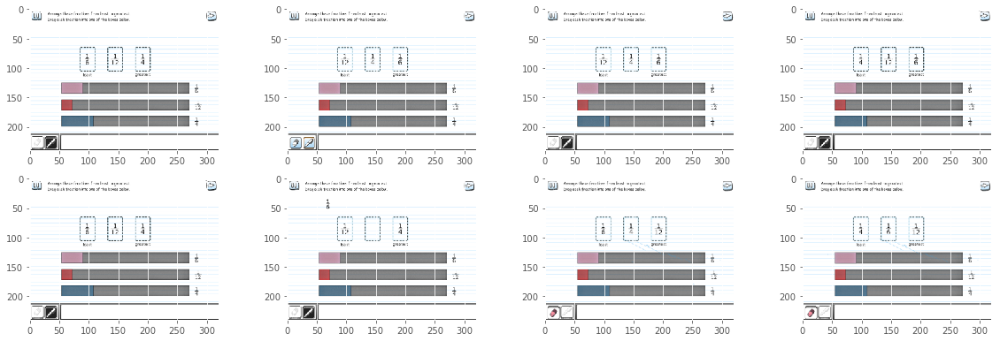

Analysis 17 for qual_id kvig7fcCVc.partb.eZe6HdH_r_ with 14496 samples
Session 0 txt  Arrange these fractions from least to greatest.
Drag each fraction into one of the boxes below.
Answer: 1/8,1/6,1/4
Extracting tf-idf features ...
done in 0.430s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.048s
qual_id kvig7fcCVc.partb.eZe6HdH_r_ has these clusters
3    1409
0     946
1     194
4       6
9       5
5       4
7       2
8       2
6       2
2       2
Name: cluster, dtype: int64
Distances (2572, 10) [[ 1.          0.          1.         ...,  1.          1.          0.99948674]
 [ 0.13531069  1.          1.08539368 ...,  1.08539368  1.08615696
   1.06994542]
 [ 0.13531069  1.          1.08539368 ...,  1.08539368  1.08615696
   1.06994542]
 ..., 
 [ 1.          0.          1.

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



                           _id behavioral_traits  bonus  correct  diff  \
1     5a00f1829100de1a39004300                []  False    False     0   
1030  5a00ff089100de1a3937fb02                []  False    False     0   
1027  5a00fee29100de1a39376437                []  False    False     0   
1026  5a00fee29100de1a39376436                []  False    False     0   
1025  5a00feda9100de1a393744d8                []  False    False     0   
1024  5a00feda9100de1a3937449f                []  False    False     0   
1023  5a00fed49100de1a39372977                []  False    False     0   
1022  5a00fece9100de1a393710b9                []  False    False     0   
1021  5a00fece9100de1a393710b8                []  False    False     0   
1031  5a00ff089100de1a3937fb21                []  False    False     0   

              id  incomplete            lesson  \
1     eZe6HdH_r_       False    adv_ordering_2   
1030  eZe6HdH_r_       False    adv_ordering_2   
1027  eZe6HdH_r_       False  basi

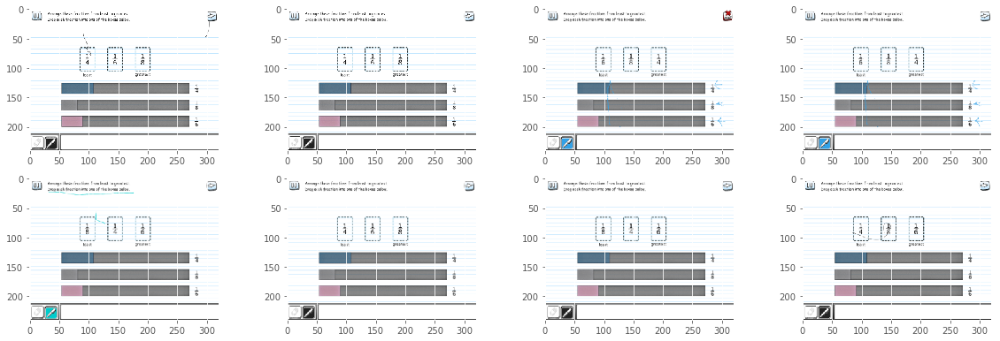

Cluster 0
                           _id behavioral_traits  bonus  correct  diff  \
1237  5a0101e89100de1a39438c20                []  False    False     0   
2213  5a0113be9100de1a398aa769                []  False    False     0   
2214  5a0113be9100de1a398aa76a                []  False    False     0   
2216  5a0113cb9100de1a398ada13                []  False    False     0   
2217  5a0113cb9100de1a398ada14                []  False    False     0   
2218  5a0113d19100de1a398af57f                []  False    False     0   
2219  5a0113e29100de1a398b3b8a                []  False    False     0   
2223  5a0114149100de1a398c0221                []  False    False     0   
2224  5a0114259100de1a398c4580                []  False    False     0   
2225  5a01142b9100de1a398c5d5c                []  False    False     0   

              id  incomplete            lesson  \
1237  eZe6HdH_r_       False  basic_ordering_1   
2213  eZe6HdH_r_       False  basic_ordering_1   
2214  eZe6HdH_r_       Fa

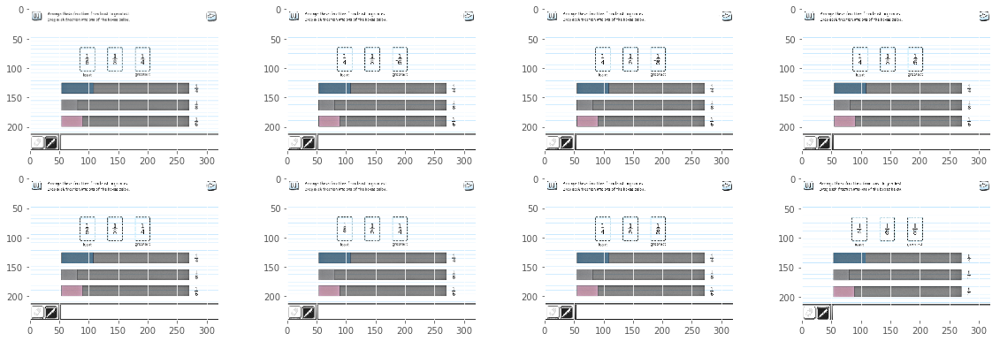

Cluster 1
                           _id behavioral_traits  bonus  correct  diff  \
0     5a00f17b9100de1a390026cd                []  False    False     0   
1707  5a010a009100de1a3963e6eb                []  False    False     0   
1711  5a010a159100de1a39643a80                []  False    False     0   
1716  5a010a339100de1a3964b55b                []  False    False     0   
1722  5a010a6b9100de1a3965971f                []  False    False     0   
1723  5a010a739100de1a3965b8ff                []  False    False     0   
1752  5a010b079100de1a3967ff2d                []  False    False     0   
1763  5a010b249100de1a3968709f                []  False    False     0   
1780  5a010b629100de1a39696505                []  False    False     0   
1802  5a010bd79100de1a396b352f                []  False    False     0   

              id  incomplete            lesson  \
0     eZe6HdH_r_       False   review_lesson_1   
1707  eZe6HdH_r_       False    adv_ordering_2   
1711  eZe6HdH_r_       Fa

Cluster 4
                           _id behavioral_traits  bonus  correct  diff  \
931   5a00fd1b9100de1a393037e0                []  False    False     0   
1256  5a01022c9100de1a3944a507                []  False    False     0   
1257  5a01022c9100de1a3944a508                []  False    False     0   
1264  5a0102359100de1a3944c927                []  False    False     0   
1501  5a01062b9100de1a3954b0ad                []  False    False     0   
1317  5a0102e99100de1a3947a730                []  False    False     0   

              id  incomplete           lesson  \
931   eZe6HdH_r_       False   adv_ordering_2   
1256  eZe6HdH_r_       False   adv_ordering_2   
1257  eZe6HdH_r_       False   adv_ordering_2   
1264  eZe6HdH_r_       False   adv_ordering_2   
1501  eZe6HdH_r_       False  review_lesson_1   
1317  eZe6HdH_r_       False  review_lesson_1   

                                          level_summary  \
931   {'mastery': {'mean': 0.09975152633171677, 'std...   
1256  {'t

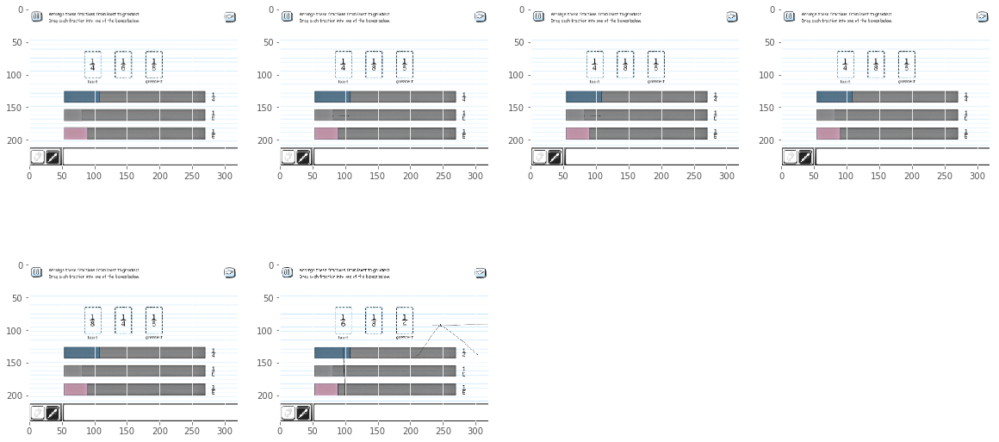

Analysis 18 for qual_id pD_1459mfy.partb.aL_Gvm9q0h with 14183 samples
Session 0 txt  Model a fraction that is equal to 1 using fifths.
Answer: 5
Extracting tf-idf features ...
done in 0.077s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.033s
qual_id pD_1459mfy.partb.aL_Gvm9q0h has these clusters
9    119
8    106
1     81
6     71
4     62
7     28
0     27
5     15
2     14
3      7
Name: cluster, dtype: int64
Distances (530, 10) [[ 0.55476377  0.9958624   0.48504825 ...,  0.60836281  0.54348308
   0.42581504]
 [ 0.44785377  0.99572319  0.46955564 ...,  0.47152605  0.34252362
   0.27770325]
 [ 0.50039489  0.99590679  0.50190047 ...,  0.55629804  0.34946162
   0.42357514]
 ..., 
 [ 0.86251813  0.00948568  0.98689017 ...,  0.91129714  0.95771423
   0.925711  ]
 [ 0.4365989

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                          _id behavioral_traits  bonus  correct      diff  \
302  5a0102fa9100de1a3947eb91                []  False    False  0.459712   
218  5a00fddc9100de1a39334339                []  False    False  0.459712   
223  5a00fe329100de1a393499cb                []  False    False  0.459712   
110  5a00f7329100de1a39181baf                []  False    False  0.459712   
160  5a00f9c79100de1a3922d77e                []  False    False  0.459712   
91   5a00f6629100de1a39145a9e                []  False    False  0.459712   
177  5a00fb039100de1a3927d287                []  False    False  0.459712   
275  5a0101219100de1a394063c0                []  False    False  0.459712   
76   5a00f5ba9100de1a39118409                []  False    False  0.459712   
72   5a00f5799100de1a39105037                []  False    False  0.459712   

             id  incomplete           lesson  \
302  aL_Gvm9q0h       False    equivalence_2   
218  aL_Gvm9q0h       False  review_lesson_1   
223  aL_

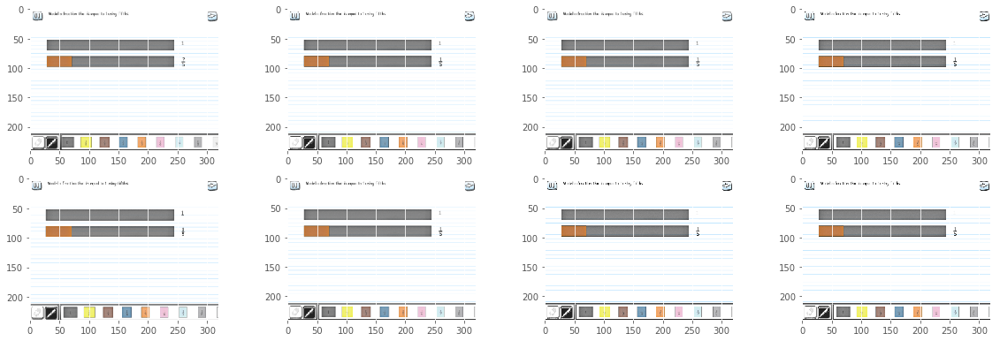

Cluster 8
                          _id behavioral_traits  bonus  correct      diff  \
5    5a00f22e9100de1a39030107                []  False    False  0.459712   
25   5a00f2eb9100de1a3905f7aa                []  False    False  0.459712   
433  5a0110ba9100de1a397ea94d                []  False    False  0.459712   
16   5a00f2829100de1a39044d1d                []  False    False  0.459712   
236  5a00ff0b9100de1a39380a3b                []  False    False  0.459712   
29   5a00f3089100de1a39066a99                []  False    False  0.459712   
220  5a00fdef9100de1a393390f8                []  False    False  0.459712   
261  5a0100699100de1a393d7cd2                []  False    False  0.459712   
397  5a010cd49100de1a396f1ecc                []  False    False  0.459712   
491  5a0115db9100de1a39931f3d                []  False    False  0.459712   

             id  incomplete         lesson  \
5    aL_Gvm9q0h       False  equivalence_2   
25   aL_Gvm9q0h       False  equivalence_2   
433 

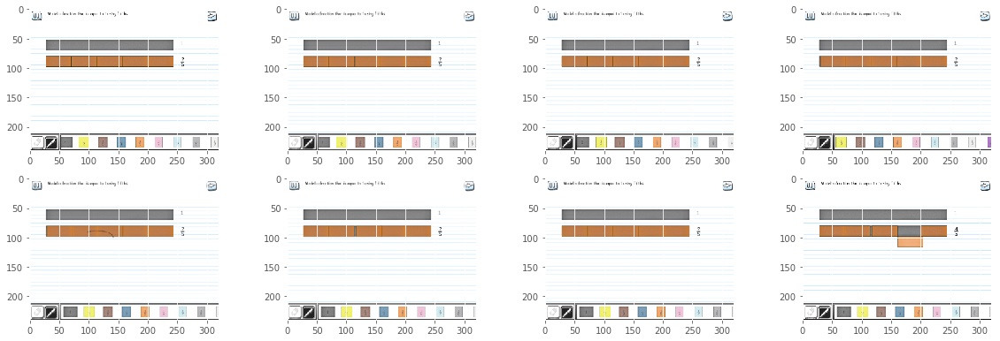

Cluster 1
                          _id behavioral_traits  bonus  correct      diff  \
3    5a00f1cb9100de1a39016edd                []  False    False  0.459712   
374  5a010a499100de1a39650ced                []  False    False  0.459712   
373  5a010a479100de1a396505c7                []  False    False  0.459712   
363  5a0109589100de1a39614500                []  False    False  0.459712   
357  5a0108c69100de1a395f05d6                []  False    False  0.459712   
356  5a0108969100de1a395e4af6                []  False    False  0.459712   
347  5a0108159100de1a395c442d                []  False    False  0.459712   
334  5a01063e9100de1a3954fdb8                []  False    False  0.459712   
381  5a010b2e9100de1a39689880                []  False    False  0.459712   
333  5a0105c59100de1a39531df5                []  False    False  0.459712   

             id  incomplete           lesson  \
3    aL_Gvm9q0h       False    equivalence_2   
374  aL_Gvm9q0h       False    equivalence_2  

Cluster 6
                          _id behavioral_traits  bonus  correct      diff  \
262  5a0100679100de1a393d7706                []  False    False  0.459712   
285  5a01018a9100de1a39420d2b                []  False    False  0.459712   
167  5a00fa389100de1a3924a6e3                []  False    False  0.459712   
354  5a0108929100de1a395e3b38                []  False    False  0.459712   
315  5a0104879100de1a394e2aec                []  False    False  0.459712   
495  5a01174e9100de1a3998e6c3                []  False    False  0.459712   
489  5a0115ac9100de1a399263a3                []  False    False  0.459712   
461  5a0112ca9100de1a3986de66                []  False    False  0.459712   
379  5a010b299100de1a39688556                []  False    False  0.459712   
114  5a00f7909100de1a3919bc3f                []  False    False  0.459712   

             id  incomplete           lesson  \
262  aL_Gvm9q0h       False    equivalence_2   
285  aL_Gvm9q0h       False    equivalence_2  

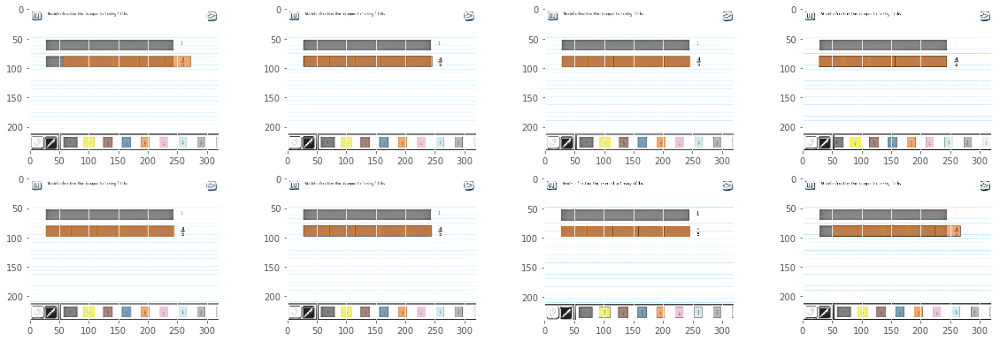

Analysis 19 for qual_id pD_1459mfy.partb.v9XdqzVk22 with 13823 samples
Session 0 txt  Model a fraction that is equal to 1 using sixths.
Answer: 6
Extracting tf-idf features ...
done in 0.088s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.037s
qual_id pD_1459mfy.partb.v9XdqzVk22 has these clusters
1    177
2     68
9     64
5     60
7     59
6     32
4     18
3      9
0      8
8      1
Name: cluster, dtype: int64
Distances (496, 10) [[ 0.76203017  0.30752007  0.99446924 ...,  0.18093422  0.96960039
   0.35388038]
 [ 0.73460494  0.24344245  0.99437121 ...,  0.32737779  0.97528018
   0.31108834]
 [ 0.73302305  0.22768364  0.9943681  ...,  0.3182556   0.97332188
   0.30558084]
 ..., 
 [ 0.76278682  0.27172118  0.99467076 ...,  0.3951898   0.9729462
   0.38990885]
 [ 0.77189784

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


 1
                          _id behavioral_traits  bonus  correct      diff  \
171  5a00fcd39100de1a392f0d03                []  False    False  0.654373   
172  5a00fcd39100de1a392f0d04                []  False    False  0.654373   
412  5a0112059100de1a3983d2d1                []  False    False  0.654373   
469  5a0117509100de1a3998f0d8                []  False    False  0.654373   
74   5a00f64b9100de1a3913fe4a                []  False    False  0.654373   
122  5a00f9809100de1a3921bd43                []  False    False  0.654373   
386  5a0110309100de1a397c83bf                []  False    False  0.654373   
427  5a0112d19100de1a3986fc4b                []  False    False  0.654373   
435  5a0113c59100de1a398ac452                []  False    False  0.654373   
344  5a010b059100de1a3967fa1c                []  False    False  0.654373   

             id  incomplete           lesson  \
171  v9XdqzVk22       False    equivalence_2   
172  v9XdqzVk22       False    equivalence_2   
412  

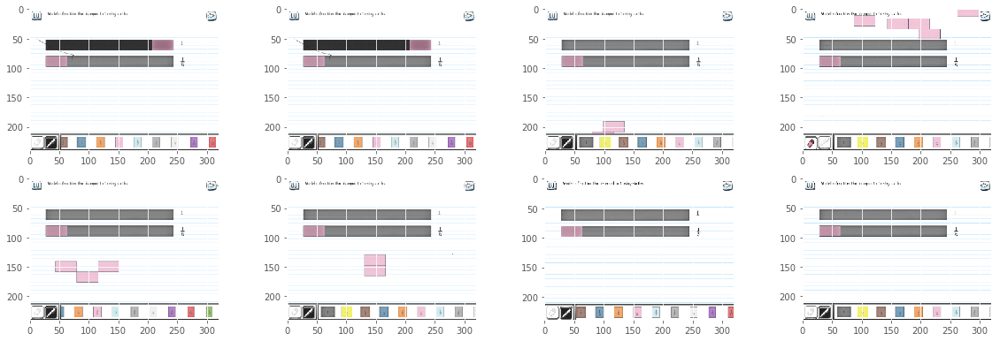

Cluster 2
                          _id behavioral_traits  bonus  correct      diff  \
7    5a00f1cb9100de1a39016ede                []  False    False  0.654373   
275  5a01045b9100de1a394d73db                []  False    False  0.654373   
277  5a0104659100de1a394d9f20                []  False    False  0.654373   
285  5a0104bb9100de1a394efc6b                []  False    False  0.654373   
289  5a0105029100de1a39501b0f                []  False    False  0.654373   
291  5a0105149100de1a3950619f                []  False    False  0.654373   
292  5a0105229100de1a39509aad                []  False    False  0.654373   
298  5a0105c59100de1a39531df6                []  False    False  0.654373   
301  5a0106269100de1a39549fc1                []  False    False  0.654373   
319  5a0108159100de1a395c442c                []  False    False  0.654373   

             id  incomplete           lesson  \
7    v9XdqzVk22       False    equivalence_2   
275  v9XdqzVk22       False    equivalence_2  

Cluster 9
                          _id behavioral_traits  bonus  correct      diff  \
413  5a0112359100de1a398489a7                []  False    False  0.654373   
408  5a0111869100de1a3981dc8b                []  False    False  0.654373   
102  5a00f87c9100de1a391d9e32                []  False    False  0.654373   
322  5a01087e9100de1a395debb7                []  False    False  0.654373   
379  5a010f6d9100de1a3979756b                []  False    False  0.654373   
112  5a00f91d9100de1a39202bdb                []  False    False  0.654373   
321  5a01087e9100de1a395debb6                []  False    False  0.654373   
369  5a010e439100de1a3974d7b4                []  False    False  0.654373   
227  5a00ffc79100de1a393afc8f                []  False    False  0.654373   
6    5a00f1b29100de1a390108c4                []  False    False  0.654373   

             id  incomplete           lesson  \
413  v9XdqzVk22       False    equivalence_2   
408  v9XdqzVk22       False  review_lesson_1  

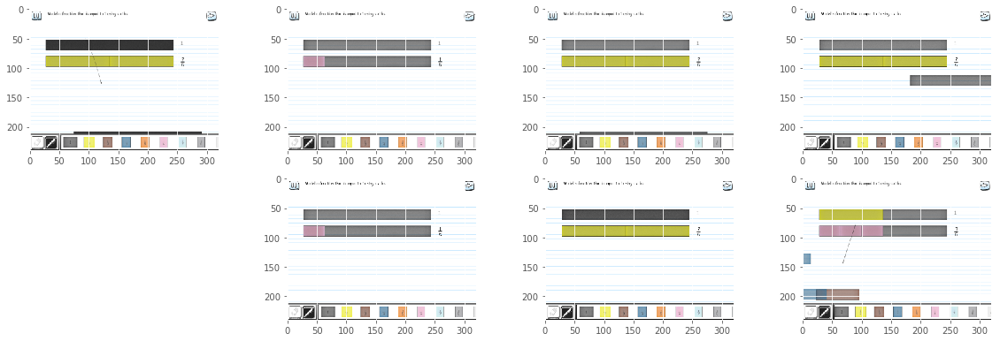

Cluster 5
                          _id behavioral_traits  bonus  correct      diff  \
13   5a00f23a9100de1a39032e5f                []  False    False  0.654373   
240  5a0101289100de1a39408001                []  False    False  0.654373   
358  5a010cd09100de1a396f1096                []  False    False  0.654373   
29   5a00f3689100de1a3907f0dc                []  False    False  0.654373   
178  5a00fd219100de1a3930507b                []  False    False  0.654373   
198  5a00fe459100de1a3934e5d6                []  False    False  0.654373   
196  5a00fe1a9100de1a39343ab2                []  False    False  0.654373   
109  5a00f8d59100de1a391f0421                []  False    False  0.654373   
51   5a00f5249100de1a390ee2d5                []  False    False  0.654373   
50   5a00f5239100de1a390ede8c                []  False    False  0.654373   

             id  incomplete           lesson  \
13   v9XdqzVk22       False    equivalence_2   
240  v9XdqzVk22       False    equivalence_2  

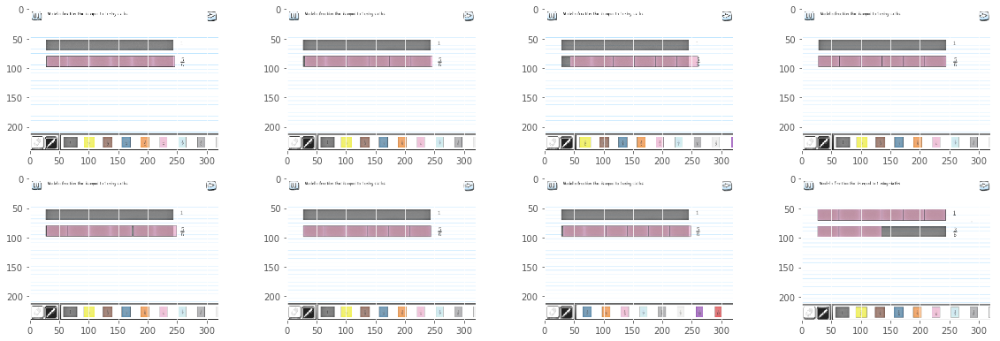

Analysis 20 for qual_id _d1qnEqMYs.partb.TIL71Bb5gj with 13655 samples
Session 0 txt  Enter the number to create the equivalent fraction modeled.
Answer: 2
Extracting tf-idf features ...
done in 0.803s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.034s
qual_id _d1qnEqMYs.partb.TIL71Bb5gj has these clusters
0    2675
2    2116
8     452
1     278
7     225
3     108
4      56
9      48
5      39
6      27
Name: cluster, dtype: int64
Distances (6024, 10) [[ 0.05959453  0.97879215  0.41187866 ...,  0.47397474  0.24744762
   0.73882665]
 [ 0.05959453  0.97879215  0.41187866 ...,  0.47397474  0.24744762
   0.73882665]
 [ 0.05959453  0.97879215  0.41187866 ...,  0.47397474  0.24744762
   0.73882665]
 ..., 
 [ 0.83713559  0.97973257  0.81592846 ...,  0.80421551  0.8260853
   0.91

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
0     5a00f1769100de1a390010b5                []  False    False     0   
1577  5a00f9f99100de1a3923a6e9                []  False    False     0   
2762  5a0101859100de1a3941f8b6                []  False    False     0   
2764  5a0101899100de1a39420b9f                []  False    False     0   
2766  5a01018f9100de1a39422039                []  False    False     0   
1571  5a00f9f49100de1a39238fd9                []  False    False     0   
1570  5a00f9f39100de1a39238c42                []  False    False     0   
1568  5a00f9f39100de1a39238a0b                []  False    False     0   
2768  5a0101909100de1a394226be                []  False    False     0   
1565  5a00f9e99100de1a39235f41                []  False    False     0   

              id  incomplete           lesson  \
0     TIL71Bb5gj       False    equivalence_6   
1577  TIL71Bb5gj       False    equivalence_6   
2762  TIL71Bb5gj       False    equiva

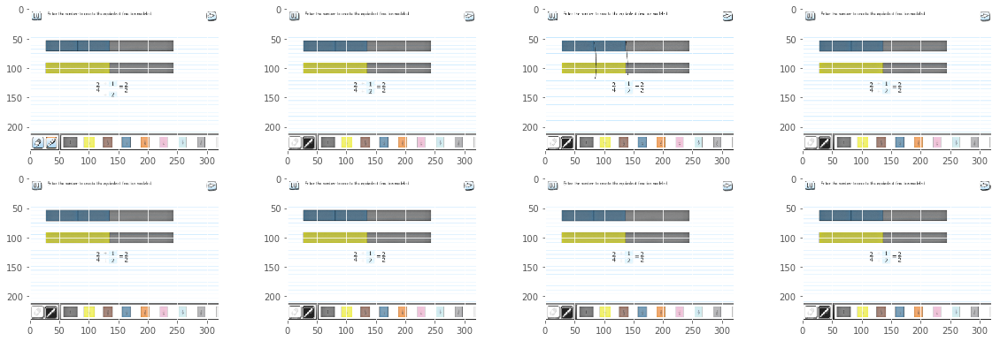

Cluster 2
                           _id behavioral_traits  bonus  correct  diff  \
2823  5a0101e39100de1a39437751                []  False    False     0   
4893  5a01119c9100de1a3982356b                []  False    False     0   
4892  5a01119c9100de1a3982356a                []  False    False     0   
4874  5a0111799100de1a3981a8fe                []  False    False     0   
4873  5a0111759100de1a39819937                []  False    False     0   
4870  5a0111739100de1a39818f98                []  False    False     0   
4868  5a0111679100de1a39816409                []  False    False     0   
4867  5a0111649100de1a39815454                []  False    False     0   
4863  5a0111639100de1a39815311                []  False    False     0   
4861  5a0111629100de1a39814c3e                []  False    False     0   

              id  incomplete         lesson  \
2823  TIL71Bb5gj       False  equivalence_6   
4893  TIL71Bb5gj       False  equivalence_6   
4892  TIL71Bb5gj       False  equi

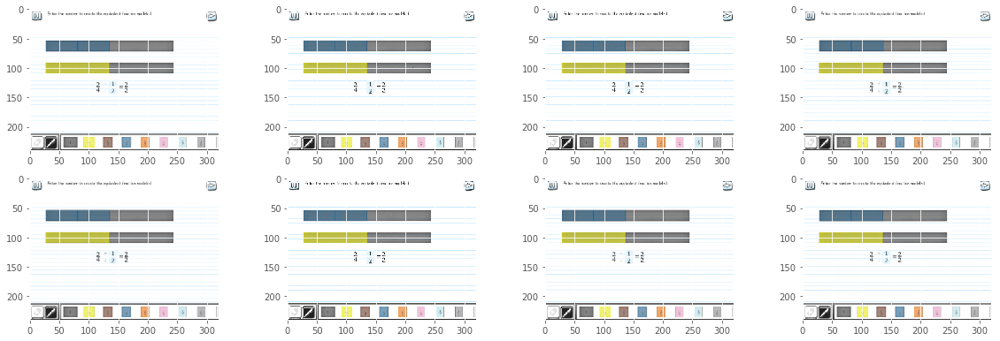

Cluster 8
                           _id behavioral_traits  bonus  correct  diff  \
9     5a00f18b9100de1a39006a16                []  False    False     0   
1789  5a00fb669100de1a39295a3c                []  False    False     0   
2806  5a0101c89100de1a394308b2                []  False    False     0   
2802  5a0101c79100de1a394307bc                []  False    False     0   
898   5a00f68b9100de1a39150579                []  False    False     0   
1781  5a00fb539100de1a39290e7b                []  False    False     0   
1779  5a00fb509100de1a39290450                []  False    False     0   
919   5a00f6a39100de1a391579f1                []  False    False     0   
2796  5a0101c29100de1a3942f274                []  False    False     0   
1776  5a00fb509100de1a39290448                []  False    False     0   

              id  incomplete         lesson  \
9     TIL71Bb5gj       False  equivalence_6   
1789  TIL71Bb5gj       False  equivalence_6   
2806  TIL71Bb5gj       False  equi

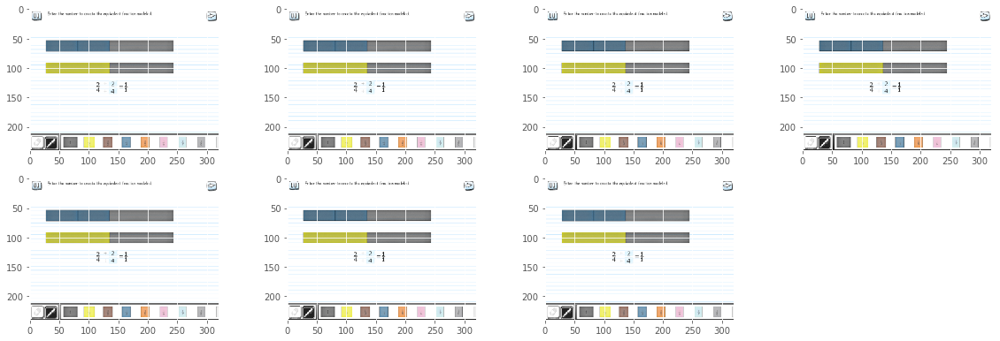

Cluster 1
                           _id behavioral_traits  bonus  correct  diff  \
15    5a00f19e9100de1a3900b752                []  False    False     0   
3587  5a0107449100de1a3959131d                []  False    False     0   
3597  5a01074d9100de1a3959375b                []  False    False     0   
3616  5a01077b9100de1a3959ea19                []  False    False     0   
3663  5a0107e09100de1a395b737a                []  False    False     0   
3667  5a0107e59100de1a395b88b8                []  False    False     0   
3720  5a01083b9100de1a395cdcf1                []  False    False     0   
3733  5a0108649100de1a395d83c5                []  False    False     0   
3773  5a0108b99100de1a395ed2f1                []  False    False     0   
3796  5a0109019100de1a395ff6b6                []  False    False     0   

              id  incomplete           lesson  \
15    TIL71Bb5gj        True    equivalence_6   
3587  TIL71Bb5gj        True    equivalence_6   
3597  TIL71Bb5gj        True

Analysis 21 for qual_id UlJYoQjOUR.partb.ER0z0eSNUG with 13516 samples
Session 0 txt  Model 2/3 of the black bar by dragging the one third pieces onto the black bar.
Answer: [object Object]
Extracting tf-idf features ...
done in 0.369s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.080s
qual_id UlJYoQjOUR.partb.ER0z0eSNUG has these clusters
4    528
3    448
6    438
1    347
0    257
2    228
9    205
5     73
8     73
7     41
Name: cluster, dtype: int64
Distances (2638, 10) [[ 0.64051243  0.41429182  0.96399529 ...,  0.91770297  0.69101116
   0.59664579]
 [ 0.60059157  0.4438493   0.96262457 ...,  0.89394359  0.66897543
   0.57363825]
 [ 0.48541086  0.5095873   0.96358429 ...,  0.91749719  0.48942271
   0.34207979]
 ..., 
 [ 0.60623846  0.4869249   0.96118937 ...,  0.898

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
930   5a00fdfa9100de1a3933baec                []  False    False     0   
825   5a00fbf79100de1a392ba346                []  False    False     0   
831   5a00fc099100de1a392be981                []  False    False     0   
838   5a00fc239100de1a392c50f4                []  False    False     0   
850   5a00fc529100de1a392d08de                []  False    False     0   
854   5a00fc589100de1a392d21ec                []  False    False     0   
2016  5a0113689100de1a398950ae                []  False    False     0   
862   5a00fc919100de1a392e023e                []  False    False     0   
869   5a00fcae9100de1a392e762d                []  False    False     0   
900   5a00fd3a9100de1a3930b612                []  False    False     0   

              id  incomplete             lesson  \
930   ER0z0eSNUG       False    review_lesson_1   
825   ER0z0eSNUG       False  model_symbol_3_v3   
831   ER0z0eSNUG       False  mo

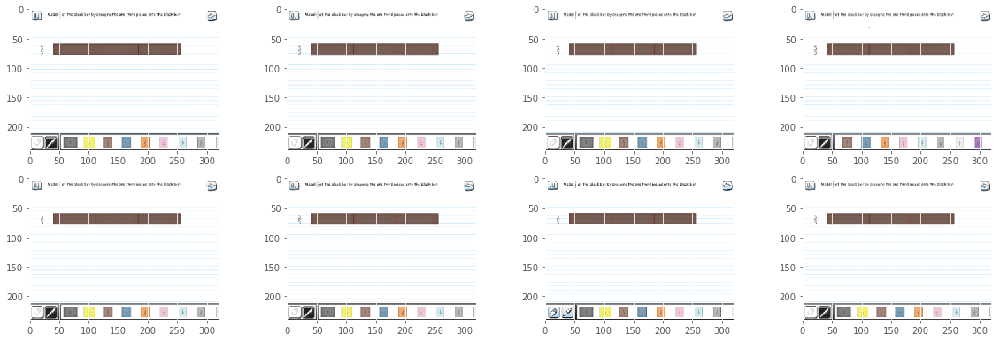

Cluster 3
                          _id behavioral_traits  bonus  correct  diff  \
15   5a00f1b49100de1a39010f71                []  False    False     0   
814  5a00fbd59100de1a392b21e8                []  False    False     0   
822  5a00fbf19100de1a392b8bc3                []  False    False     0   
824  5a00fbf79100de1a392ba345                []  False    False     0   
827  5a00fc029100de1a392bd003                []  False    False     0   
830  5a00fc059100de1a392bdda0                []  False    False     0   
837  5a00fc239100de1a392c50f3                []  False    False     0   
851  5a00fc529100de1a392d07fb                []  False    False     0   
855  5a00fc5f9100de1a392d3aee                []  False    False     0   
875  5a00fcd29100de1a392f0b00                []  False    False     0   

             id  incomplete             lesson  \
15   ER0z0eSNUG       False  model_symbol_3_v3   
814  ER0z0eSNUG       False  model_symbol_3_v3   
822  ER0z0eSNUG       False  model_s

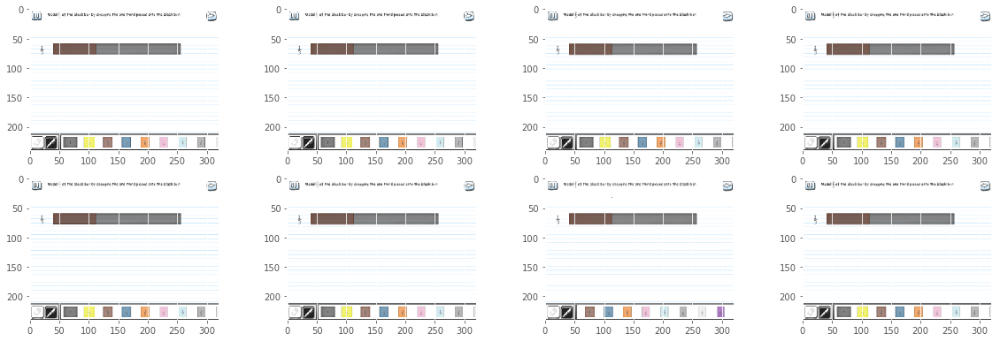

Cluster 6
                           _id behavioral_traits  bonus  correct  diff  \
1782  5a010d119100de1a39700eba                []  False    False     0   
2031  5a01140f9100de1a398bed34                []  False    False     0   
2544  5a0118c09100de1a399eb4f0                []  False    False     0   
1482  5a01071f9100de1a39587fd1                []  False    False     0   
2585  5a0119519100de1a39a10413                []  False    False     0   
1894  5a010f959100de1a397a0fe3                []  False    False     0   
1779  5a010d079100de1a396fe7c8                []  False    False     0   
2157  5a0115449100de1a3990be27                []  False    False     0   
1647  5a010a649100de1a39657b79                []  False    False     0   
2268  5a0116499100de1a3994d49b                []  False    False     0   

              id  incomplete             lesson  \
1782  ER0z0eSNUG       False  model_symbol_3_v3   
2031  ER0z0eSNUG       False  model_symbol_3_v3   
2544  ER0z0eSNUG      

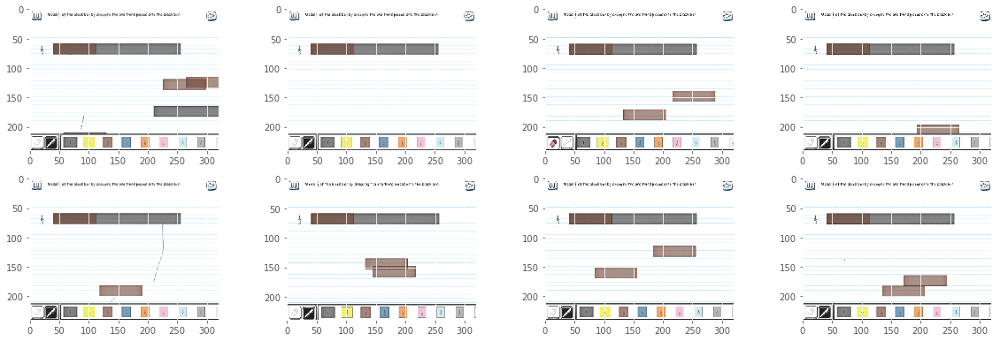

Cluster 1
                           _id behavioral_traits  bonus  correct  diff  \
224   5a00f3ca9100de1a39097dd5                []  False    False     0   
1993  5a0112819100de1a3985b833                []  False    False     0   
2184  5a0115839100de1a3991bd3f                []  False    False     0   
816   5a00fbd99100de1a392b30ed                []  False    False     0   
1992  5a0112819100de1a3985b832                []  False    False     0   
60    5a00f1f89100de1a390223b4                []  False    False     0   
1824  5a010e189100de1a39742910                []  False    False     0   
1556  5a0108f59100de1a395fc404                []  False    False     0   
2388  5a0117459100de1a3998c4b6                []  False    False     0   
2525  5a01188f9100de1a399df1aa                []  False    False     0   

              id  incomplete             lesson  \
224   ER0z0eSNUG       False  model_symbol_3_v3   
1993  ER0z0eSNUG       False  model_symbol_3_v3   
2184  ER0z0eSNUG      

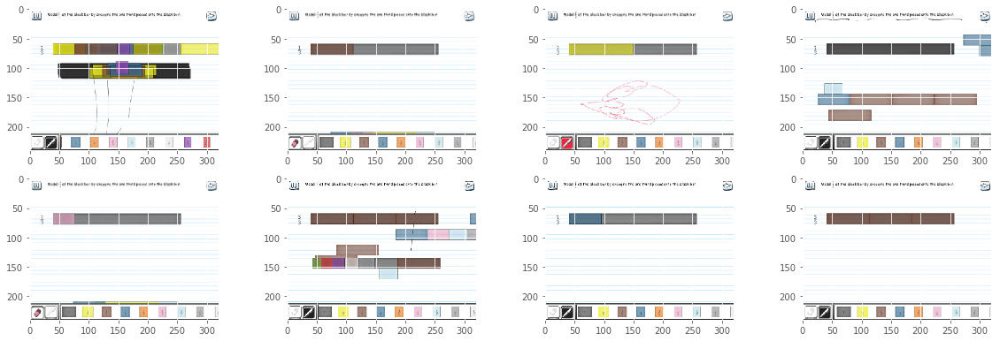

Analysis 22 for qual_id kvig7fcCVc.partb.GZo13HUAxn with 13372 samples
Session 0 txt  Arrange these fractions from least to greatest.
Drag each fraction into one of the boxes below.
Answer: 2/12,2/8,2/4
Extracting tf-idf features ...
done in 0.222s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.070s
qual_id kvig7fcCVc.partb.GZo13HUAxn has these clusters
0    501
3    372
1    106
2      6
5      4
7      2
4      2
9      1
8      1
6      1
Name: cluster, dtype: int64
Distances (996, 10) [[  2.10734243e-08   1.00000000e+00   9.57621910e-01 ...,   9.69129330e-01
    9.01869636e-01   9.19984208e-01]
 [  2.10734243e-08   1.00000000e+00   9.57621910e-01 ...,   9.69129330e-01
    9.01869636e-01   9.19984208e-01]
 [  2.10734243e-08   1.00000000e+00   9.57621910e-01 ...,   9.6912

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                          _id behavioral_traits  bonus  correct      diff  \
0    5a00f1729100de1a39000018                []  False    False  0.612244   
391  5a00ffc29100de1a393ae5d5                []  False    False  0.612244   
388  5a00ffa39100de1a393a6cc9                []  False    False  0.612244   
387  5a00ff979100de1a393a3a89                []  False    False  0.612244   
386  5a00ff989100de1a393a3f32                []  False    False  0.612244   
385  5a00ff719100de1a3939a50c                []  False    False  0.612244   
384  5a00ff719100de1a3939a408                []  False    False  0.612244   
382  5a00ff6c9100de1a39398f8b                []  False    False  0.612244   
381  5a00ff6c9100de1a39398f8a                []  False    False  0.612244   
380  5a00ff6c9100de1a39398daf                []  False    False  0.612244   

             id  incomplete            lesson  \
0    GZo13HUAxn       False  basic_ordering_1   
391  GZo13HUAxn       False  basic_ordering_1   
388  

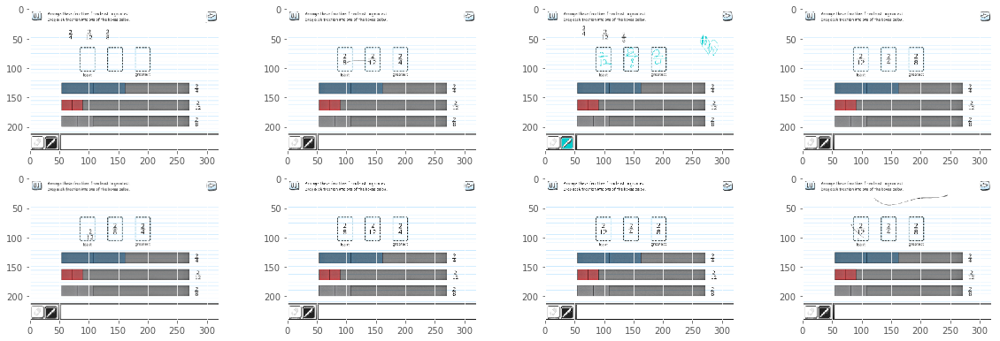

Cluster 3
                          _id behavioral_traits  bonus  correct      diff  \
461  5a0102149100de1a39444294                []  False    False  0.612244   
856  5a0114fd9100de1a398f9dea                []  False    False  0.612244   
855  5a0114fd9100de1a398f9de9                []  False    False  0.612244   
854  5a0114f39100de1a398f743f                []  False    False  0.612244   
853  5a0114e49100de1a398f3666                []  False    False  0.612244   
852  5a0114df9100de1a398f2420                []  False    False  0.612244   
851  5a0114df9100de1a398f241f                []  False    False  0.612244   
850  5a0114e09100de1a398f25cd                []  False    False  0.612244   
849  5a0114d99100de1a398f0b0f                []  False    False  0.612244   
848  5a0114d99100de1a398f0b0e                []  False    False  0.612244   

             id  incomplete            lesson  \
461  GZo13HUAxn       False  basic_ordering_1   
856  GZo13HUAxn       False  basic_ordering_

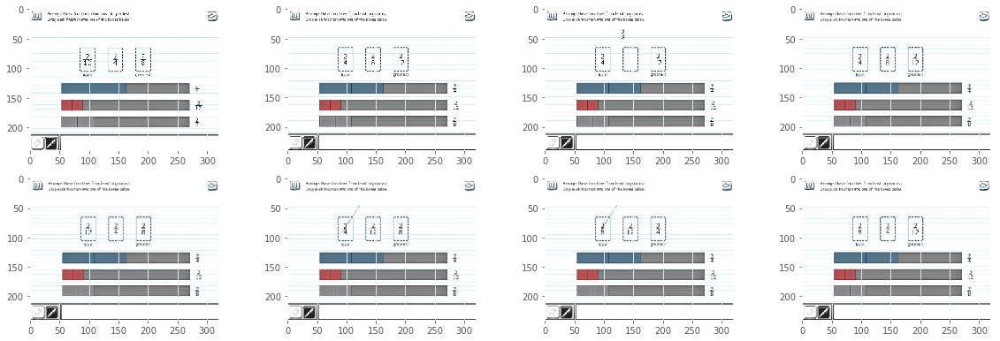

Cluster 1
                          _id behavioral_traits  bonus  correct      diff  \
4    5a00f19b9100de1a3900aabf                []  False    False  0.612244   
711  5a010edb9100de1a397734ba                []  False    False  0.612244   
705  5a010eba9100de1a3976ad7b                []  False    False  0.612244   
681  5a010d7c9100de1a3971b4ed                []  False    False  0.612244   
670  5a010ccf9100de1a396f0e2e                []  False    False  0.612244   
666  5a010c969100de1a396e2ac7                []  False    False  0.612244   
665  5a010c939100de1a396e1e4a                []  False    False  0.612244   
651  5a010bd79100de1a396b352d                []  False    False  0.612244   
643  5a010b629100de1a39696509                []  False    False  0.612244   
621  5a010a009100de1a3963e6ed                []  False    False  0.612244   

             id  incomplete            lesson  \
4    GZo13HUAxn       False  basic_ordering_1   
711  GZo13HUAxn       False  basic_ordering_

Cluster 2
                          _id behavioral_traits  bonus  correct      diff  \
68   5a00f3279100de1a3906e741                []  False    False  0.612244   
430  5a0100e69100de1a393f7079                []  False    False  0.612244   
431  5a0100e69100de1a393f707a                []  False    False  0.612244   
455  5a0101d79100de1a3943496c                []  False    False  0.612244   
540  5a01064d9100de1a39553e34                []  False    False  0.612244   
802  5a0112f69100de1a39878d8d                []  False    False  0.612244   

             id  incomplete            lesson  \
68   GZo13HUAxn       False  basic_ordering_1   
430  GZo13HUAxn       False  basic_ordering_1   
431  GZo13HUAxn       False  basic_ordering_1   
455  GZo13HUAxn       False  basic_ordering_1   
540  GZo13HUAxn       False  basic_ordering_1   
802  GZo13HUAxn       False  basic_ordering_1   

                                         level_summary  \
68   {'time_entered': 1475867151673.0, 'time_exi

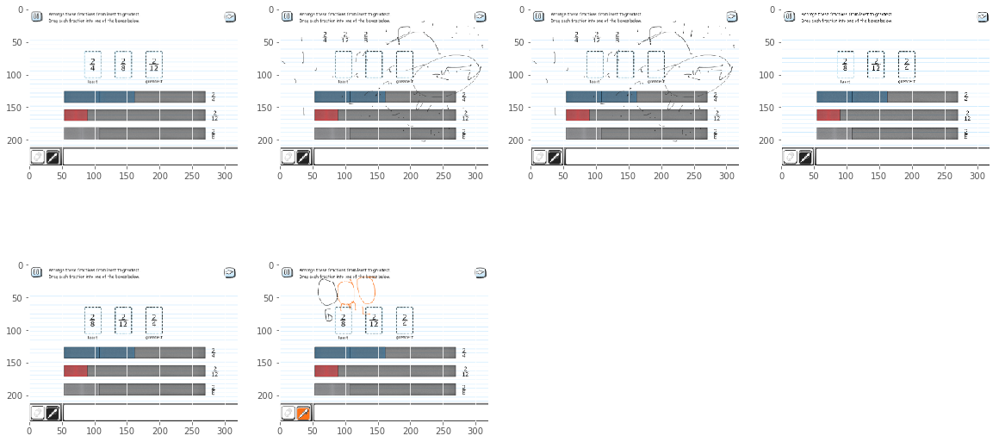

Analysis 23 for qual_id 9wRCzK1G7F.parta.NxWueNsFnx with 13226 samples
Session 0 txt  Which of these pieces is one half of the black circle?
Drag the piece to the answer box.
Answer: 1/2
Extracting tf-idf features ...
done in 0.361s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.091s
qual_id 9wRCzK1G7F.parta.NxWueNsFnx has these clusters
1    772
3    416
6    297
2    292
4    216
9    208
8    191
5    168
7    122
0     77
Name: cluster, dtype: int64
Distances (2759, 10) [[ 0.80950154  0.77732178  0.44715431 ...,  0.89393163  0.63432     0.52536347]
 [ 0.78034619  0.79935889  0.72028105 ...,  0.88071433  0.68320937
   0.57419757]
 [ 0.79609931  0.08949121  0.79193031 ...,  0.85996479  0.81003162
   0.45689189]
 ..., 
 [ 0.7948898   0.75580011  0.90524901 ...,  0.9445993 

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
2     5a00f1799100de1a39001af0                []  False    False     0   
2052  5a0114f19100de1a398f6cbf                []  False    False     0   
1043  5a01015e9100de1a3941594e                []  False    False     0   
2059  5a0114fe9100de1a398fa1df                []  False    False     0   
2061  5a0115019100de1a398fb243                []  False    False     0   
2066  5a0115039100de1a398fba59                []  False    False     0   
2069  5a0115049100de1a398fbadb                []  False    False     0   
2075  5a0115109100de1a398fee52                []  False    False     0   
991   5a0100af9100de1a393e9166                []  False    False     0   
956   5a01001f9100de1a393c5813                []  False    False     0   

              id  incomplete           lesson  \
2     NxWueNsFnx       False  name_fract_1_v2   
2052  NxWueNsFnx       False  name_fract_1_v2   
1043  NxWueNsFnx       False  review_l

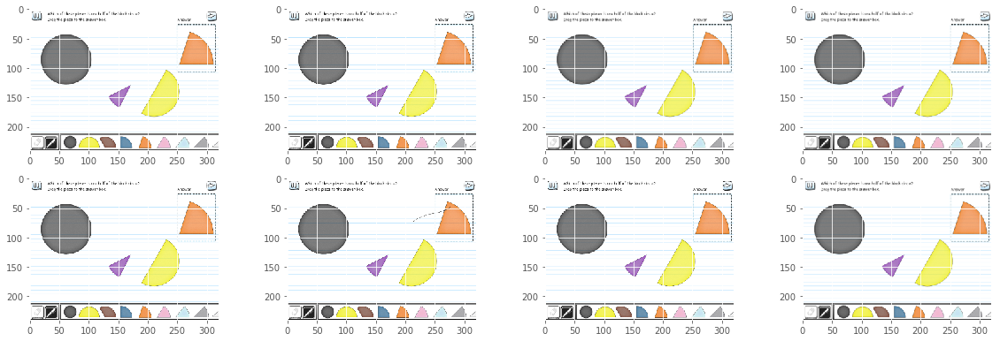

Cluster 3
                           _id behavioral_traits  bonus  correct  diff  \
9     5a00f1b19100de1a390103d3                []  False    False     0   
1441  5a0107dd9100de1a395b67c0                []  False    False     0   
1442  5a0107dd9100de1a395b69c6                []  False    False     0   
1454  5a0108409100de1a395cf29d                []  False    False     0   
1461  5a01085e9100de1a395d6c28                []  False    False     0   
1483  5a0108cc9100de1a395f214b                []  False    False     0   
1489  5a0108fb9100de1a395fdf15                []  False    False     0   
1535  5a0109ce9100de1a39631910                []  False    False     0   
1546  5a010a129100de1a39642e71                []  False    False     0   
1548  5a010a169100de1a39643e60                []  False    False     0   

              id  incomplete           lesson  \
9     NxWueNsFnx       False  name_fract_1_v2   
1441  NxWueNsFnx       False  name_fract_1_v2   
1442  NxWueNsFnx       False

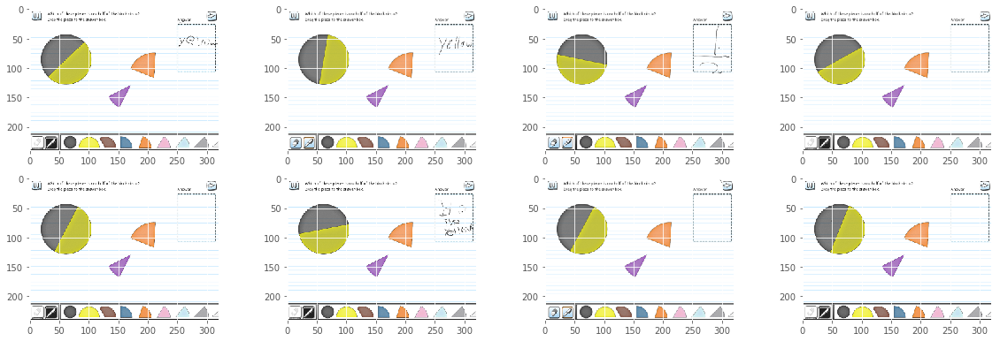

Cluster 6
                           _id behavioral_traits  bonus  correct  diff  \
2734  59d26ffad0cd262c1b008be0               NaN  False    False     0   
237   5a00f4e39100de1a390ddfb6                []  False    False     0   
153   5a00f3a19100de1a3908d487                []  False    False     0   
143   5a00f3809100de1a39085219                []  False    False     0   
478   5a00f8209100de1a391c2d9a                []  False    False     0   
1610  5a010b2b9100de1a39688ace                []  False    False     0   
2273  5a01167b9100de1a39959b93                []  False    False     0   
2138  5a01154c9100de1a3990e25f                []  False    False     0   
638   5a00fb609100de1a392941e4                []  False    False     0   
1329  5a0105a29100de1a3952954a                []  False    False     0   

              id  incomplete           lesson  \
2734  NxWueNsFnx       False  name_fract_1_v2   
237   NxWueNsFnx       False  name_fract_1_v2   
153   NxWueNsFnx       False

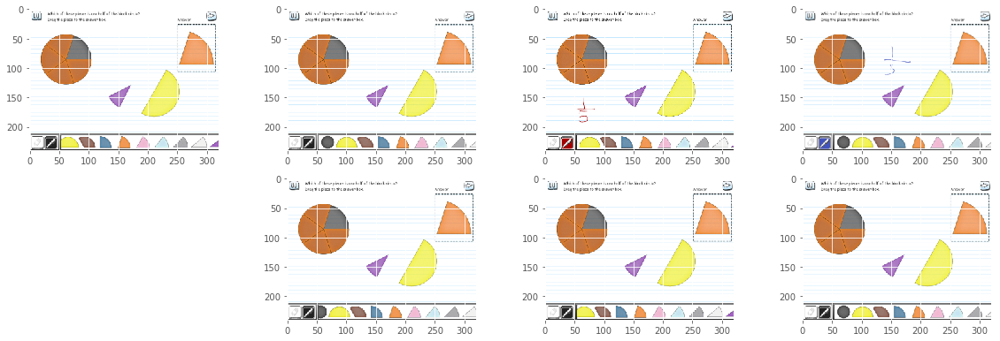

Cluster 2
                           _id behavioral_traits  bonus  correct  diff  \
158   5a00f3c19100de1a3909589c                []  False    False     0   
737   5a00fd3b9100de1a3930bbf4                []  False    False     0   
1289  5a0104b89100de1a394ef023                []  False    False     0   
740   5a00fd3c9100de1a3930beaa                []  False    False     0   
1655  5a010c059100de1a396bee2f                []  False    False     0   
2188  5a0115a49100de1a3992459a                []  False    False     0   
1958  5a0113809100de1a3989b18f                []  False    False     0   
465   5a00f7f09100de1a391b62e9                []  False    False     0   
2567  5a0118719100de1a399d7687                []  False    False     0   
2580  5a0118919100de1a399df6f6                []  False    False     0   

              id  incomplete           lesson  \
158   NxWueNsFnx       False  name_fract_1_v2   
737   NxWueNsFnx       False  name_fract_1_v2   
1289  NxWueNsFnx       False

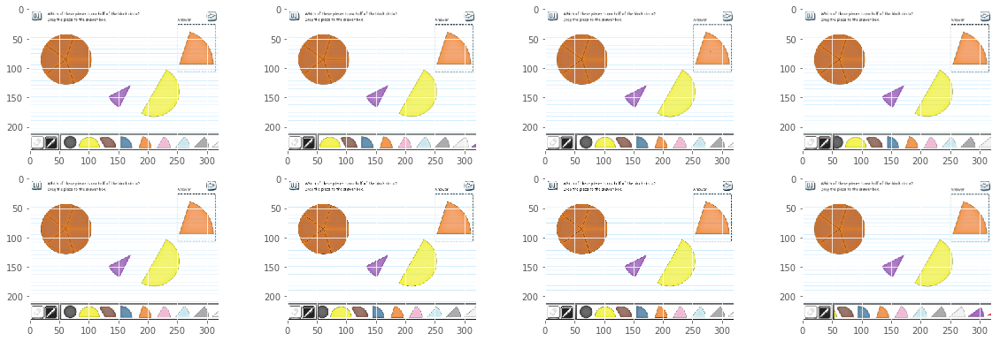

Analysis 24 for qual_id pD_1459mfy.partb.pMk-moD0f8 with 13224 samples
Session 0 txt  Model a fraction that is equal to 1 using eighths.
Answer: 8
Extracting tf-idf features ...
done in 0.274s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.119s
qual_id pD_1459mfy.partb.pMk-moD0f8 has these clusters
3    219
1    150
5     86
7     69
6     66
2     54
4     50
9     45
8     21
0     17
Name: cluster, dtype: int64
Distances (777, 10) [[ 0.97775215  0.51796342  1.34362728 ...,  0.76812104  1.29911262
   0.86468478]
 [ 1.06808369  0.77310199  1.35359255 ...,  0.84343206  1.29071945
   0.87872167]
 [ 1.26046264  1.28706693  1.35857267 ...,  1.24545498  0.1856461
   1.25961972]
 ..., 
 [ 1.01496036  0.47083768  1.35640995 ...,  0.69060577  1.29728317
   0.86731835]
 [ 1.2596966

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                          _id behavioral_traits  bonus  correct  diff  \
614  5a010e9e9100de1a39763f72                []  False    False     1   
631  5a010f769100de1a397998de                []  False    False     1   
630  5a010f739100de1a39798a25                []  False    False     1   
416  5a0102a39100de1a39468a2a                []  False    False     1   
625  5a010f0d9100de1a3977f3ab                []  False    False     1   
423  5a01031d9100de1a394878c0                []  False    False     1   
434  5a0103a59100de1a394a96dc                []  False    False     1   
164  5a00f7c69100de1a391aa43a                []  False    False     1   
577  5a010c6c9100de1a396d8321                []  False    False     1   
455  5a0105029100de1a39501b10                []  False    False     1   

             id  incomplete           lesson  \
614  pMk-moD0f8       False  review_lesson_1   
631  pMk-moD0f8       False    equivalence_2   
630  pMk-moD0f8       False    equivalence_2   
416 

Cluster 1
                          _id behavioral_traits  bonus  correct  diff  \
381  5a0101639100de1a39416d4f                []  False    False     1   
206  5a00f97e9100de1a3921b561                []  False    False     1   
304  5a00fe049100de1a3933e331                []  False    False     1   
236  5a00fb169100de1a39281dee                []  False    False     1   
518  5a0109079100de1a39600cca                []  False    False     1   
678  5a01125c9100de1a3985223d                []  False    False     1   
270  5a00fc5c9100de1a392d2fed                []  False    False     1   
356  5a0100ae9100de1a393e8ed3                []  False    False     1   
46   5a00f41e9100de1a390ad49e                []  False    False     1   
145  5a00f74d9100de1a3918882a                []  False    False     1   

             id  incomplete           lesson  \
381  pMk-moD0f8       False    equivalence_2   
206  pMk-moD0f8       False    equivalence_2   
304  pMk-moD0f8       False    equivalence

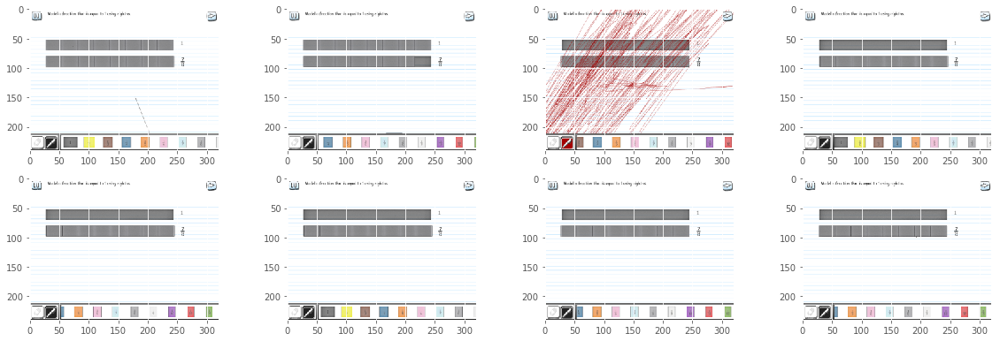

Cluster 5
                          _id behavioral_traits  bonus  correct  diff  \
218  5a00fa489100de1a3924e97c                []  False    False     1   
45   5a00f4069100de1a390a72af                []  False    False     1   
298  5a00fda39100de1a3932633d                []  False    False     1   
371  5a0101269100de1a3940779f                []  False    False     1   
42   5a00f3d89100de1a3909b386                []  False    False     1   
239  5a00fb209100de1a392847b5                []  False    False     1   
360  5a0100d49100de1a393f2578                []  False    False     1   
427  5a0103379100de1a3948ddb0                []  False    False     1   
643  5a010fda9100de1a397b2906                []  False    False     1   
300  5a00fddd9100de1a393347ab                []  False    False     1   

             id  incomplete           lesson  \
218  pMk-moD0f8       False    equivalence_2   
45   pMk-moD0f8       False    equivalence_2   
298  pMk-moD0f8       False  review_lesson

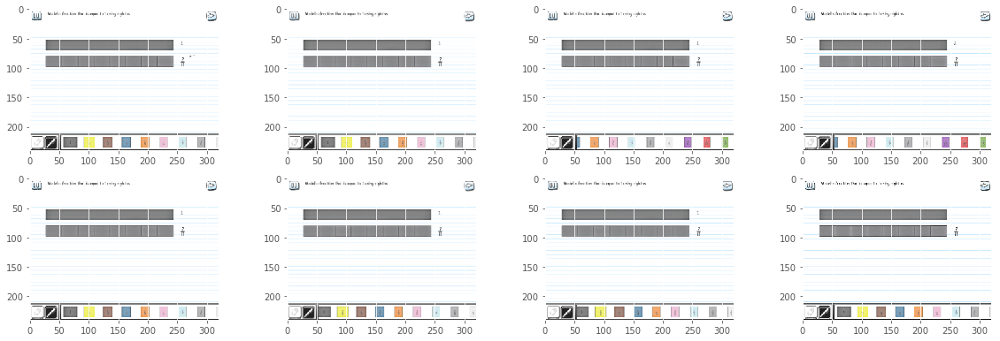

Cluster 7
                          _id behavioral_traits  bonus  correct  diff  \
723  5a0115fb9100de1a39939a4e                []  False    False     1   
609  5a010ded9100de1a39737469                []  False    False     1   
768  5a0119aa9100de1a39a25fe7                []  False    False     1   
576  5a010c5e9100de1a396d4bfc                []  False    False     1   
512  5a0108a79100de1a395e8e30                []  False    False     1   
642  5a010fcd9100de1a397af5c9                []  False    False     1   
598  5a010d799100de1a3971a729                []  False    False     1   
478  5a01064b9100de1a39553470                []  False    False     1   
293  5a00fd8f9100de1a3932105c                []  False    False     1   
500  5a01081b9100de1a395c5eaf                []  False    False     1   

             id  incomplete           lesson  \
723  pMk-moD0f8       False    equivalence_2   
609  pMk-moD0f8       False    equivalence_2   
768  pMk-moD0f8       False    equivalence

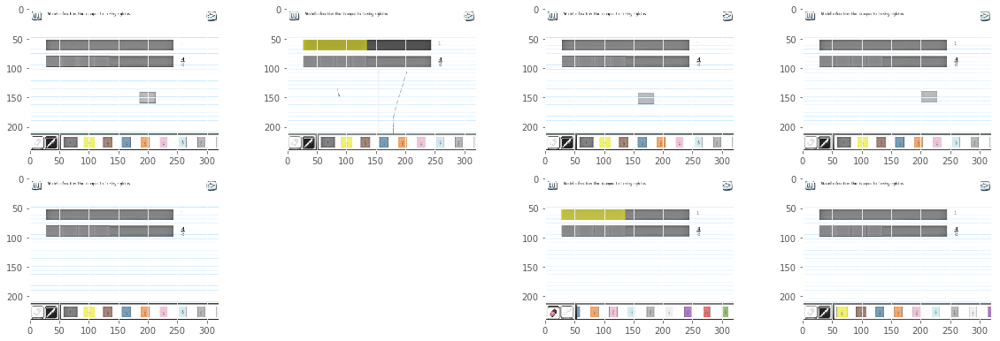

Analysis 25 for qual_id FmeMEBRHmB.bonus.24M2DNktUG with 13162 samples
Session 0 txt  What fraction of the rectangle is shaded?
Answer: 3
Extracting tf-idf features ...
done in 0.109s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.022s
qual_id FmeMEBRHmB.bonus.24M2DNktUG has these clusters
1    3748
2    2838
0     590
9     214
6     136
5     126
3     121
4      75
7      36
8      35
Name: cluster, dtype: int64
Distances (7919, 10) [[ 1.41421356  1.41421356  0.         ...,  1.41421356  1.41421356
   1.03411311]
 [ 1.41421356  0.          1.41421356 ...,  1.41421356  1.41421356
   1.03411311]
 [ 1.41421356  0.          1.41421356 ...,  1.41421356  1.41421356
   1.03411311]
 ..., 
 [ 0.          1.41421356  1.41421356 ...,  1.41421356  1.41421356
   1.03411311]
 [ 1.4142

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
1     5a00f17a9100de1a39002300                []   True    False     1   
5254  5a0109c49100de1a3962f0ce                []   True    False     1   
5255  5a0109c59100de1a3962f4d1                []   True    False     1   
5259  5a0109c59100de1a3962f421                []   True    False     1   
5261  5a0109ca9100de1a39630aff                []   True    False     1   
5262  5a0109d19100de1a39632566                []   True    False     1   
5263  5a0109d49100de1a39633108                []   True    False     1   
5268  5a0109d59100de1a3963361a                []   True    False     1   
5269  5a0109dc9100de1a396352f8                []   True    False     1   
5270  5a0109e29100de1a39636d34                []   True    False     1   

              id  incomplete          lesson  \
1     24M2DNktUG       False  model_symbol_6   
5254  24M2DNktUG       False  model_symbol_6   
5255  24M2DNktUG       False  model_symbo

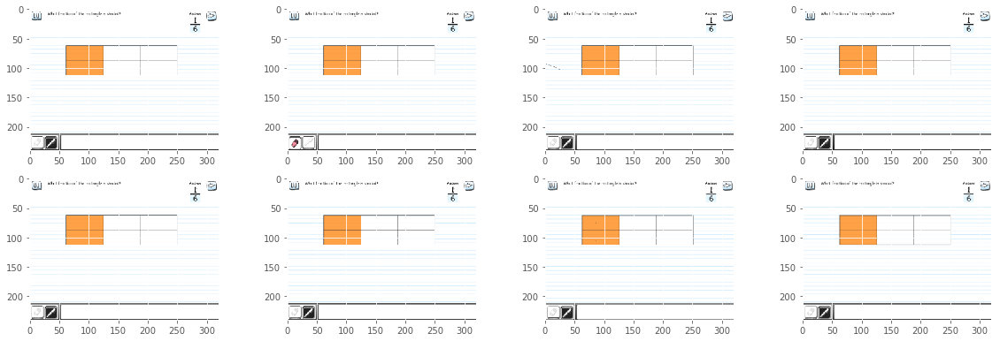

Cluster 2
                           _id behavioral_traits  bonus  correct  diff  \
0     5a00f17c9100de1a390028e9                []   True    False     1   
5313  5a010a229100de1a39647010                []   True    False     1   
5316  5a010a239100de1a39647088                []   True    False     1   
5317  5a010a2b9100de1a39649225                []   True    False     1   
5320  5a010a319100de1a3964aa73                []   True    False     1   
5323  5a010a329100de1a3964ad3e                []   True    False     1   
5330  5a010a389100de1a3964c756                []   True    False     1   
5331  5a010a389100de1a3964c78b                []   True    False     1   
5336  5a010a439100de1a3964f5ce                []   True    False     1   
5311  5a010a1e9100de1a39645d43                []   True    False     1   

              id  incomplete          lesson  \
0     24M2DNktUG       False  model_symbol_6   
5313  24M2DNktUG       False  model_symbol_6   
5316  24M2DNktUG       False  m

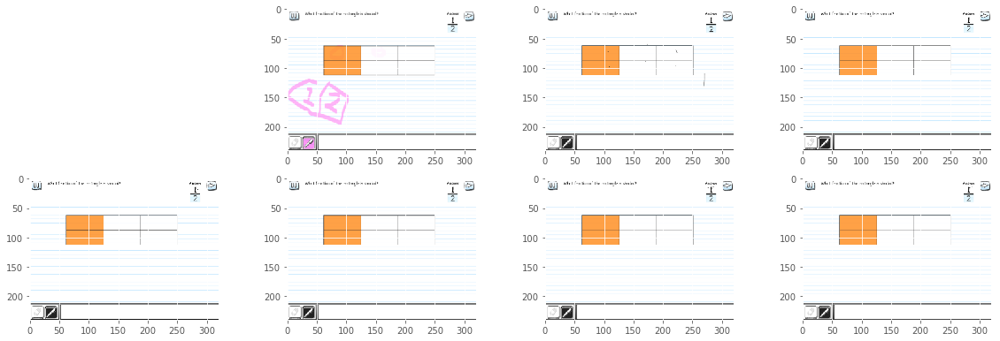

Cluster 0
                           _id behavioral_traits  bonus  correct  diff  \
6     5a00f18a9100de1a39006690                []   True    False     1   
5271  5a0109e29100de1a39636d46                []   True    False     1   
5283  5a0109f89100de1a3963c56c                []   True    False     1   
5292  5a0109ff9100de1a3963e025                []   True    False     1   
5300  5a010a0f9100de1a39642252                []   True    False     1   
5315  5a010a239100de1a39647087                []   True    False     1   
5334  5a010a409100de1a3964e6a7                []   True    False     1   
5265  5a0109d49100de1a3963310f                []   True    False     1   
5337  5a010a499100de1a39650c40                []   True    False     1   
5340  5a010a4a9100de1a3965104e                []   True    False     1   

              id  incomplete          lesson  \
6     24M2DNktUG       False  model_symbol_6   
5271  24M2DNktUG       False  model_symbol_6   
5283  24M2DNktUG       False  m

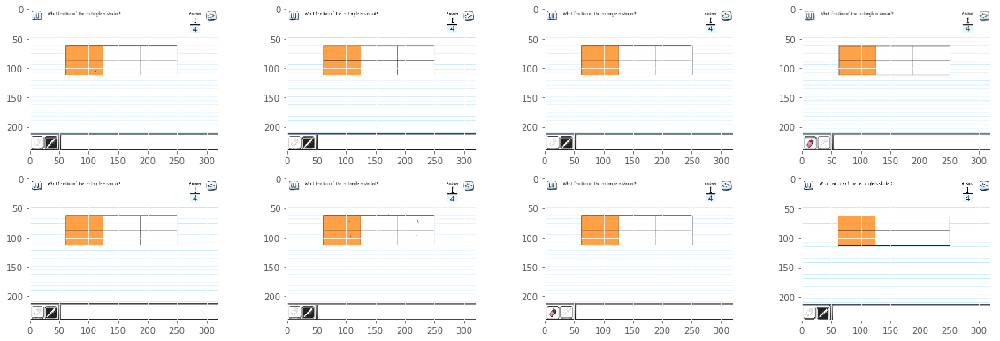

Cluster 9
                           _id behavioral_traits  bonus  correct  diff  \
42    5a00f1c59100de1a39015273                []   True    False     1   
2403  5a00fc359100de1a392c9754                []   True    False     1   
4968  5a0108499100de1a395d1a6c                []   True    False     1   
2367  5a00fbda9100de1a392b3375                []   True    False     1   
5171  5a01095c9100de1a396156c7                []   True    False     1   
2182  5a00faed9100de1a39277d13                []   True    False     1   
2163  5a00fad89100de1a39272971                []   True    False     1   
2158  5a00facf9100de1a39270780                []   True    False     1   
4779  5a01071a9100de1a39586bdc                []   True    False     1   
2109  5a00fa849100de1a3925dd37                []   True    False     1   

              id  incomplete          lesson  \
42    24M2DNktUG       False  model_symbol_6   
2403  24M2DNktUG       False  model_symbol_6   
4968  24M2DNktUG        True  m

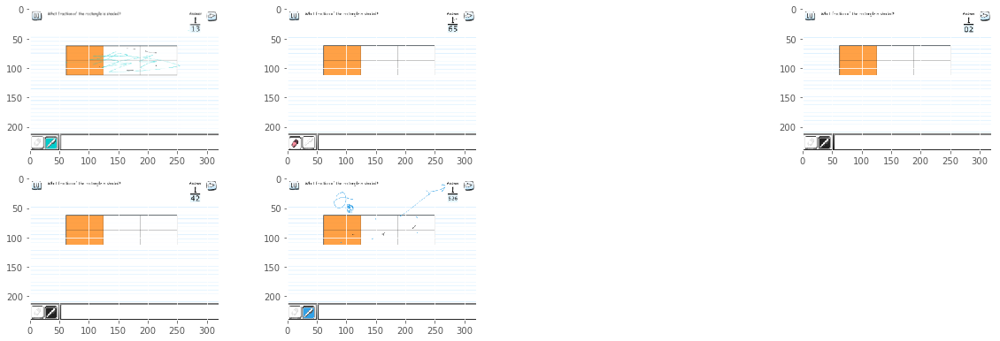

Analysis 26 for qual_id 9wRCzK1G7F.partb.WsTATD5a-k with 12944 samples
Session 0 txt  The orange is the whole unit. Which of these pieces is one third of the orange piece?
Drag the piece to the answer box.
Answer: 1/15
Extracting tf-idf features ...
done in 0.112s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.053s
qual_id 9wRCzK1G7F.partb.WsTATD5a-k has these clusters
9    624
0    294
5    118
1     88
3     70
8     62
4     39
7     24
6     13
2     13
Name: cluster, dtype: int64
Distances (1345, 10) [[ 0.87408822  0.98569845  0.49124625 ...,  0.91939544  0.87708413
   0.8803736 ]
 [ 0.15430373  0.98452313  0.87380661 ...,  0.53942361  0.5278715
   0.21400986]
 [ 0.22049516  0.98449151  0.86763572 ...,  0.53896626  0.52986286
   0.19697452]
 ..., 
 [ 0.21017904  0.9844

/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                           _id behavioral_traits  bonus  correct  diff  \
1172  5a01170d9100de1a3997e24e                []  False    False     1   
939   5a0110ae9100de1a397e7a96                []  False    False     1   
831   5a010c4e9100de1a396d0bc9                []  False    False     1   
451   5a0100029100de1a393be6cb                []  False    False     1   
1234  5a0118129100de1a399bf9be                []  False    False     1   
203   5a00f76f9100de1a39191f36                []  False    False     1   
84    5a00f3ee9100de1a390a0db6                []  False    False     1   
85    5a00f3ee9100de1a390a0db7                []  False    False     1   
1104  5a0115e59100de1a399345d2                []  False    False     1   
198   5a00f7509100de1a391894fa                []  False    False     1   

              id  incomplete           lesson  \
1172  WsTATD5a-k       False  name_fract_1_v2   
939   WsTATD5a-k       False  name_fract_1_v2   
831   WsTATD5a-k       False  name_fra

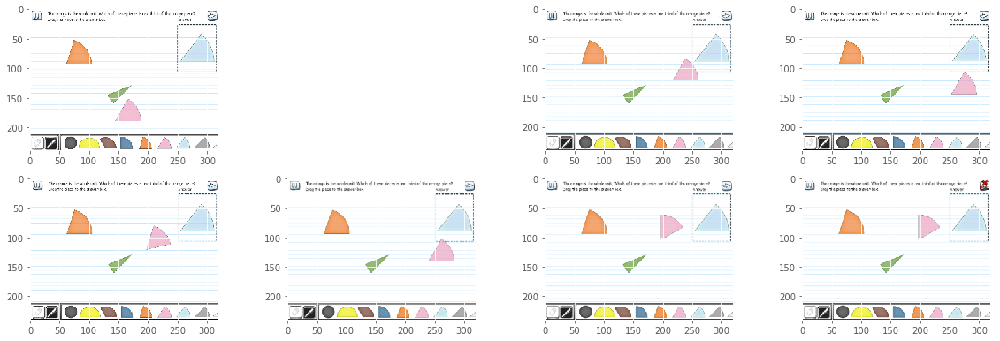

Cluster 0
                           _id behavioral_traits  bonus  correct  diff  \
508   5a0101bb9100de1a3942d752                []  False    False     1   
316   5a00fc269100de1a392c5b47                []  False    False     1   
1255  5a0118509100de1a399cf1a1                []  False    False     1   
598   5a0103dd9100de1a394b7b22                []  False    False     1   
526   5a01021b9100de1a394460e9                []  False    False     1   
641   5a0105649100de1a39519e81                []  False    False     1   
640   5a0105639100de1a395199cb                []  False    False     1   
636   5a0105239100de1a39509ec3                []  False    False     1   
608   5a01041e9100de1a394c8543                []  False    False     1   
583   5a01036c9100de1a3949aec1                []  False    False     1   

              id  incomplete           lesson  \
508   WsTATD5a-k       False  name_fract_1_v2   
316   WsTATD5a-k       False  name_fract_1_v2   
1255  WsTATD5a-k       False

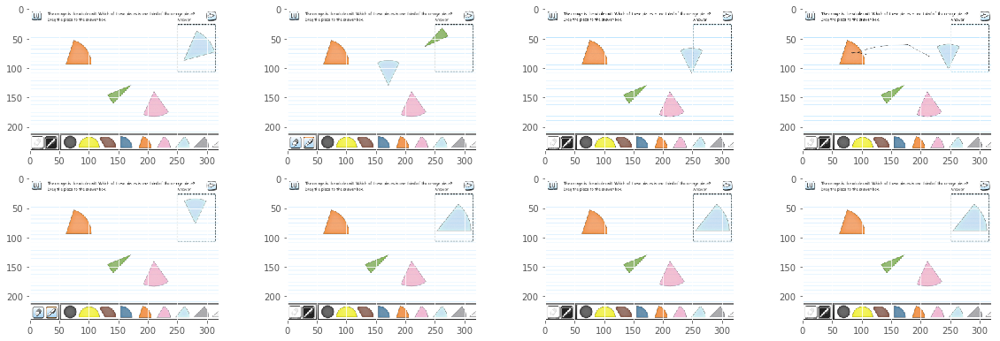

Cluster 5
                           _id behavioral_traits  bonus  correct  diff  \
0     5a00f1799100de1a39001b27                []  False    False     1   
33    5a00f2de9100de1a3905c335                []  False    False     1   
1031  5a0114d29100de1a398eec2f                []  False    False     1   
23    5a00f2099100de1a39026518                []  False    False     1   
307   5a00fb989100de1a392a2c01                []  False    False     1   
591   5a0103b99100de1a394ae73f                []  False    False     1   
280   5a00fa4e9100de1a3925010b                []  False    False     1   
592   5a0103bd9100de1a394afb63                []  False    False     1   
1183  5a01173d9100de1a3998a355                []  False    False     1   
480   5a01008d9100de1a393e0bfd                []  False    False     1   

              id  incomplete           lesson  \
0     WsTATD5a-k       False  name_fract_1_v2   
33    WsTATD5a-k       False  name_fract_1_v2   
1031  WsTATD5a-k       False

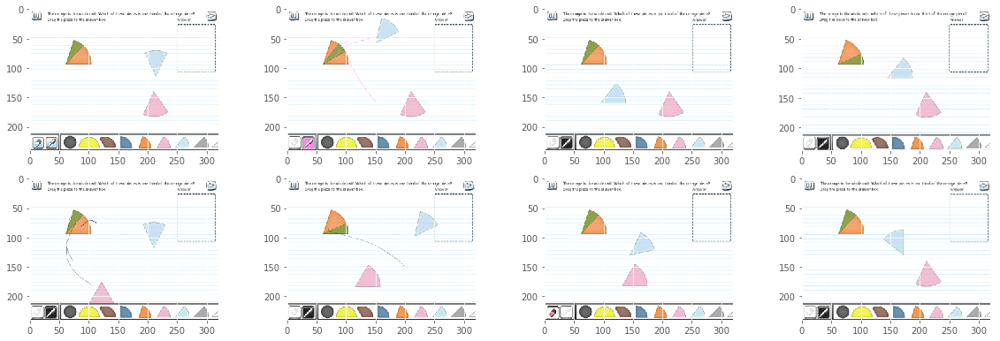

Cluster 1
                          _id behavioral_traits  bonus  correct  diff  \
9    5a00f1ce9100de1a390178fd                []  False    False     1   
749  5a01097c9100de1a3961d41b                []  False    False     1   
730  5a01090f9100de1a39602a9f                []  False    False     1   
724  5a0108d79100de1a395f4b1b                []  False    False     1   
692  5a0107ce9100de1a395b2d79                []  False    False     1   
671  5a0106ea9100de1a3957ac55                []  False    False     1   
658  5a01066a9100de1a3955b603                []  False    False     1   
633  5a0104dd9100de1a394f877d                []  False    False     1   
603  5a0103fc9100de1a394bf968                []  False    False     1   
784  5a010adc9100de1a39675182                []  False    False     1   

             id  incomplete           lesson  \
9    WsTATD5a-k       False  name_fract_1_v2   
749  WsTATD5a-k       False  name_fract_1_v2   
730  WsTATD5a-k       False  name_fract_1_

Analysis 27 for qual_id kvig7fcCVc.partb.Re5yQZp9Kb with 12917 samples
Session 0 txt  Arrange these fractions from least to greatest.
Drag each fraction into one of the boxes below.
Answer: 1/12,1/8,1/4
Extracting tf-idf features ...
done in 0.236s.
Clustering with MiniBatchKMeans(batch_size=1000, compute_labels=True, init='k-means++',
        init_size=1000, max_iter=100, max_no_improvement=10, n_clusters=10,
        n_init=1, random_state=62, reassignment_ratio=0.01, tol=0.0,
        verbose=0)
done in 0.084s
qual_id kvig7fcCVc.partb.Re5yQZp9Kb has these clusters
5    518
7    384
1    104
4     12
Name: cluster, dtype: int64
Distances (1018, 10) [[  1.31956150e-01   1.00000000e+00   2.58095683e-08 ...,   1.31956150e-01
    1.31956150e-01   2.10734243e-08]
 [  1.00000000e+00   0.00000000e+00   1.00000000e+00 ...,   1.00000000e+00
    1.00000000e+00   1.00000000e+00]
 [  1.00000000e+00   0.00000000e+00   1.00000000e+00 ...,   1.00000000e+00
    1.00000000e+00   1.00000000e+00]
 ..., 


/Users/brianmckean/anaconda2/envs/hwenv/lib/python3.6/site-packages/ipykernel/__main__.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


                          _id behavioral_traits  bonus  correct      diff  \
0    5a00f17f9100de1a390037a3                []  False    False  0.530333   
402  5a00ff8d9100de1a393a1483                []  False    False  0.530333   
401  5a00ff8b9100de1a393a0b59                []  False    False  0.530333   
400  5a00ff8b9100de1a393a0b58                []  False    False  0.530333   
399  5a00ff899100de1a393a0398                []  False    False  0.530333   
398  5a00ff899100de1a393a0397                []  False    False  0.530333   
397  5a00ff749100de1a3939ade3                []  False    False  0.530333   
396  5a00ff6d9100de1a3939931b                []  False    False  0.530333   
395  5a00ff6d9100de1a3939931a                []  False    False  0.530333   
393  5a00ff6d9100de1a393990de                []  False    False  0.530333   

             id  incomplete            lesson  \
0    Re5yQZp9Kb       False    adv_ordering_2   
402  Re5yQZp9Kb       False    adv_ordering_2   
401  

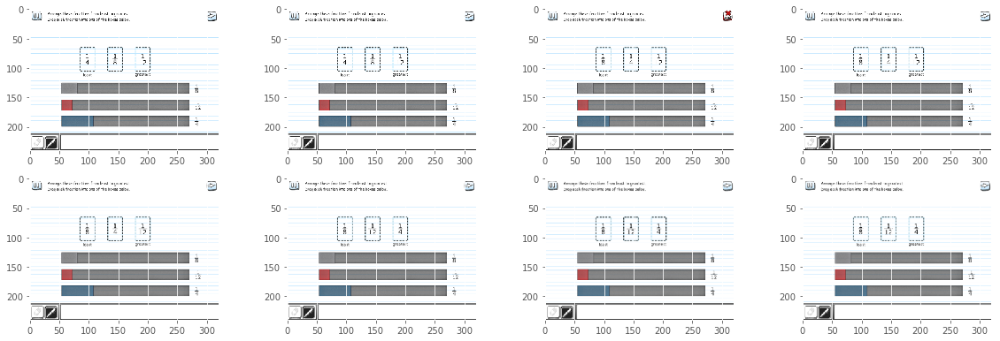

Cluster 7
                          _id behavioral_traits  bonus  correct      diff  \
457  5a0102149100de1a39444292                []  False    False  0.530333   
874  5a0114999100de1a398e0b23                []  False    False  0.530333   
873  5a01148a9100de1a398dce8d                []  False    False  0.530333   
872  5a0114769100de1a398d80b9                []  False    False  0.530333   
871  5a01145d9100de1a398d1f98                []  False    False  0.530333   
869  5a01141d9100de1a398c2607                []  False    False  0.530333   
868  5a0114149100de1a398c0080                []  False    False  0.530333   
867  5a0114089100de1a398bd00b                []  False    False  0.530333   
865  5a0113cf9100de1a398aec0e                []  False    False  0.530333   
862  5a0113be9100de1a398aa712                []  False    False  0.530333   

             id  incomplete            lesson  \
457  Re5yQZp9Kb       False  basic_ordering_1   
874  Re5yQZp9Kb       False  basic_ordering_

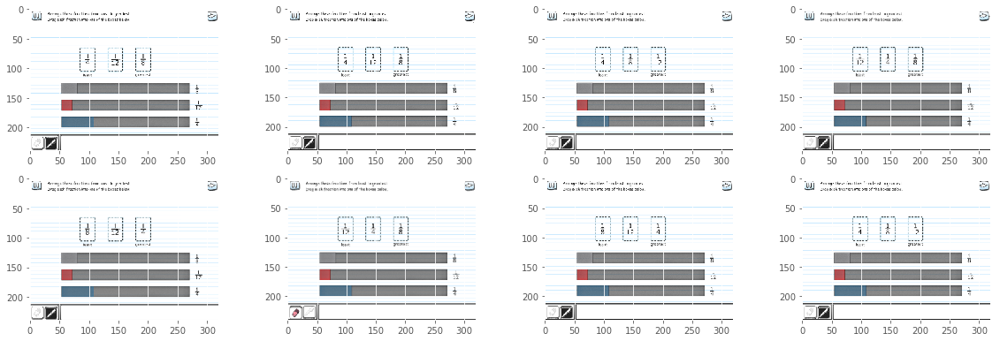

Cluster 1
                          _id behavioral_traits  bonus  correct      diff  \
1    5a00f1879100de1a39005a6a                []  False    False  0.530333   
727  5a010e769100de1a39759dca                []  False    False  0.530333   
712  5a010d299100de1a39706c50                []  False    False  0.530333   
705  5a010ccf9100de1a396f0e2f                []  False    False  0.530333   
678  5a010c049100de1a396bea41                []  False    False  0.530333   
676  5a010bd79100de1a396b3531                []  False    False  0.530333   
672  5a010b9f9100de1a396a539f                []  False    False  0.530333   
668  5a010b629100de1a39696508                []  False    False  0.530333   
665  5a010b249100de1a396870a2                []  False    False  0.530333   
656  5a010a889100de1a39660af5                []  False    False  0.530333   

             id  incomplete            lesson  \
1    Re5yQZp9Kb       False  basic_ordering_1   
727  Re5yQZp9Kb       False    adv_ordering_

Cluster 4
                          _id behavioral_traits  bonus  correct      diff  \
353  5a00fdbe9100de1a3932ce60                []  False    False  0.530333   
354  5a00fdbe9100de1a3932ce5f                []  False    False  0.530333   
384  5a00ff509100de1a39391bd2                []  False    False  0.530333   
311  5a00fc5d9100de1a392d324f                []  False    False  0.530333   
722  5a010df29100de1a39738b48                []  False    False  0.530333   
562  5a0106db9100de1a39577420                []  False    False  0.530333   
919  5a01159a9100de1a39921b23                []  False    False  0.530333   
245  5a00f8a09100de1a391e2d92                []  False    False  0.530333   
631  5a0109ab9100de1a39628eaa                []  False    False  0.530333   
249  5a00f8d99100de1a391f14ff                []  False    False  0.530333   

             id  incomplete            lesson  \
353  Re5yQZp9Kb       False  basic_ordering_1   
354  Re5yQZp9Kb       False  basic_ordering_

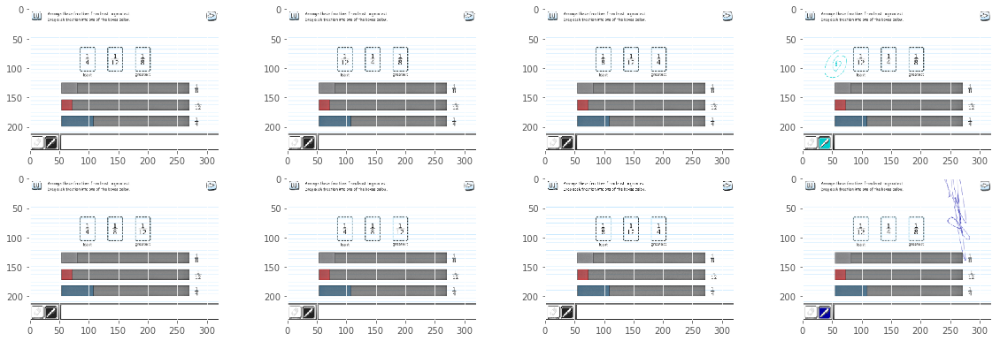

Analysis 28 for qual_id Syxag5tFow.parta.kg0JZgPiTI with 12712 samples
Session 0 txt  Drag the fractions that have a numerator of 2 to
the answer box.
Answer: ans0,ans1
Extracting tf-idf features ...


ValueError: After pruning, no terms remain. Try a lower min_df or a higher max_df.

In [24]:
for row in range(len(top_qual_id)):

    this_qid = top_qual_id.iloc[row]['_id']['qual_id']
    count = top_qual_id.iloc[row]['count']
    print ('Analysis {0} for qual_id {1} with {2} samples'.format(row, this_qid, count))


    prob_set = db.anon_student_task_responses.find({'qual_id':this_qid, 'correct': False})
    df3 = make_doc_data_set(prob_set)
    print ('Session 0 txt ', df3.iloc[0]['txt'])   
    df_top.append(df3.copy())
    data_samples = df3['response_doc']
    km, km_transform = make_k_means(data_samples, clusters=10)
    df3['cluster'] = km.labels_
    print ('qual_id {0} has these clusters'.format(this_qid))
    print (df3['cluster'].value_counts())
      
    print ('Distances', km_transform.shape,  km_transform)
    df3['distance'] = df3['cluster']
    #for row in range(len(df3)):
    #    df3.iloc[row]['distance'] = km_transform[row][df3.iloc[row]['distance']]
        
    df3['distance'] =  df3.apply(lambda x: (km_transform[x.name][x['cluster']]) , axis=1)
    columns = 4
    num_images = 8
    # Look at top four clusters
    # Print 
    for cluster in (df3['cluster'].value_counts().keys())[:4]:
        plt.clf
        plt.figure(figsize=(20,10))
        print ('Cluster', cluster )

        cluster_data = df3[df3['cluster']==cluster]
        
        # Sort the cluster data 
        cluster_data.sort_values(by=['distance'], inplace=True)
        
        print (cluster_data[:10])
        images = []
        
        
        
        
        for idx in range(min(num_images, df3['cluster'].value_counts()[cluster])):
            #    images.append(Image(cluster_data.iloc[idx]['screenshot_url']))
            # create a file-like object from the url
            print (cluster_data.iloc[idx]['screenshot_url'])
            try:
                f = urllib.request.urlopen(cluster_data.iloc[idx]['screenshot_url'])
            except:
                print(' could not read {0}'.format(cluster_data.iloc[idx]['screenshot_url']))
                continue
            # read the image file in a numpy array
            a = plt.imread(f)
            #plt.imshow(a)
            #plt.show()
            #print(image)
            #display(image)
            plt.subplot(min(9, df3['cluster'].value_counts()[cluster]) / columns + 1, columns, idx + 1)
            plt.imshow(a)

        plt.show()
        

    
    

In [ ]:
km_transform[1][1]

In [ ]:
df3.index